In [1]:
%load_ext pycodestyle_magic
%flake8_on

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from functions import *
import timeit
from datetime import datetime
from sklearn.model_selection import train_test_split

# preprocessing
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import FunctionTransformer

# modelisation
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import DBSCAN
from sklearn_extra.cluster import KMedoids
from sklearn import manifold
# PCA  :
from sklearn import decomposition

# Evaluation
from sklearn.metrics.cluster import davies_bouldin_score, silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import InterclusterDistance
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

5:1: F403 'from functions import *' used; unable to detect undefined names


# FONCTIONS

In [3]:
def plot_dendrogram_sklearn(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    print(0.7*max(linkage_matrix[:, 2]))

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [4]:
def display_circles_visu(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
    for d1, d2 in axis_ranks:
        if d2 < n_comp:
            # détermination des limites du graphique
            if lims is not None:
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30:
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else:
                xmin, xmax, ymin, ymax = min(pcs[d1, :]), max(pcs[d1, :]), min(pcs[d2, :]), max(pcs[d2, :])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30:
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                           pcs[d1, :], pcs[d2, :],
                           angles='xy', scale_units='xy', scale=1, color="grey")
            else:
                lines = [[[0, 0], [x, y]] for x, y in pcs[[d1, d2]].T]
                ax.add_collection(LineCollection(lines,
                                                 axes=ax,
                                                 alpha=.1,
                                                 color='black'))

            # affichage des noms des variables
            if labels is not None:
                for i, (x, y) in enumerate(pcs[[d1, d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax:
                        plt.text(x, y, labels[i], fontsize='14',
                                 ha='center', va='center', rotation=label_rotation,
                                 color="blue", alpha=0.5)

            # affichage du cercle
            circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)

            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1,
                                          round(100*pca.explained_variance_ratio_[d1], 1)))
            plt.ylabel('F{} ({}%)'.format(d2+1,
                                          round(100*pca.explained_variance_ratio_[d2], 1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))

1:80: E501 line too long (97 > 79 characters)
2:80: E501 line too long (82 > 79 characters)
11:80: E501 line too long (107 > 79 characters)
14:80: E501 line too long (88 > 79 characters)
18:80: E501 line too long (80 > 79 characters)
31:80: E501 line too long (83 > 79 characters)
48:80: E501 line too long (91 > 79 characters)
50:80: E501 line too long (91 > 79 characters)
52:80: E501 line too long (80 > 79 characters)


In [5]:
def display_factorial_planes_visu(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1, d2 in axis_ranks:
        if d2 < n_comp:
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1],
                                X_projected[selected, d2],
                                alpha=alpha,
                                label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i, (x, y) in enumerate(X_projected[:, [d1, d2]]):
                    plt.text(x, y, labels[i],
                             fontsize='14',
                             ha='center',
                             va='center')

            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1, d2]])) * 1.1
            plt.xlim([-boundary, boundary])
            plt.ylim([-boundary, boundary])

            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1], 1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2], 1)))

1:80: E501 line too long (117 > 79 characters)
6:80: E501 line too long (80 > 79 characters)
35:80: E501 line too long (97 > 79 characters)
36:80: E501 line too long (97 > 79 characters)


In [6]:
def affichage_clustering_liste(X, X_kmeans, liste_k):
    '''
    va permettre d'afficher la projection PCA + les bloxplot pour les models+k
    retenu avec la pré-analyse
    '''
    start = timeit.default_timer()
    compteur = 1

    plt.figure(figsize=(20, 5*len(liste_k)*2.5+1))
    for nb_cluster in liste_k:
        start = timeit.default_timer()
        print('-'*10)
        print('nb cluster =', nb_cluster)

        # calcul model avec nb_cluster et linkage
        kmeans = make_pipeline(preprocessor_quanti,
                               KMeans(n_clusters=nb_cluster, random_state=0))
        X_scaled = pd.DataFrame(kmeans['columntransformer'].fit_transform(X_kmeans),
                                columns=kmeans['columntransformer'].get_feature_names_out())
        X_cluster = kmeans.fit_predict(X_kmeans)
        Affichage_duree(start)

        # Calcul des scores de Davies-Bouldin et Silhouette
        DB_score = davies_bouldin_score(X_scaled, X_cluster)
        S_score = silhouette_score(X_scaled, X_cluster)

        # Affichage PCA
        plt.subplot(len(liste_k)*2+1, 4, compteur)
        plt.title("Visu PCA \nnb clusters={}".format(nb_cluster))
        display_factorial_planes_visu(X_projected,
                                      n_comp,
                                      pca.named_steps['pca'],
                                      [(0, 1)],
                                      alpha=0.5,
                                      illustrative_var=X_cluster)
        plt.text(-10, -10, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
                 horizontalalignment='left', verticalalignment='bottom')

        compteur += 1

        # pour affichage des boxplot
        resultat = X.copy()
        X_cluster = pd.DataFrame(X_cluster, columns=['cluster'])
        resultat = resultat.merge(X_cluster, left_index=True, right_index=True)

        # affichage du nombre d'individu par classe
        plt.subplot(len(liste_k)*2+1, 4, compteur)
        plt.hist(resultat['cluster'],
                 align='left');
        compteur += 1

        # Affichage boxplot
        for feature in X.columns:
            plt.subplot(len(liste_k)*2+1, 4, compteur)
            plt.title(feature)
            sns.boxplot(data=resultat,
                        y=feature,
                        x='cluster')
            compteur += 1

    # Cercle des corrélations pour les 2 premiers rangs d'inertie
    pcs = pca.named_steps['pca'].components_
    plt.subplot(len(liste_k)*2+1, 4, compteur)
    display_circles_visu(pcs, n_comp,
                         pca.named_steps['pca'],
                         [(0, 1)],
                         labels=np.array(features))

    Affichage_duree(start)

18:80: E501 line too long (84 > 79 characters)
19:80: E501 line too long (92 > 79 characters)
36:80: E501 line too long (91 > 79 characters)
49:31: E703 statement ends with a semicolon


In [7]:
def visualisation_clustering_definitif(X, X_kmeans, k):
    kmeans = make_pipeline(preprocessor_quanti,
                           KMeans(n_clusters=k, random_state=0))
    X_scaled = pd.DataFrame(kmeans['columntransformer'].fit_transform(X_kmeans),
                            columns=kmeans['columntransformer'].get_feature_names_out())
    X_cluster = kmeans.fit_predict(X_kmeans)

    # Calcul des scores de Davies-Bouldin et Silhouette
    DB_score = davies_bouldin_score(X_scaled, X_cluster)
    S_score = silhouette_score(X_scaled, X_cluster)

    nb_lignes_figure = int(np.ceil((X_kmeans.shape[1]+2)/3)+1)
    plt.figure(figsize=(21, 7*nb_lignes_figure))
    compteur = 1

    # Affichage PCA
    plt.subplot(nb_lignes_figure, 3, compteur)
    plt.title("Visu PCA \nnb clusters={}".format(k))
    display_factorial_planes_visu(X_projected,
                                  n_comp,
                                  pca.named_steps['pca'],
                                  [(0, 1)],
                                  alpha=0.5,
                                  illustrative_var=X_cluster)
    plt.text(-20, -20, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
             horizontalalignment='left', verticalalignment='bottom')
    compteur += 1

    # Cercle des corrélations pour les 2 premiers rangs d'inertie
    pcs = pca.named_steps['pca'].components_
    plt.subplot(nb_lignes_figure, 3, compteur)
    display_circles_visu(pcs, n_comp,
                         pca.named_steps['pca'],
                         [(0, 1)],
                         labels=np.array(features))
    compteur += 1

    # pour affichage des boxplot
    resultat = X_kmeans.copy()
    X_cluster = pd.DataFrame(X_cluster, columns=['cluster'])
    resultat = resultat.merge(X_cluster, left_index=True, right_index=True)

    # affichage du nombre d'individu par classe
    plt.subplot(nb_lignes_figure, 3, compteur)
    plt.hist(resultat['cluster'],
             range=(-0.5, resultat['cluster'].max()+0.5),
             align='left');

    compteur += 1

    # # Affichage boxplot
    for feature in X_kmeans.columns:
        plt.subplot(nb_lignes_figure, 3, compteur)
        plt.title(feature)
        sns.boxplot(data=resultat,
                    y=feature,
                    x='cluster')
        compteur += 1

    stats = resultat.groupby('cluster').agg(['mean', 'median', 'var'])
    return resultat, stats

4:80: E501 line too long (80 > 79 characters)
5:80: E501 line too long (88 > 79 characters)
25:80: E501 line too long (87 > 79 characters)
47:27: E703 statement ends with a semicolon


In [8]:
def accuracy_clustering(labels_true, labels_pred):
    '''
    calcul du score d'accuracy entre le label de reference (M0)
    et le label prédit il faut d'abord faire la correspondance
    entre les labels via une matrice de confusion
    '''
    # calcul de la matrice de confusion
    cm = confusion_matrix(labels_true, labels_pred)
    # alignement le long de la diagonale des correspondances des clusters
    labels_pred_modif = labels_pred.copy()
    for i in range(0, 6):
        if np.argmax(cm, axis=1)[i] == i:
            next
        else:
            labels_pred_modif[labels_pred == np.argmax(cm, axis=1)[i]] = i
    score_accuracy = accuracy_score(labels_true, labels_pred_modif)

    return score_accuracy

In [9]:
start_time_ALL = timeit.default_timer()

# import des données

In [10]:
data = pd.read_csv('../01_DATA/data_for_modeling_2022-02-18_21h35.csv')
data = data.astype({'Récence': float, 'nb commande par client': float})
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80277 entries, 0 to 80276
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              80277 non-null  int64  
 1   customer_unique_id      80277 non-null  object 
 2   Montant dépensé         80277 non-null  float64
 3   Récence                 80277 non-null  float64
 4   satisfaction            80277 non-null  float64
 5   delais livraison        80277 non-null  float64
 6   nb commande par client  80277 non-null  float64
 7   nb item par commande    80277 non-null  float64
 8   product_meta_category   80277 non-null  object 
 9   encombrement_dm3        80277 non-null  float64
dtypes: float64(7), int64(1), object(2)
memory usage: 6.1+ MB


In [11]:
pourcent_NA_df(data)

Il y a 100.00% valeurs renseignées (soit 0.00 % de valeurs manquantes) dans l'intégralité du df


In [12]:
data = data.dropna(axis=0).drop('Unnamed: 0', axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80277 entries, 0 to 80276
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   customer_unique_id      80277 non-null  object 
 1   Montant dépensé         80277 non-null  float64
 2   Récence                 80277 non-null  float64
 3   satisfaction            80277 non-null  float64
 4   delais livraison        80277 non-null  float64
 5   nb commande par client  80277 non-null  float64
 6   nb item par commande    80277 non-null  float64
 7   product_meta_category   80277 non-null  object 
 8   encombrement_dm3        80277 non-null  float64
dtypes: float64(7), object(2)
memory usage: 5.5+ MB


## Data pour test rapide

In [13]:
# data = data.sample(frac=0.1)

# Preprocessing

In [14]:
# listes de variables quantitatives vs qualitatives
X_quanti = []
X_categ = []
X_var_log = []
X_var_nolog = []

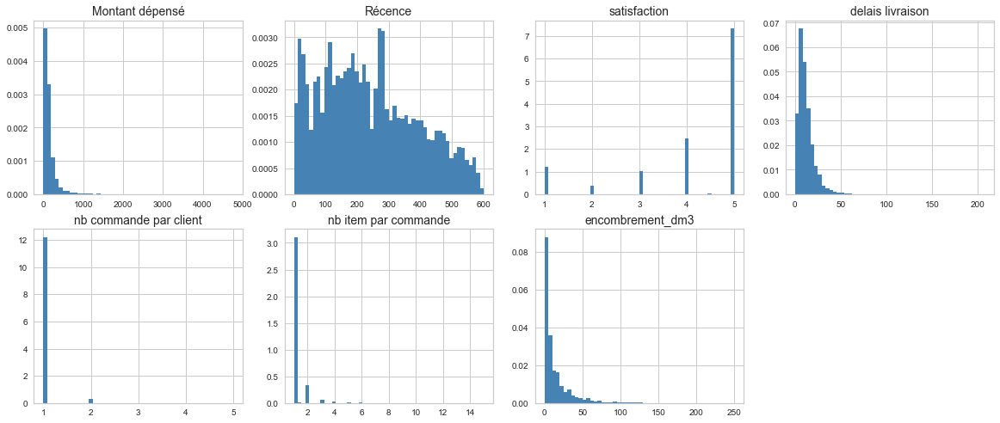

In [15]:
fig = plt.figure(figsize=(20, 35))
compteur = 1
for feat_idx in data.select_dtypes(['float64', 'int64']):
    ax = fig.add_subplot(8, 4, (compteur))
    h = ax.hist(data[feat_idx], bins=50,
                color='steelblue',
                density=True,
                edgecolor='none')
    ax.set_title(feat_idx, fontsize=14)
    compteur += 1

In [16]:
# mise en place du pipelines pour les données quantitatives
quanti_pipeline = make_pipeline(StandardScaler())

In [17]:
# mise en place du pipelines pour les données catégorielles
categ_pipeline = make_pipeline(OneHotEncoder())

In [18]:
# mise en place du pipeline pour la transformation log

# fonction pour utiliser le log dans les pipelines
def log_transform(x):
    return np.log1p(x)


log_transformer = FunctionTransformer(log_transform)

quanti_log_pipeline = make_pipeline(log_transformer, StandardScaler())

In [19]:
preprocessor_quanti_categ = make_column_transformer((quanti_pipeline, X_quanti),
                                                    (categ_pipeline, X_categ))
preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

preprocessor_log = make_column_transformer((quanti_pipeline, X_var_nolog),
                                           (quanti_log_pipeline, X_var_log))

1:80: E501 line too long (80 > 79 characters)


# Tests pour visualisation

##  t-SNE

### data quanti + categ

In [20]:
# données
X = data.drop(['customer_unique_id',
               'encombrement_dm3'], axis=1).dropna(axis=0)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X.select_dtypes(['float64', 'int64']).columns)
X_categ = list(X.select_dtypes(['object']).columns)

preprocessor_quanti_categ = make_column_transformer((quanti_pipeline, X_quanti),
                                                    (categ_pipeline, X_categ))

8:80: E501 line too long (80 > 79 characters)


C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change f

Temps d'exécution : 48.09min


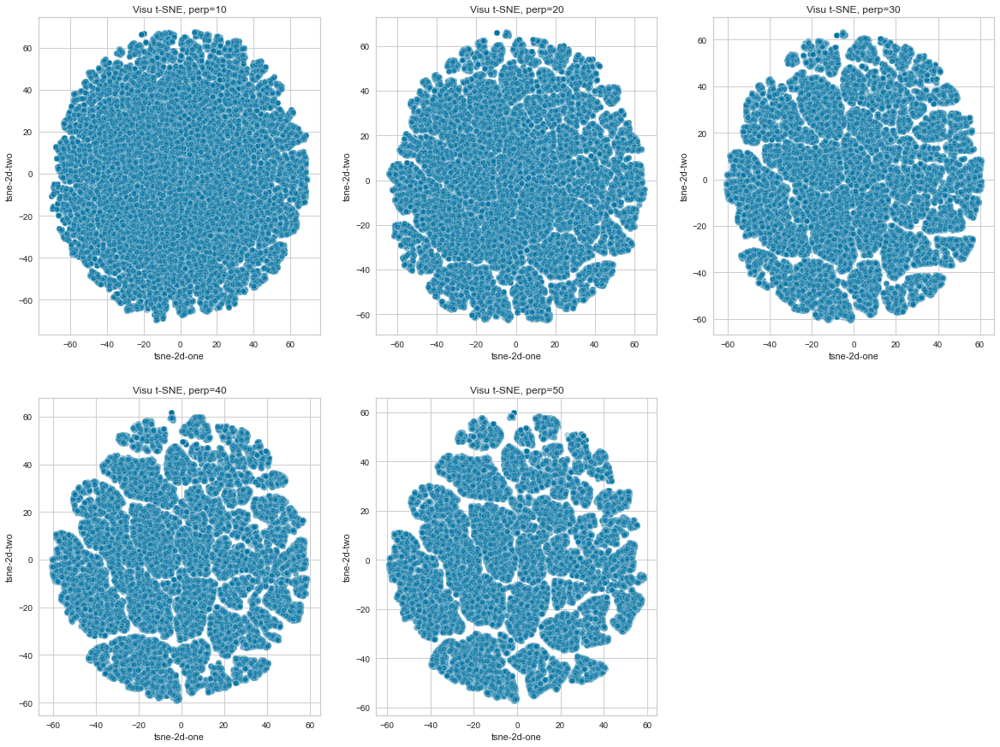

In [21]:
start = timeit.default_timer()

compteur = 1
plt.figure(figsize=(20, 15))

# tSNE  :
for perp in range(10, 51, 10):
    tsne = make_pipeline(preprocessor_quanti_categ,
                         manifold.TSNE(n_components=2,
                                       init='pca',
                                       perplexity=perp))
    X_trans = tsne.fit_transform(X)

    # pour l'affichage
    df_subset = X.copy()

    df_subset['tsne-2d-one'] = X_trans[:, 0]
    df_subset['tsne-2d-two'] = X_trans[:, 1]

    plt.subplot(2, 3, compteur)
    plt.title("Visu t-SNE, perp={}".format(perp))
    sns.scatterplot(x="tsne-2d-one",
                    y="tsne-2d-two",
                    data=df_subset,
                    legend="full",
                    alpha=0.3)
    compteur += 1

duree = Affichage_duree(start)

### data uniquement quanti, sans transformation log

In [22]:
# données
X = data.drop(['customer_unique_id',
               'product_meta_category'], axis=1).dropna(axis=0)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change f

Temps d'exécution : 30.94min


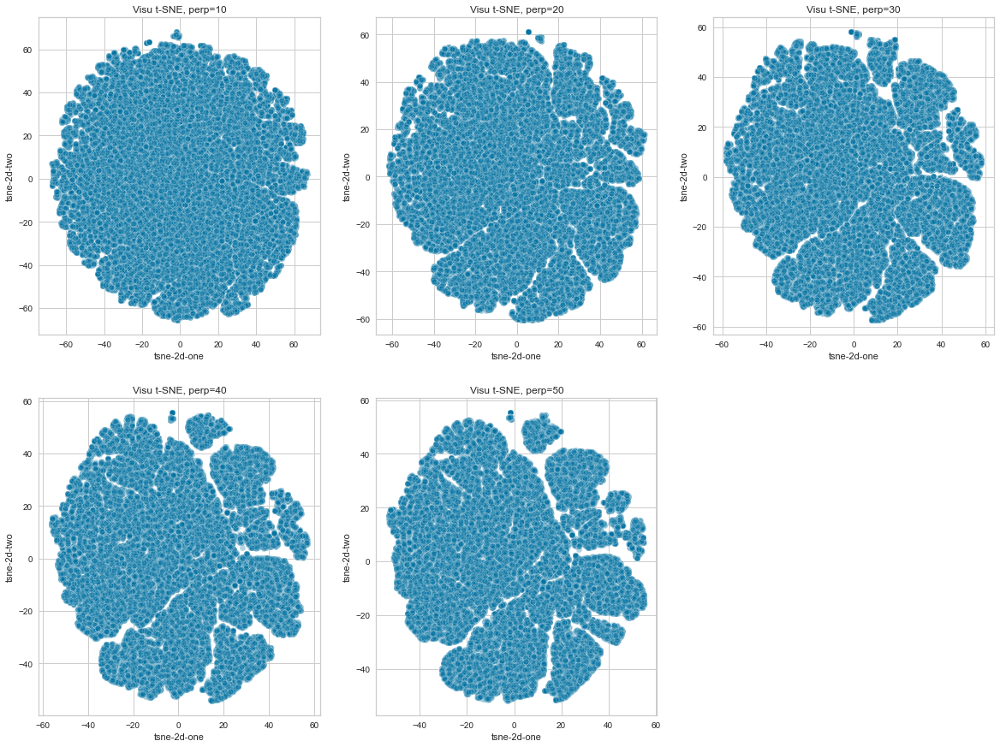

In [23]:
start = timeit.default_timer()

compteur = 1
plt.figure(figsize=(20, 15))

# tSNE  :
for perp in range(10, 51, 10):
    tsne = make_pipeline(preprocessor_quanti,
                         manifold.TSNE(n_components=2,
                                       init='pca',
                                       perplexity=perp))
    X_trans = tsne.fit_transform(X)

    # pour l'affichage
    df_subset = X.copy()

    df_subset['tsne-2d-one'] = X_trans[:, 0]
    df_subset['tsne-2d-two'] = X_trans[:, 1]

    plt.subplot(2, 3, compteur)
    plt.title("Visu t-SNE, perp={}".format(perp))
    sns.scatterplot(x="tsne-2d-one",
                    y="tsne-2d-two",
                    data=df_subset,
                    legend="full",
                    alpha=0.3)
    compteur += 1

duree = Affichage_duree(start)

### data uniquement quanti, avec log(features) sur features asymétriques

In [24]:
# données
X = data.drop(['customer_unique_id',
               'product_meta_category'], axis=1).dropna(axis=0)
# variables qui seront transformées ou non
X_var_log = ['Montant dépensé',
             'delais livraison',
             'nb commande par client',
             'nb item par commande']
X_var_nolog = list(X.select_dtypes(['float64', 'int64']).drop(X_var_log, axis=1).columns)

preprocessor_log = make_column_transformer((quanti_pipeline, X_var_nolog),
                                           (quanti_log_pipeline, X_var_log))

9:80: E501 line too long (89 > 79 characters)


C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change f

Temps d'exécution : 30.72min


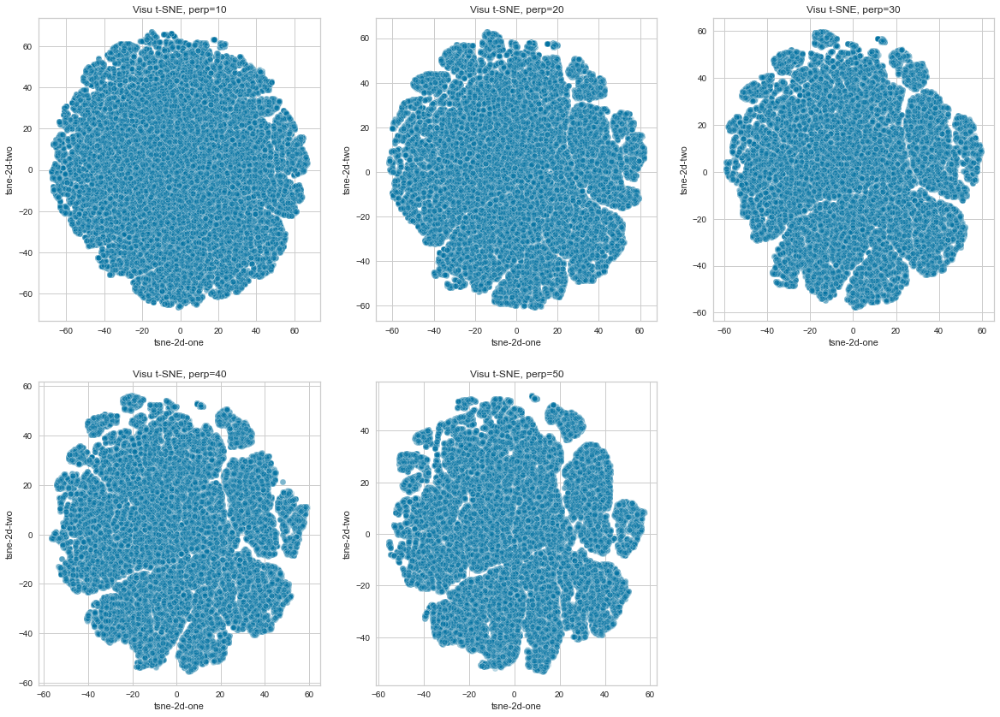

In [25]:
start = timeit.default_timer()

compteur = 1
plt.figure(figsize=(20, 30))

# tSNE  :
for perp in range(10, 51, 10):
    tsne = make_pipeline(preprocessor_log,
                         manifold.TSNE(n_components=2,
                                       init='pca',
                                       perplexity=perp))
    X_trans = tsne.fit_transform(X)

    # pour l'affichage
    df_subset = X.copy()

    df_subset['tsne-2d-one'] = X_trans[:, 0]
    df_subset['tsne-2d-two'] = X_trans[:, 1]

    plt.subplot(4, 3, compteur)
    plt.title("Visu t-SNE, perp={}".format(perp))
    sns.scatterplot(x="tsne-2d-one",
                    y="tsne-2d-two",
                    data=df_subset,
                    legend="full",
                    alpha=0.3)
    compteur += 1

duree = Affichage_duree(start)

### Conclusion
t-SNE très gourmand en temps et difficile à interpréter. De plus, projeter un clustering issu par exemple d'un k-means reviendrait à projeter un clustering sur une autre méthode de clustering, ce qui ne serait pas forcément facile à interpréter.
Le paramètre par défaut de perplexité (30) semble pertinent pour ces données

## PCA
### Data quanti + categ
PCA pas possible sur données catéorielles car pretraitement génère des données 'sparses'

### Data uniquement quanti sans transfo log

In [26]:
# données
X = data.drop(['customer_unique_id',
               'product_meta_category'], axis=1).dropna(axis=0)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

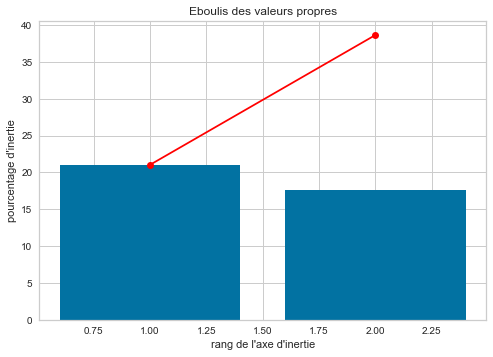

Temps d'exécution : 0.18s


In [27]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X)

duree = Affichage_duree(start)

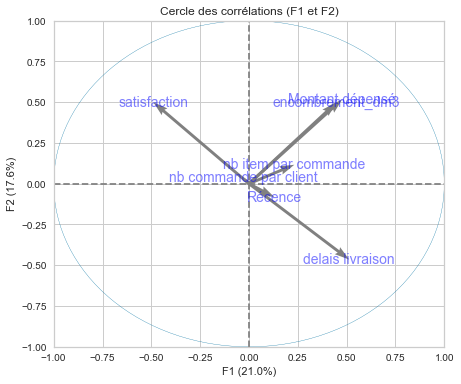

In [28]:
# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
display_circles(pcs,
                n_comp,
                pca.named_steps['pca'],
                [(0, 1)],
                labels=np.array(features))

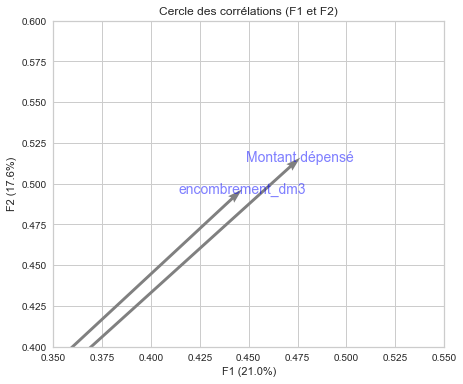

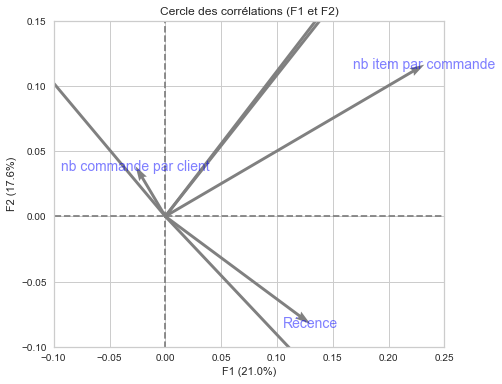

In [29]:
# zoom sur les zones regroupées du premier plan
display_circles(pcs,
                n_comp,
                pca.named_steps['pca'],
                [(0, 1)],
                lims=[0.35, 0.55, 0.4, 0.6],
                labels=np.array(features))
display_circles(pcs,
                n_comp,
                pca.named_steps['pca'],
                [(0, 1)],
                lims=[-0.1, 0.25, -0.1, 0.15],
                labels=np.array(features))

- Montant dépensé et encombrement sont très corrélés : plus le montant de la commande est grand, plus l'encombrement des produits est grand
- nb commande par client n'est pas très expliqué par le premier plan factoriel
- satisfaction et délais de livraison sont anti-corrélé : si le délais de livraison est élevé alors la satisfaction est plutôt basse

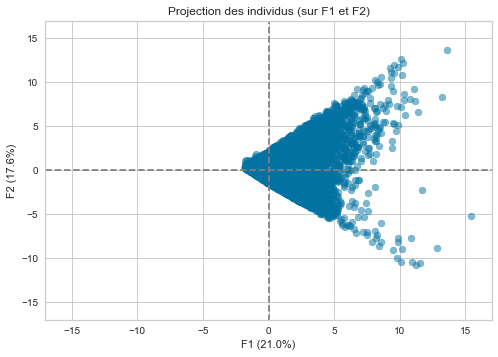

In [30]:
# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)
display_factorial_planes(X_projected,
                         n_comp,
                         pca.named_steps['pca'],
                         [(0, 1)],
                         alpha=0.5)
plt.show()

### Data uniquement quanti avec log(features) asymétriques

In [31]:
# données
X = data.drop(['customer_unique_id',
               'product_meta_category'], axis=1).dropna(axis=0)
# variables qui seront transformées ou non
X_var_log = ['Montant dépensé',
             'delais livraison',
             'nb commande par client',
             'nb item par commande']
X_var_nolog = X.select_dtypes(['float64', 'int64'])
X_var_nolog = X_var_nolog.drop(X_var_log, axis=1)
X_var_nolog = list(X_var_nolog.columns)

preprocessor_log = make_column_transformer((quanti_pipeline, X_var_nolog),
                                           (quanti_log_pipeline, X_var_log))

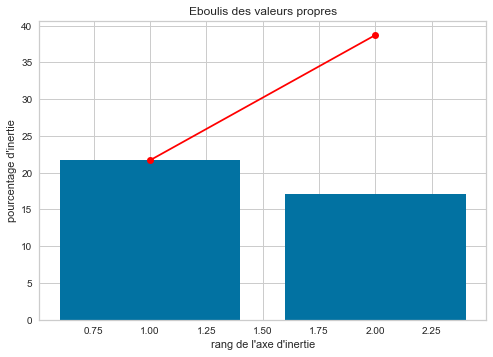

Temps d'exécution : 0.17s


In [32]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_log, decomposition.PCA(n_components=n_comp))
pca.fit(X)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X)

duree = Affichage_duree(start)

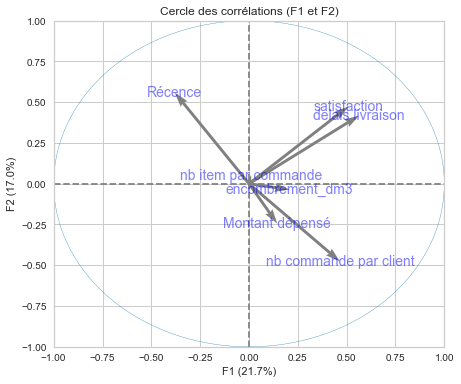

In [33]:
# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
display_circles(pcs,
                n_comp,
                pca.named_steps['pca'],
                [(0, 1)],
                labels=np.array(features))

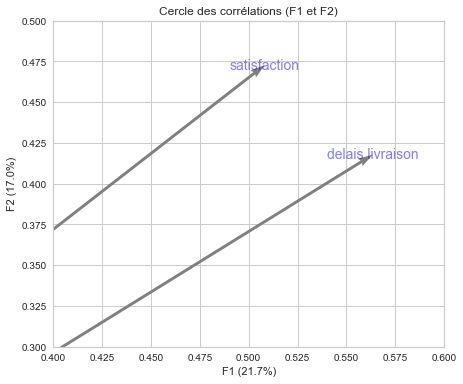

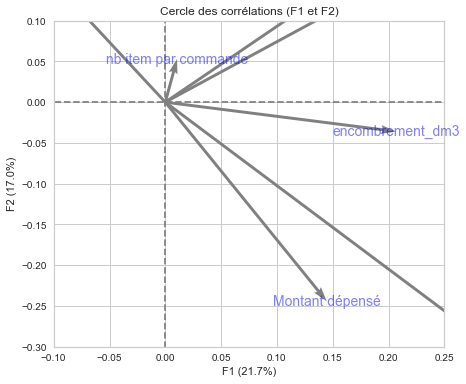

In [34]:
# zoom sur les zones regroupées du premier plan
display_circles(pcs,
                n_comp,
                pca.named_steps['pca'],
                [(0, 1)],
                lims=[0.4, 0.6, 0.3, 0.5],
                labels=np.array(features))
display_circles(pcs,
                n_comp,
                pca.named_steps['pca'],
                [(0, 1)],
                lims=[-0.1, 0.25, -0.3, 0.1],
                labels=np.array(features))

- Satisfaction et délais de livraison sont corrélés : le passage au log de la variable délais de livraison a atténué l'importance des grandes valeurs, hors ce sont probablement ces grandes valeurs qui provoquent des commentaires négatifs
- Encombrement et montant dépensé semble un peu corrélés
- Recence et nb commande par client sont anticorrélées : si un client a une récence faible, il aura peu de commandes.

Globalement l'interprétation du PCA est plus facile quand les variables n'ont pas subit de transformation log

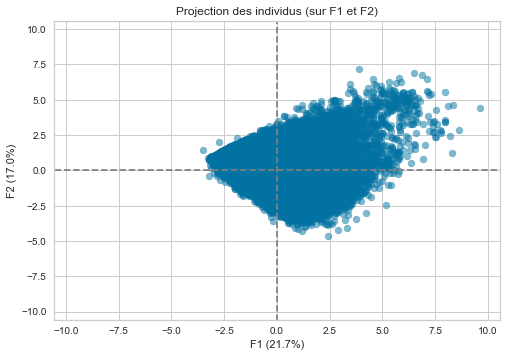

In [35]:
# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)
display_factorial_planes(X_projected,
                         n_comp,
                         pca.named_steps['pca'],
                         [(0, 1)],
                         alpha=0.5)
plt.show()

# Clustering hierarchique

In [36]:
# sous-échantillonnage pour faciliter le clustering hierarchique
data_sample = data.sample(frac=0.4)
data_sample.shape

(32111, 9)

## features categ+quanti

In [37]:
# avec une donnée catégorielle
X = data_sample.drop(['customer_unique_id', 'encombrement_dm3'], axis=1)

# listes de variables quantitatives vs qualitatives
X_quanti = list(X.select_dtypes(['float64', 'int64']).columns)
X_categ = list(X.select_dtypes(['object']).columns)

preprocessor_quanti_categ = make_column_transformer((quanti_pipeline, X_quanti),
                                                    (categ_pipeline, X_categ))

8:80: E501 line too long (80 > 79 characters)


### Test methode linkage

#### calcul global

In [38]:
# linkage = simple
start = timeit.default_timer()

linkage = 'single'

# clustering hierarchique
model_simple = make_pipeline(preprocessor_quanti_categ,
                             AgglomerativeClustering(n_clusters=3,
                                                     linkage=linkage))
model_simple.fit(X)

duree = Affichage_duree(start)

Temps d'exécution : 7.27s


In [39]:
X_scaled = pd.DataFrame(model_simple['columntransformer'].fit_transform(X),
                        columns=model_simple['columntransformer'].get_feature_names_out())

2:80: E501 line too long (90 > 79 characters)


In [40]:
X_cluster = model_simple.fit_predict(X)

In [41]:
DB_score = davies_bouldin_score(X_scaled, X_cluster)
S_score = silhouette_score(X_scaled, X_cluster)
print(DB_score, S_score)

0.410166703261698 0.8057774703641614


In [42]:
# linkage = simple
start = timeit.default_timer()

linkage = 'single'

# clustering hierarchique
model_simple = make_pipeline(preprocessor_quanti_categ,
                             AgglomerativeClustering(n_clusters=None,
                                                     distance_threshold=0.5,
                                                     linkage=linkage))
model_simple.fit(X)

duree = Affichage_duree(start)

Temps d'exécution : 7.23s


In [43]:
# linkage = complet
start = timeit.default_timer()

linkage = 'complete'
# clustering hierarchique
model_complet = make_pipeline(preprocessor_quanti_categ,
                              AgglomerativeClustering(n_clusters=None,
                                                      distance_threshold=0.5,
                                                      linkage=linkage))
model_complet.fit(X)

duree = Affichage_duree(start)

Temps d'exécution : 38.67s


In [44]:
# linkage = average
start = timeit.default_timer()

linkage = 'average'
# clustering hierarchique
model_average = make_pipeline(preprocessor_quanti_categ,
                              AgglomerativeClustering(n_clusters=None,
                                                      distance_threshold=0.5,
                                                      linkage=linkage))
model_average.fit(X)

duree = Affichage_duree(start)

Temps d'exécution : 39.01s


In [45]:
# linkage = ward
start = timeit.default_timer()

linkage = 'ward'
# clustering hierarchique
model_ward = make_pipeline(preprocessor_quanti_categ,
                           AgglomerativeClustering(n_clusters=None,
                                                   distance_threshold=0.5,
                                                   linkage=linkage))
model_ward.fit(X)

duree = Affichage_duree(start)

Temps d'exécution : 34.97s


#### Visu dendrogrammes

3.9956379301280682
20.98501838714486
12.782844402142917
168.7911617873284


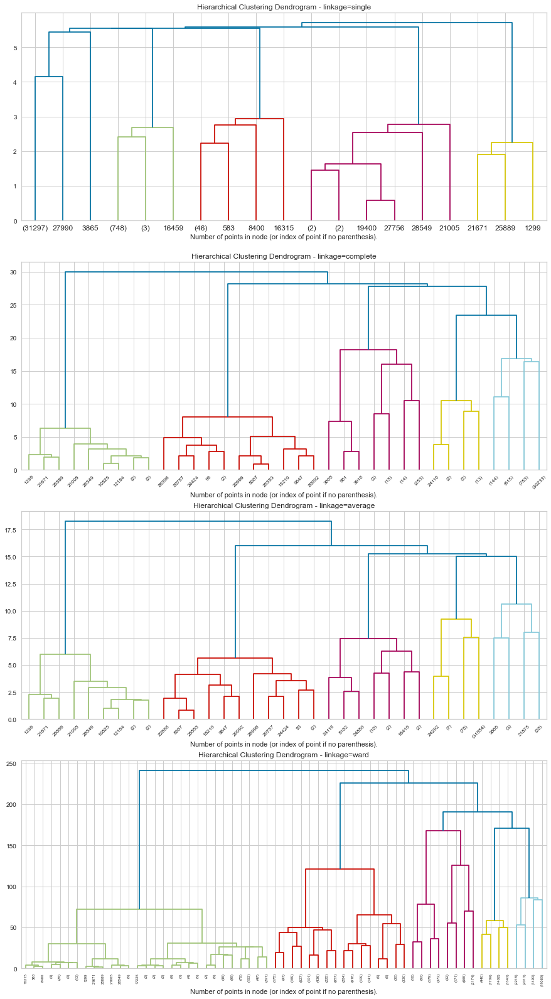

6:80: E501 line too long (82 > 79 characters)
12:80: E501 line too long (81 > 79 characters)


In [46]:
liste_modeles = [model_simple, model_complet, model_average, model_ward]
compteur = 1

plt.figure(figsize=(15, 28))
for model in liste_modeles:
    linkage = model.named_steps['agglomerativeclustering'].get_params()['linkage']
    plt.subplot(4, 1, compteur)
    plt.title("Hierarchical Clustering Dendrogram - linkage="+linkage)
    plot_dendrogram_sklearn(model.named_steps['agglomerativeclustering'],
                            truncate_mode="level",
                            p=5)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    compteur += 1

plt.show()

#### Choix nb clusters
visu possible uniquement via t-sne

In [47]:
start = timeit.default_timer()

tsne = make_pipeline(preprocessor_quanti_categ,
                     manifold.TSNE(n_components=2,
                                   init='pca'))
X_trans = tsne.fit_transform(X)

duree = Affichage_duree(start)

C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


Temps d'exécution : 2.63min


In [48]:
# pour l'affichage
df_subset = X.copy()

df_subset['tsne-2d-one'] = X_trans[:, 0]
df_subset['tsne-2d-two'] = X_trans[:, 1]

Temps d'exécution : 13.88min


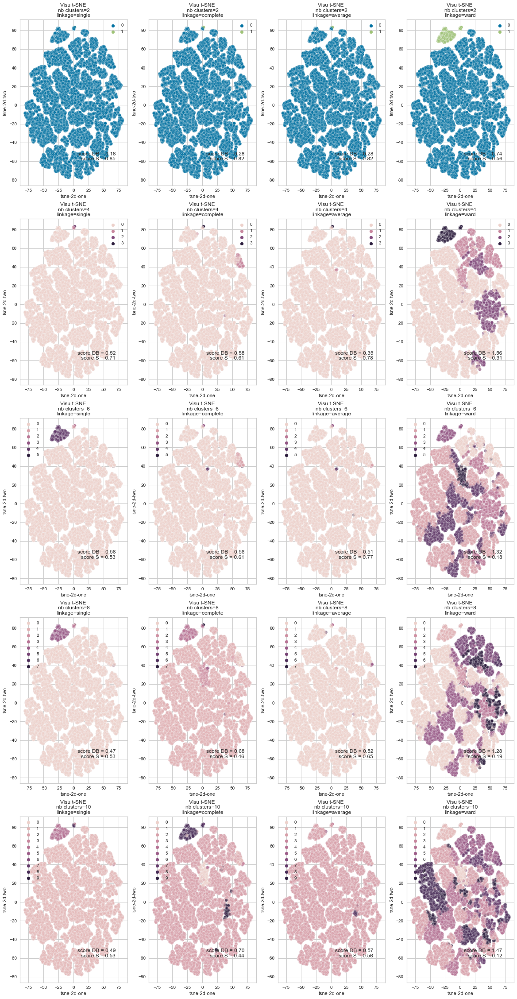

8:80: E501 line too long (86 > 79 characters)
11:80: E501 line too long (80 > 79 characters)
13:80: E501 line too long (80 > 79 characters)
14:80: E501 line too long (95 > 79 characters)
22:80: E501 line too long (88 > 79 characters)
29:80: E501 line too long (90 > 79 characters)


In [49]:
start = timeit.default_timer()
compteur = 1

plt.figure(figsize=(20, 40))

for nb_cluster in range(2, 11, 2):
    for model in liste_modeles:
        linkage = model.named_steps['agglomerativeclustering'].get_params()['linkage']
        # calcul model avec nb_cluster et linkage
        model_new = make_pipeline(preprocessor_quanti_categ,
                                  AgglomerativeClustering(n_clusters=nb_cluster,
                                                          linkage=linkage))
        X_scaled = pd.DataFrame(model_new['columntransformer'].fit_transform(X),
                                columns=model_new['columntransformer'].get_feature_names_out())
        X_cluster = model_new.fit_predict(X)

        DB_score = davies_bouldin_score(X_scaled, X_cluster)
        S_score = silhouette_score(X_scaled, X_cluster)

        # Affichage carte t-SNE
        plt.subplot(5, 4, compteur)
        plt.title("Visu t-SNE \nnb clusters={}\nlinkage={}".format(nb_cluster, linkage))
        sns.scatterplot(x="tsne-2d-one",
                        y="tsne-2d-two",
                        hue=X_cluster,
                        data=df_subset,
                        legend="full",
                        alpha=0.3)
        plt.text(70, -60, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
                 horizontalalignment='right', verticalalignment='bottom')
        compteur += 1

duree = Affichage_duree(start)

## Features uniquement quanti

In [50]:
X = data_sample.drop(['customer_unique_id', 'product_meta_category'], axis=1)

# listes de variables quantitatives vs qualitatives
X_quanti = list(X.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

### Test méthode linkage

#### Calcul global

In [51]:
# linkage = simple
start = timeit.default_timer()

linkage = 'single'
model_simple = make_pipeline(preprocessor_quanti,
                             AgglomerativeClustering(n_clusters=None,
                                                     distance_threshold=0.5,
                                                     linkage=linkage))
model_simple.fit(X)
print('-'*10)
print('linkage=', linkage)
duree = Affichage_duree(start)

# linkage = complet
start = timeit.default_timer()

linkage = 'complete'
model_complet = make_pipeline(preprocessor_quanti,
                              AgglomerativeClustering(n_clusters=None,
                                                      distance_threshold=0.5,
                                                      linkage=linkage))
model_complet.fit(X)
print('-'*10)
print('linkage=', linkage)
duree = Affichage_duree(start)

# linkage = average
start = timeit.default_timer()

linkage = 'average'
model_average = make_pipeline(preprocessor_quanti,
                              AgglomerativeClustering(n_clusters=None,
                                                      distance_threshold=0.5,
                                                      linkage=linkage))
model_average.fit(X)
print('-'*10)
print('linkage=', linkage)
duree = Affichage_duree(start)

# linkage = ward
start = timeit.default_timer()

linkage = 'ward'
model_ward = make_pipeline(preprocessor_quanti,
                           AgglomerativeClustering(n_clusters=None,
                                                   distance_threshold=0.5,
                                                   linkage=linkage))
model_ward.fit(X)
print('-'*10)
print('linkage=', linkage)
duree = Affichage_duree(start)

----------
linkage= single
Temps d'exécution : 5.84s
----------
linkage= complete
Temps d'exécution : 38.16s
----------
linkage= average
Temps d'exécution : 36.82s
----------
linkage= ward
Temps d'exécution : 33.52s


#### Visu dendrogrammes

5.124759085687889
20.961690745165033
12.773228261745418
168.77529139687212


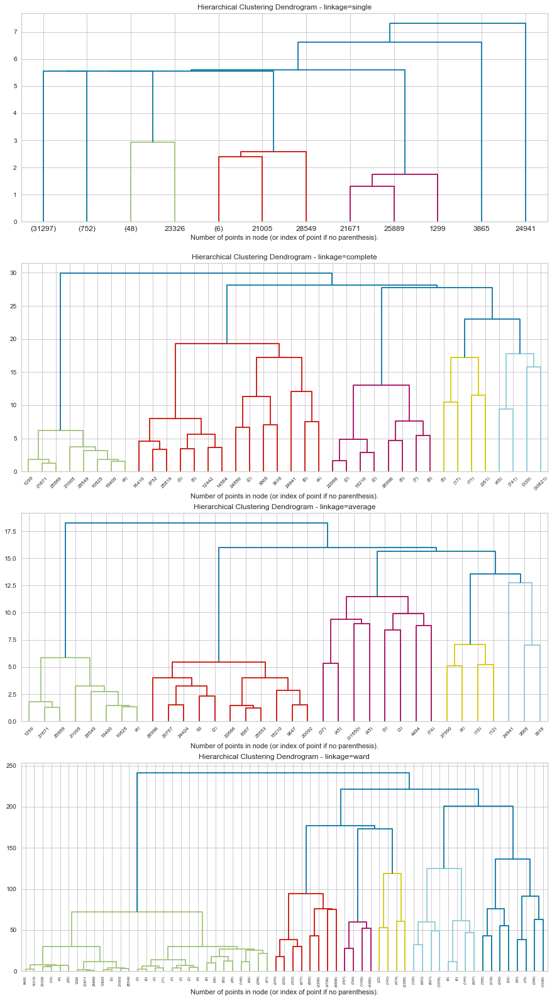

6:80: E501 line too long (82 > 79 characters)
12:80: E501 line too long (81 > 79 characters)


In [52]:
liste_modeles = [model_simple, model_complet, model_average, model_ward]
compteur = 1

plt.figure(figsize=(15, 28))
for model in liste_modeles:
    linkage = model.named_steps['agglomerativeclustering'].get_params()['linkage']
    plt.subplot(4, 1, compteur)
    plt.title("Hierarchical Clustering Dendrogram - linkage="+linkage)
    plot_dendrogram_sklearn(model.named_steps['agglomerativeclustering'],
                            truncate_mode="level",
                            p=5)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    compteur += 1

plt.show()

#### projection sur PCA

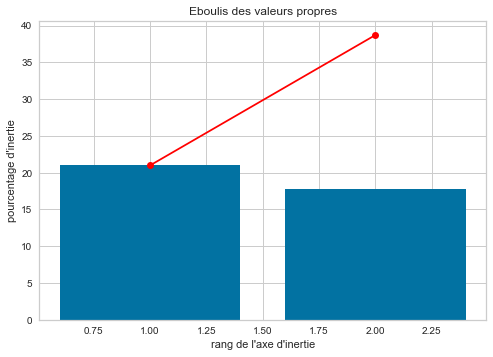

Temps d'exécution : 0.13s


In [53]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
single
nb cluster = 2
Temps d'exécution : 5.83s
----------
complete
nb cluster = 2
Temps d'exécution : 38.06s
----------
average
nb cluster = 2
Temps d'exécution : 36.26s
----------
ward
nb cluster = 2
Temps d'exécution : 33.60s
----------
single
nb cluster = 4
Temps d'exécution : 5.70s
----------
complete
nb cluster = 4
Temps d'exécution : 37.94s
----------
average
nb cluster = 4
Temps d'exécution : 36.92s
----------
ward
nb cluster = 4
Temps d'exécution : 33.39s
----------
single
nb cluster = 6
Temps d'exécution : 5.76s
----------
complete
nb cluster = 6
Temps d'exécution : 37.95s
----------
average
nb cluster = 6
Temps d'exécution : 36.45s
----------
ward
nb cluster = 6
Temps d'exécution : 33.35s
----------
single
nb cluster = 8
Temps d'exécution : 5.71s
----------
complete
nb cluster = 8
Temps d'exécution : 38.14s
----------
average
nb cluster = 8
Temps d'exécution : 36.39s
----------
ward
nb cluster = 8
Temps d'exécution : 33.76s
----------
single
nb cluster = 10
Temps 

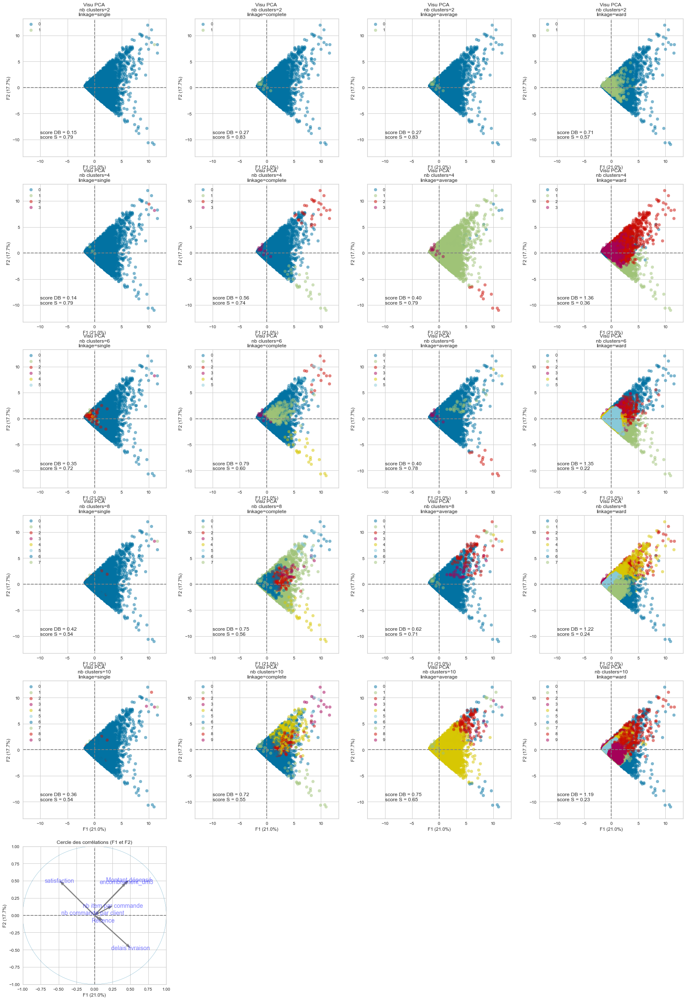

9:80: E501 line too long (86 > 79 characters)
17:80: E501 line too long (80 > 79 characters)
19:80: E501 line too long (80 > 79 characters)
20:80: E501 line too long (95 > 79 characters)
30:80: E501 line too long (86 > 79 characters)
37:80: E501 line too long (91 > 79 characters)


In [54]:
start = timeit.default_timer()
compteur = 1

plt.figure(figsize=(28, 42))

for nb_cluster in range(2, 11, 2):
    for model in liste_modeles:
        start = timeit.default_timer()
        linkage = model.named_steps['agglomerativeclustering'].get_params()['linkage']

        print('-'*10)
        print(linkage)
        print('nb cluster =', nb_cluster)

        # calcul model avec nb_cluster et linkage
        model_new = make_pipeline(preprocessor_quanti,
                                  AgglomerativeClustering(n_clusters=nb_cluster,
                                                          linkage=linkage))
        X_scaled = pd.DataFrame(model_new['columntransformer'].fit_transform(X),
                                columns=model_new['columntransformer'].get_feature_names_out())
        X_cluster = model_new.fit_predict(X)
        duree = Affichage_duree(start)

        # Calcul des scores de Davies-Bouldin et Silhouette
        DB_score = davies_bouldin_score(X_scaled, X_cluster)
        S_score = silhouette_score(X_scaled, X_cluster)

        # Affichage PCA
        plt.subplot(6, 4, compteur)
        plt.title("Visu PCA \nnb clusters={}\nlinkage={}".format(nb_cluster, linkage))
        display_factorial_planes_visu(X_projected,
                                      n_comp,
                                      pca.named_steps['pca'],
                                      [(0, 1)],
                                      alpha=0.5,
                                      illustrative_var=X_cluster)
        plt.text(-10, -10, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
                 horizontalalignment='left', verticalalignment='bottom')

        compteur += 1

# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(6, 4, compteur)
display_circles_visu(pcs,
                     n_comp,
                     pca.named_steps['pca'],
                     [(0, 1)],
                     labels=np.array(features))

duree = Affichage_duree(start)

A priori c'est la méthode de WARD qui semble la plus pertinente pour regrouper les clusters

----------
nb cluster = 4
Temps d'exécution : 33.68s
score Davies-Bouldin : 1.36
score Silhouette : 0.36
----------
nb cluster = 5
Temps d'exécution : 33.58s
score Davies-Bouldin : 1.52
score Silhouette : 0.21
----------
nb cluster = 6
Temps d'exécution : 33.43s
score Davies-Bouldin : 1.35
score Silhouette : 0.22
----------
nb cluster = 7
Temps d'exécution : 33.38s
score Davies-Bouldin : 1.24
score Silhouette : 0.23
----------
nb cluster = 8
Temps d'exécution : 33.78s
score Davies-Bouldin : 1.22
score Silhouette : 0.24


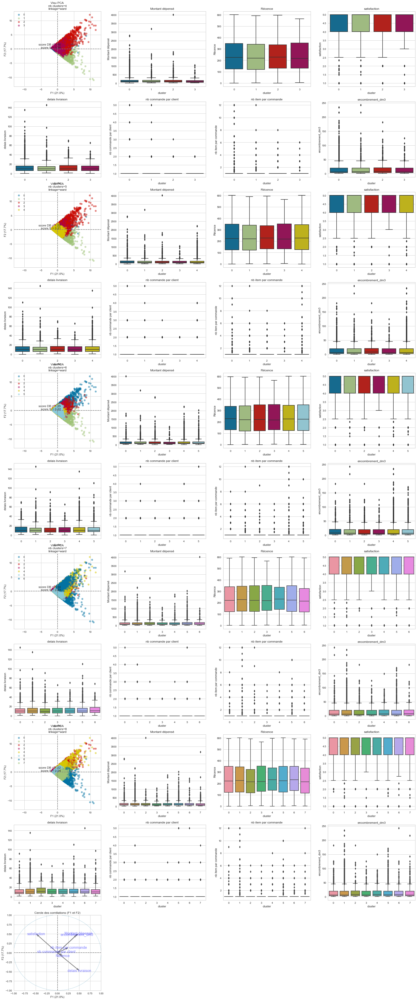

14:80: E501 line too long (91 > 79 characters)
21:80: E501 line too long (95 > 79 characters)
25:80: E501 line too long (82 > 79 characters)
32:80: E501 line too long (83 > 79 characters)


In [55]:
compteur = 1
plt.figure(figsize=(28, 70))
for nb_cluster in range(4, 9, 1):
    print('-'*10)
    print('nb cluster =', nb_cluster)
    start = timeit.default_timer()

    linkage = 'ward'
    # calcul model avec nb_cluster et linkage
    model_new = make_pipeline(preprocessor_quanti,
                              AgglomerativeClustering(n_clusters=nb_cluster,
                                                      linkage=linkage))
    X_scaled = pd.DataFrame(model_new['columntransformer'].fit_transform(X),
                            columns=model_new['columntransformer'].get_feature_names_out())
    X_cluster = model_new.fit_predict(X)
    duree = Affichage_duree(start)

    # Calcul des scores de Davies-Bouldin et Silhouette
    DB_score = davies_bouldin_score(X_scaled, X_cluster)
    S_score = silhouette_score(X_scaled, X_cluster)
    print('score Davies-Bouldin : {:.2f}\nscore Silhouette : {:.2f}'.format(DB_score, S_score))

    # Affichage PCA
    plt.subplot(11, 4, compteur)
    plt.title("Visu PCA \nnb clusters={}\nlinkage={}".format(nb_cluster, linkage))
    display_factorial_planes_visu(X_projected,
                                  n_comp,
                                  pca.named_steps['pca'],
                                  [(0, 1)],
                                  alpha=0.5,
                                  illustrative_var=X_cluster)
    plt.text(1, 0, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
             horizontalalignment='right', verticalalignment='bottom')
    compteur += 1

    # pour affichage des boxplot
    resultat = X.copy()
    X_cluster = pd.DataFrame(X_cluster, columns=['cluster'])
    resultat = resultat.merge(X_cluster, left_index=True, right_index=True)

    # # Affichage boxplot
    for feature in X.columns:
        plt.subplot(11, 4, compteur)
        plt.title(feature)
        sns.boxplot(data=resultat,
                    y=feature,
                    x='cluster')
        compteur += 1

    # Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(11, 4, compteur)
display_circles_visu(pcs,
                     n_comp,
                     pca.named_steps['pca'],
                     [(0, 1)],
                     labels=np.array(features))

#### Analyse des clusters

score Davies-Bouldin : 1.36
score Silhouette : 0.36
Temps d'exécution : 44.98s


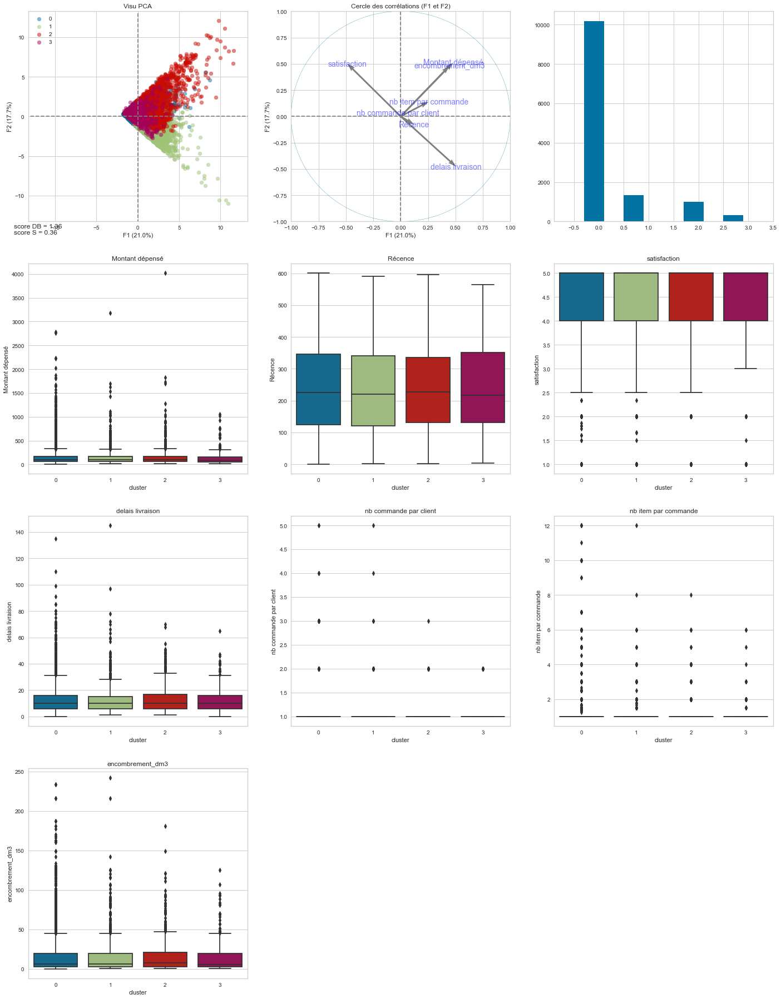

13:80: E501 line too long (81 > 79 characters)
20:80: E501 line too long (91 > 79 characters)
31:80: E501 line too long (83 > 79 characters)
54:23: E703 statement ends with a semicolon


In [56]:
start = timeit.default_timer()

plt.figure(figsize=(24, 32))
compteur = 1

linkage = 'ward'
# calcul model avec nb_cluster et linkage
cha = make_pipeline(preprocessor_quanti,
                    AgglomerativeClustering(n_clusters=4,
                                            linkage=linkage))
X_cluster = cha.fit_predict(X)
X_scaled = pd.DataFrame(cha['columntransformer'].fit_transform(X),
                        columns=cha['columntransformer'].get_feature_names_out())
DB_score = davies_bouldin_score(X_scaled, X_cluster)
S_score = silhouette_score(X_scaled, X_cluster)

labels = cha.named_steps['agglomerativeclustering'].labels_


print('score Davies-Bouldin : {:.2f}\nscore Silhouette : {:.2f}'.format(DB_score, S_score))

# Affichage PCA
plt.subplot(4, 3, compteur)
plt.title("Visu PCA")
display_factorial_planes_visu(X_projected,
                              n_comp,
                              pca.named_steps['pca'],
                              [(0, 1)],
                              alpha=0.5,
                              illustrative_var=X_cluster)
plt.text(-15, -15, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
         horizontalalignment='left', verticalalignment='bottom')
compteur += 1

# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(4, 3, compteur)
display_circles_visu(pcs,
                     n_comp,
                     pca.named_steps['pca'],
                     [(0, 1)],
                     labels=np.array(features))
compteur += 1

# pour affichage des boxplot
resultat = X.copy()
X_cluster = pd.DataFrame(X_cluster, columns=['cluster'])
resultat = resultat.merge(X_cluster, left_index=True, right_index=True)

# affichage du nombre d'individu par classe
plt.subplot(4, 3, compteur)
plt.hist(resultat['cluster'],
         range=(-0.5, resultat['cluster'].max()+0.5),
         align='left');

compteur += 1

# # Affichage boxplot
for feature in X.columns:
    plt.subplot(4, 3, compteur)
    plt.title(feature)
    sns.boxplot(data=resultat,
                y=feature,
                x='cluster')
    compteur += 1

stats = resultat.groupby('cluster').agg(['mean', 'median', 'var'])


duree = Affichage_duree(start)

Les clusters sont difficilement interprétables

## Features quanti + log

In [57]:
# données
X = data_sample.drop(['customer_unique_id', 'product_meta_category'], axis=1).dropna(axis=0)
# variables qui seront transformées ou non
X_var_log = ['Montant dépensé',
             'delais livraison',
             'nb commande par client',
             'nb item par commande']
X_var_nolog = list(X.select_dtypes(['float64', 'int64']).drop(X_var_log, axis=1).columns)

preprocessor_log = make_column_transformer((quanti_pipeline, X_var_nolog),
                                           (quanti_log_pipeline, X_var_log))

2:80: E501 line too long (92 > 79 characters)
8:80: E501 line too long (89 > 79 characters)


### Test méthode linkage

#### Calcul global

In [58]:
# linkage = simple
start = timeit.default_timer()

linkage = 'single'
model_simple = make_pipeline(preprocessor_log,
                             AgglomerativeClustering(n_clusters=None,
                                                     distance_threshold=0.5,
                                                     linkage=linkage))
model_simple.fit(X)
print('-'*10)
print('linkage=', linkage)
duree = Affichage_duree(start)

# linkage = complet
start = timeit.default_timer()

linkage = 'complete'
model_complet = make_pipeline(preprocessor_log,
                              AgglomerativeClustering(n_clusters=None,
                                                      distance_threshold=0.5,
                                                      linkage=linkage))
model_complet.fit(X)
print('-'*10)
print('linkage=', linkage)
duree = Affichage_duree(start)

# linkage = average
start = timeit.default_timer()

linkage = 'average'
model_average = make_pipeline(preprocessor_log,
                              AgglomerativeClustering(n_clusters=None,
                                                      distance_threshold=0.5,
                                                      linkage=linkage))
model_average.fit(X)
print('-'*10)
print('linkage=', linkage)
duree = Affichage_duree(start)

# linkage = ward
start = timeit.default_timer()

linkage = 'ward'
model_ward = make_pipeline(preprocessor_log,
                           AgglomerativeClustering(n_clusters=None,
                                                   distance_threshold=0.5,
                                                   linkage=linkage))
model_ward.fit(X)
print('-'*10)
print('linkage=', linkage)
duree = Affichage_duree(start)

----------
linkage= single
Temps d'exécution : 5.72s
----------
linkage= complete
Temps d'exécution : 35.30s
----------
linkage= average
Temps d'exécution : 35.56s
----------
linkage= ward
Temps d'exécution : 33.49s


#### Visu dendrogrammes

4.102370914919655
14.57260973571935
6.300051028397739
173.5361229115908


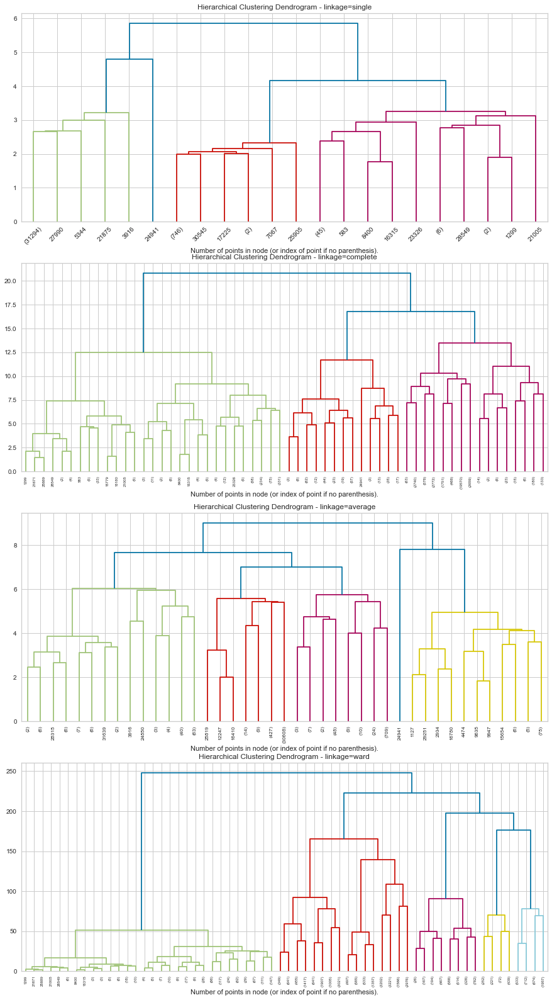

6:80: E501 line too long (82 > 79 characters)
12:80: E501 line too long (81 > 79 characters)


In [59]:
liste_modeles = [model_simple, model_complet, model_average, model_ward]
compteur = 1

plt.figure(figsize=(15, 28))
for model in liste_modeles:
    linkage = model.named_steps['agglomerativeclustering'].get_params()['linkage']
    plt.subplot(4, 1, compteur)
    plt.title("Hierarchical Clustering Dendrogram - linkage="+linkage)
    plot_dendrogram_sklearn(model.named_steps['agglomerativeclustering'],
                            truncate_mode="level",
                            p=5)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    compteur += 1

plt.show()

#### Projection sur PCA

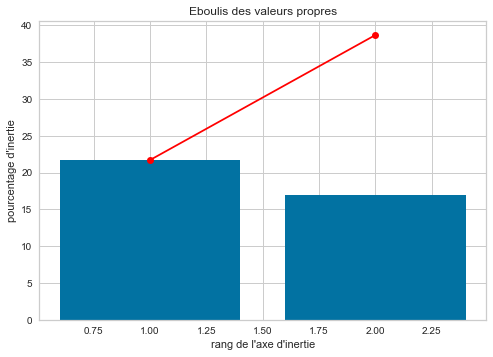

Temps d'exécution : 0.13s


In [60]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_log,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
single
nb cluster = 2
Temps d'exécution : 5.74s
----------
complete
nb cluster = 2
Temps d'exécution : 38.01s
----------
average
nb cluster = 2
Temps d'exécution : 36.28s
----------
ward
nb cluster = 2
Temps d'exécution : 33.41s
----------
single
nb cluster = 4
Temps d'exécution : 5.71s
----------
complete
nb cluster = 4
Temps d'exécution : 37.91s
----------
average
nb cluster = 4
Temps d'exécution : 36.41s
----------
ward
nb cluster = 4
Temps d'exécution : 33.50s
----------
single
nb cluster = 6
Temps d'exécution : 5.60s
----------
complete
nb cluster = 6
Temps d'exécution : 37.73s
----------
average
nb cluster = 6
Temps d'exécution : 36.41s
----------
ward
nb cluster = 6
Temps d'exécution : 33.33s
----------
single
nb cluster = 8
Temps d'exécution : 5.58s
----------
complete
nb cluster = 8
Temps d'exécution : 38.05s
----------
average
nb cluster = 8
Temps d'exécution : 36.59s
----------
ward
nb cluster = 8
Temps d'exécution : 33.37s
----------
single
nb cluster = 10
Temps 

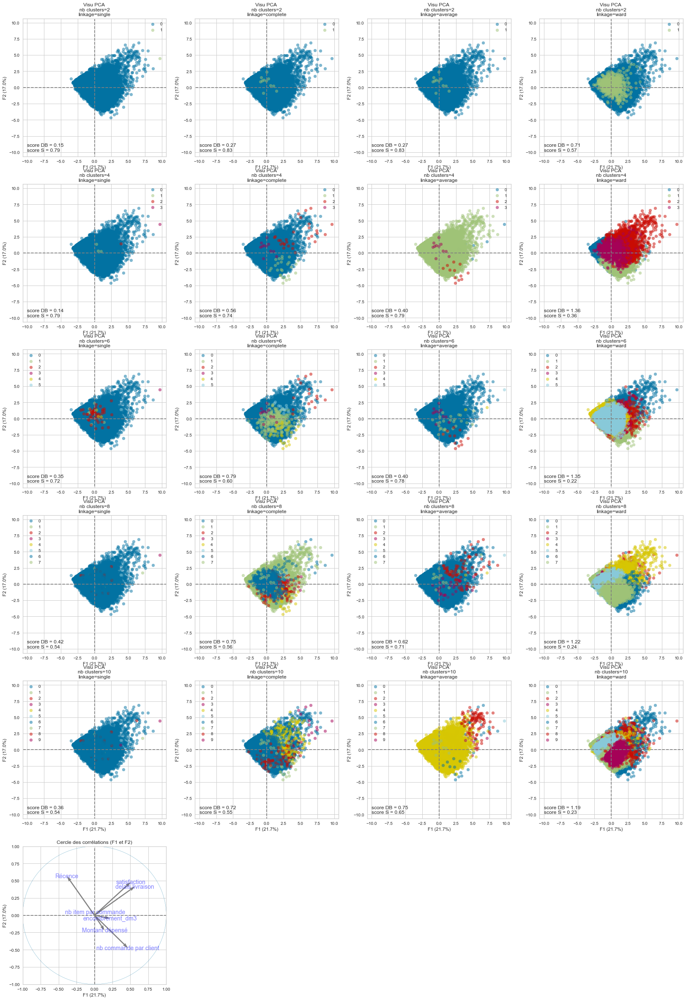

9:80: E501 line too long (86 > 79 characters)
17:80: E501 line too long (80 > 79 characters)
19:80: E501 line too long (80 > 79 characters)
20:80: E501 line too long (95 > 79 characters)
30:80: E501 line too long (86 > 79 characters)
37:80: E501 line too long (91 > 79 characters)


In [61]:
start = timeit.default_timer()
compteur = 1

plt.figure(figsize=(28, 42))

for nb_cluster in range(2, 11, 2):
    for model in liste_modeles:
        start = timeit.default_timer()
        linkage = model.named_steps['agglomerativeclustering'].get_params()['linkage']

        print('-'*10)
        print(linkage)
        print('nb cluster =', nb_cluster)

        # calcul model avec nb_cluster et linkage
        model_new = make_pipeline(preprocessor_quanti,
                                  AgglomerativeClustering(n_clusters=nb_cluster,
                                                          linkage=linkage))
        X_scaled = pd.DataFrame(model_new['columntransformer'].fit_transform(X),
                                columns=model_new['columntransformer'].get_feature_names_out())
        X_cluster = model_new.fit_predict(X)
        duree = Affichage_duree(start)

        # Calcul des scores de Davies-Bouldin et Silhouette
        DB_score = davies_bouldin_score(X_scaled, X_cluster)
        S_score = silhouette_score(X_scaled, X_cluster)

        # Affichage PCA
        plt.subplot(6, 4, compteur)
        plt.title("Visu PCA \nnb clusters={}\nlinkage={}".format(nb_cluster, linkage))
        display_factorial_planes_visu(X_projected,
                                      n_comp,
                                      pca.named_steps['pca'],
                                      [(0, 1)],
                                      alpha=0.5,
                                      illustrative_var=X_cluster)
        plt.text(-10, -10, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
                 horizontalalignment='left', verticalalignment='bottom')

        compteur += 1

# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(6, 4, compteur)
display_circles_visu(pcs,
                     n_comp,
                     pca.named_steps['pca'],
                     [(0, 1)],
                     labels=np.array(features))

duree = Affichage_duree(start)

----------
nb cluster = 4
Temps d'exécution : 33.73s
score Davies-Bouldin : 1.36
score Silhouette : 0.36
----------
nb cluster = 5
Temps d'exécution : 34.19s
score Davies-Bouldin : 1.52
score Silhouette : 0.21
----------
nb cluster = 6
Temps d'exécution : 33.36s
score Davies-Bouldin : 1.35
score Silhouette : 0.22
----------
nb cluster = 7
Temps d'exécution : 33.30s
score Davies-Bouldin : 1.24
score Silhouette : 0.23
----------
nb cluster = 8
Temps d'exécution : 33.59s
score Davies-Bouldin : 1.22
score Silhouette : 0.24


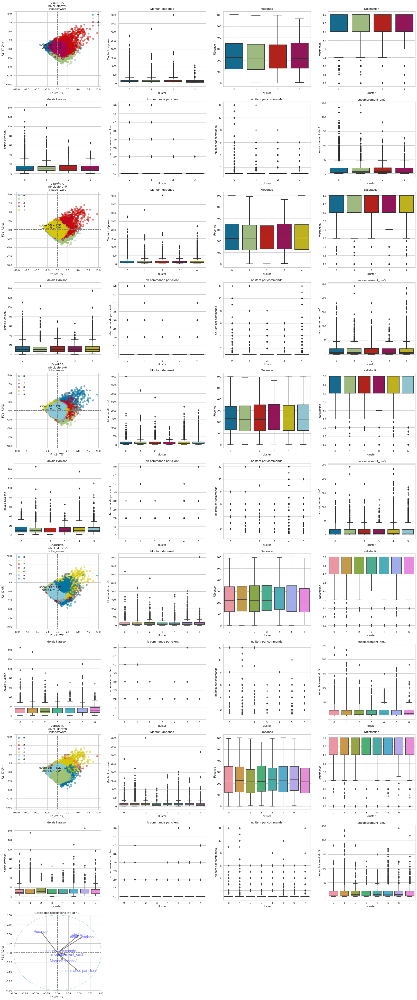

14:80: E501 line too long (91 > 79 characters)
21:80: E501 line too long (95 > 79 characters)
25:80: E501 line too long (82 > 79 characters)
32:80: E501 line too long (83 > 79 characters)


In [62]:
compteur = 1
plt.figure(figsize=(28, 70))
for nb_cluster in range(4, 9, 1):
    print('-'*10)
    print('nb cluster =', nb_cluster)
    start = timeit.default_timer()

    linkage = 'ward'
    # calcul model avec nb_cluster et linkage
    model_new = make_pipeline(preprocessor_quanti,
                              AgglomerativeClustering(n_clusters=nb_cluster,
                                                      linkage=linkage))
    X_scaled = pd.DataFrame(model_new['columntransformer'].fit_transform(X),
                            columns=model_new['columntransformer'].get_feature_names_out())
    X_cluster = model_new.fit_predict(X)
    duree = Affichage_duree(start)

    # Calcul des scores de Davies-Bouldin et Silhouette
    DB_score = davies_bouldin_score(X_scaled, X_cluster)
    S_score = silhouette_score(X_scaled, X_cluster)
    print('score Davies-Bouldin : {:.2f}\nscore Silhouette : {:.2f}'.format(DB_score, S_score))

    # Affichage PCA
    plt.subplot(11, 4, compteur)
    plt.title("Visu PCA \nnb clusters={}\nlinkage={}".format(nb_cluster, linkage))
    display_factorial_planes_visu(X_projected,
                                  n_comp,
                                  pca.named_steps['pca'],
                                  [(0, 1)],
                                  alpha=0.5,
                                  illustrative_var=X_cluster)
    plt.text(1, 0, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
             horizontalalignment='right', verticalalignment='bottom')
    compteur += 1

    # pour affichage des boxplot
    resultat = X.copy()
    X_cluster = pd.DataFrame(X_cluster, columns=['cluster'])
    resultat = resultat.merge(X_cluster,
                              left_index=True,
                              right_index=True)

    # # Affichage boxplot
    for feature in X.columns:
        plt.subplot(11, 4, compteur)
        plt.title(feature)
        sns.boxplot(data=resultat,
                    y=feature,
                    x='cluster')
        compteur += 1

    # Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(11, 4, compteur)
display_circles_visu(pcs,
                     n_comp,
                     pca.named_steps['pca'],
                     [(0, 1)],
                     labels=np.array(features))

# kMeans

In [63]:
X = data.drop(['customer_unique_id', 'product_meta_category'], axis=1)

# listes de variables quantitatives vs qualitatives
X_quanti = list(X.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [64]:
X.describe(include='all')

,Montant dépensé,Récence,satisfaction,delais livraison,nb commande par client,nb item par commande,encombrement_dm3
count,80277.000000,80277.000000,80277.000000,80277.000000,80277.000000,80277.000000,80277.000000
mean,156.543060,238.946224,4.148540,12.050080,1.027144,1.187681,14.978904
std,202.893502,151.131415,1.284323,9.344919,0.178293,0.631553,21.707691
min,3.166667,0.000000,1.000000,0.000000,1.000000,1.000000,0.168000
25%,60.960000,115.000000,4.000000,6.000000,1.000000,1.000000,2.856000
50%,103.790000,222.000000,5.000000,10.000000,1.000000,1.000000,6.720000
75%,175.280000,349.000000,5.000000,15.000000,1.000000,1.000000,18.513000
max,4764.340000,601.000000,5.000000,208.000000,5.000000,15.000000,250.000000


## Uniquement avec features RFM

In [65]:
X_kmeans = X.drop(['satisfaction',
                   'delais livraison',
                   'nb item par commande',
                   'encombrement_dm3'],
                  axis=1)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [66]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_kmeans)

### Choix k : Critère du coude (elbow)

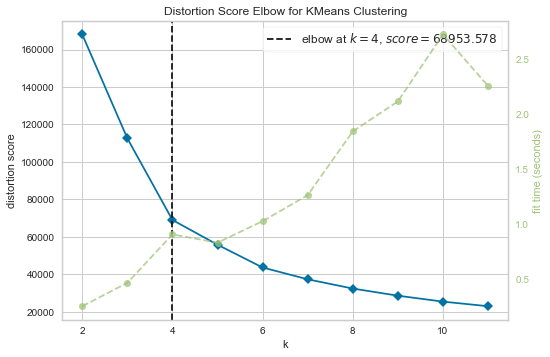

7:18: E703 statement ends with a semicolon


Temps d'exécution : 14.39s


In [67]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 12))

visualizer.fit(X_scale)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

duree = Affichage_duree(start)

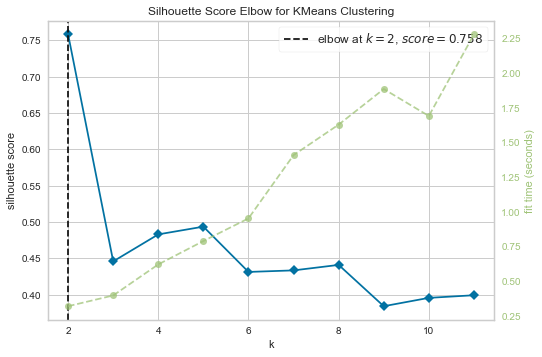

8:18: E703 statement ends with a semicolon


Temps d'exécution : 10.79min


In [68]:
start = timeit.default_timer()

# Instantiate the clustering model and visualizer
model = KMeans(random_state=0)
visualizer = KElbowVisualizer(model, k=(2, 12), metric='silhouette')

visualizer.fit(X_scale)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

duree = Affichage_duree(start)

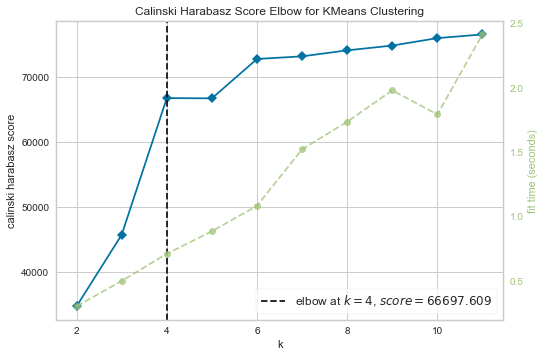

8:18: E703 statement ends with a semicolon


Temps d'exécution : 13.25s


In [69]:
start = timeit.default_timer()

# Instantiate the clustering model and visualizer
model = KMeans(random_state=0)
visualizer = KElbowVisualizer(model, k=(2, 12), metric='calinski_harabasz')

visualizer.fit(X_scale)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

duree = Affichage_duree(start)

### Visu silhouette

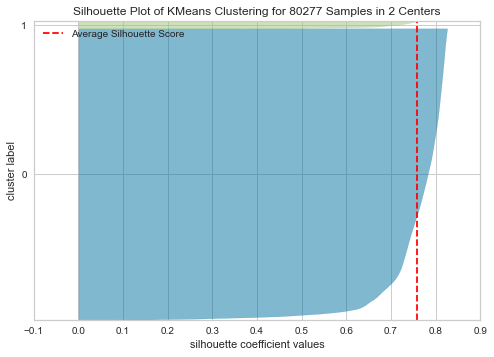

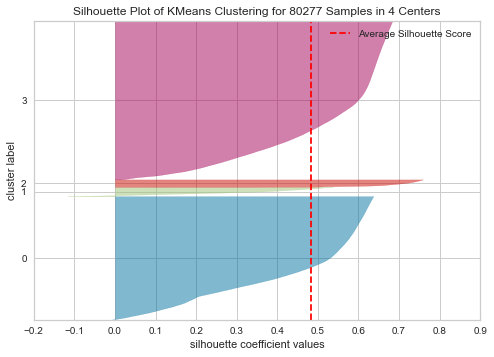

Temps d'exécution : 4.53min


In [70]:
liste_k = [2, 4]
start = timeit.default_timer()
for k in liste_k:
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()
duree = Affichage_duree(start)

### Intercluster distance map

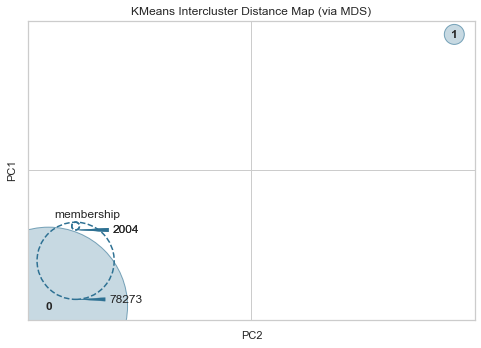

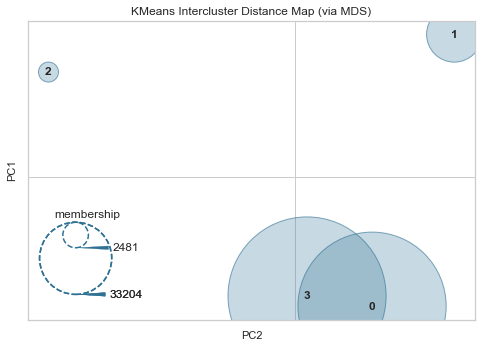

Temps d'exécution : 1.33s


In [71]:
liste_k = [2, 4]
start = timeit.default_timer()
for k in liste_k:
    # Instantiate the clustering model and visualizer
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = InterclusterDistance(model)

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure
duree = Affichage_duree(start)

### Projection sur PCA

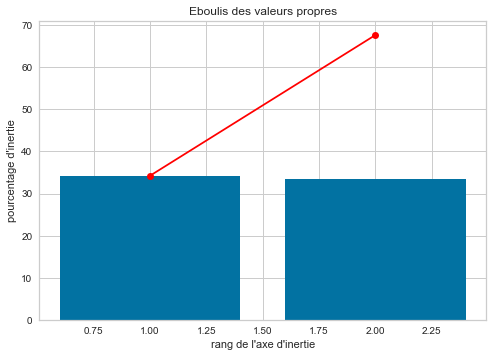

Temps d'exécution : 0.14s


In [72]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X_kmeans.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X_kmeans)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X_kmeans)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
nb cluster = 2
Temps d'exécution : 0.29s
----------
nb cluster = 4
Temps d'exécution : 0.61s
Temps d'exécution : 1.09min


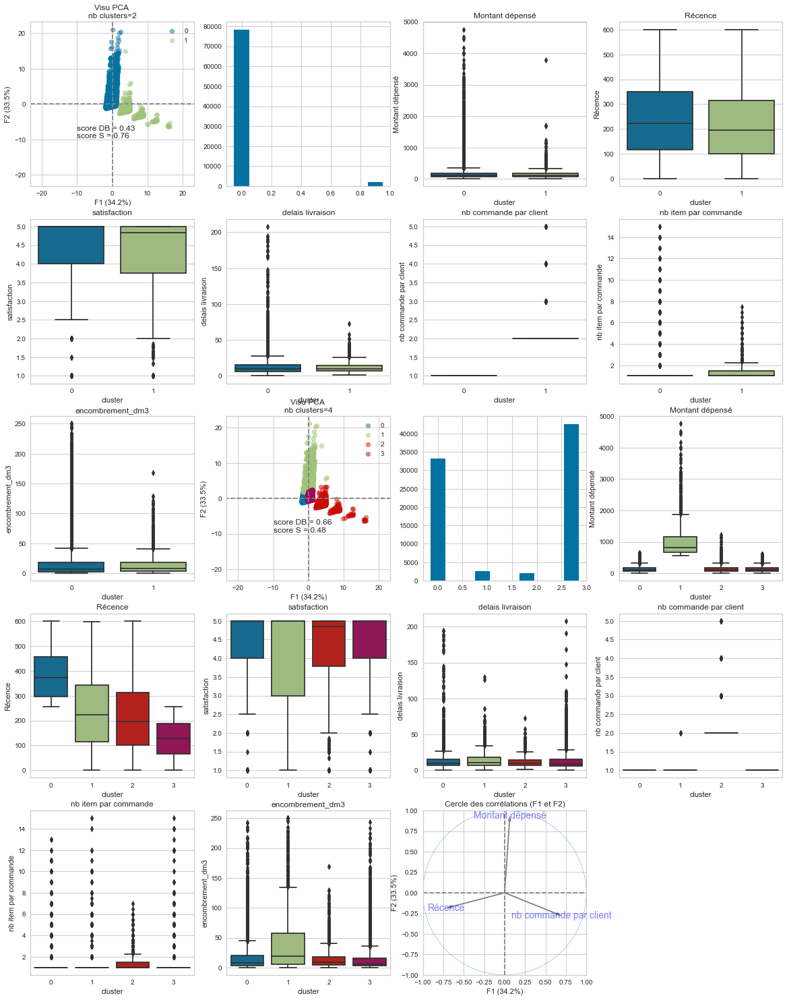

In [73]:
liste_k = [2, 4]
affichage_clustering_liste(X, X_kmeans, liste_k)

### CHOIX CLUSTER

Montant dépensé                             Récence         \
                   mean   median            var        mean median   
cluster                                                              
0            116.098253    97.34    5670.133694  127.051533  127.0   
1            117.821455    96.02    6410.537447  385.613163  374.0   
2           1716.315037  1514.78  326973.224629  240.001597  224.5   
3            144.381436   111.15   15681.029090  214.711144  195.0   
4            578.421215   527.40   37166.403841  222.187039  211.0   

                      nb commande par client                   
                  var                   mean median       var  
cluster                                                        
0         5222.827014               1.000000    1.0  0.000000  
1         8665.365964               1.000000    1.0  0.000000  
2        25221.259197               1.004792    1.0  0.004777  
3        20006.059521               2.087456    2.0  0.120848  
4        17436.323777               1.000000    1.0  0.000000

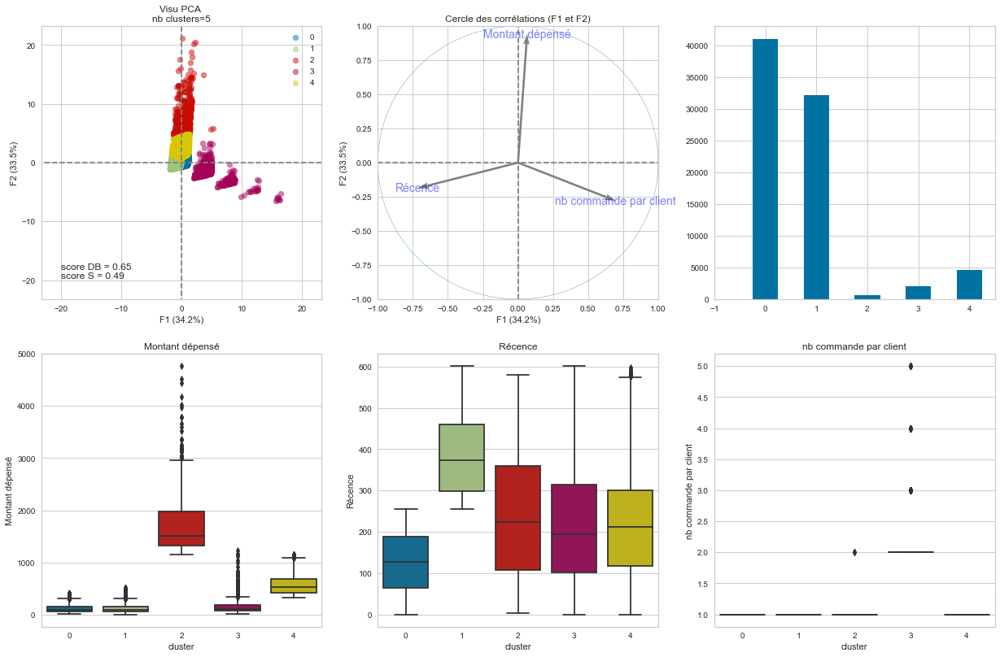

In [74]:
resultat, stats = visualisation_clustering_definitif(X, X_kmeans, k=5)
stats

Le meilleur choix avec ces features semble être k=4 :
- cluster 0 = clients n'ayant commandé qu'une fois, clients ayant commandé il y a longtemps + ayant dépensé le moins
- cluster 1 = clients qui dépensent plus d'argent que les autres
- cluster 2 = client qui commandent plus d'une fois
- cluster 3 = clients ayant commandés récemment, mais qu'une fois

## Avec features RFM + satisfaction

In [75]:
X_kmeans = X.drop(['delais livraison',
                   'nb item par commande',
                   'encombrement_dm3'],
                  axis=1)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [76]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_kmeans)

### Choix k : critère du coude

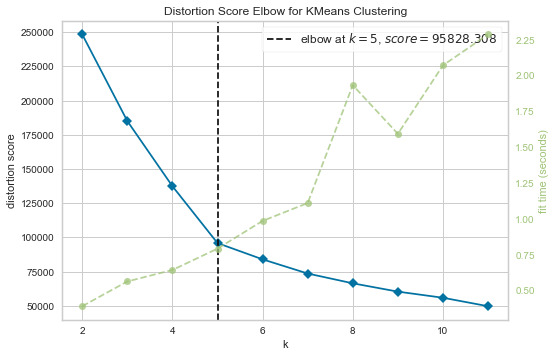

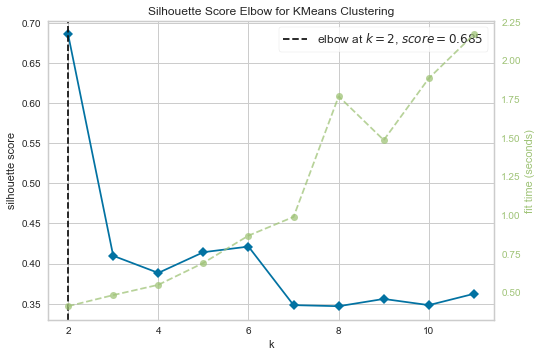

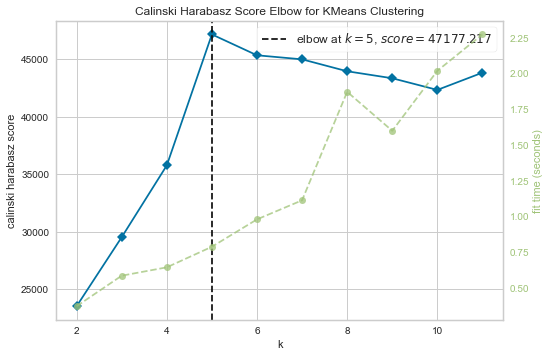

7:19: E703 statement ends with a semicolon
14:19: E703 statement ends with a semicolon
20:19: E703 statement ends with a semicolon


Temps d'exécution : 11.18min


In [77]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMeans(random_state=0)
visualizer1 = KElbowVisualizer(model, k=(2, 12))

visualizer1.fit(X_scale)        # Fit the data to the visualizer
visualizer1.show();        # Finalize and render the figure


# Instantiate the clustering model and visualizer
visualizer2 = KElbowVisualizer(model, k=(2, 12), metric='silhouette')

visualizer2.fit(X_scale)        # Fit the data to the visualizer
visualizer2.show();        # Finalize and render the figure

# Instantiate the clustering model and visualizer
visualizer3 = KElbowVisualizer(model, k=(2, 12), metric='calinski_harabasz')

visualizer3.fit(X_scale)        # Fit the data to the visualizer
visualizer3.show();        # Finalize and render the figure
duree = Affichage_duree(start)

### Visu silhouettes

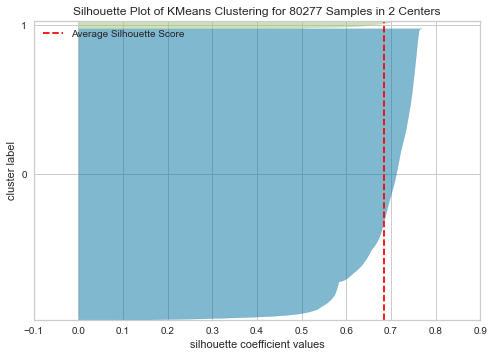

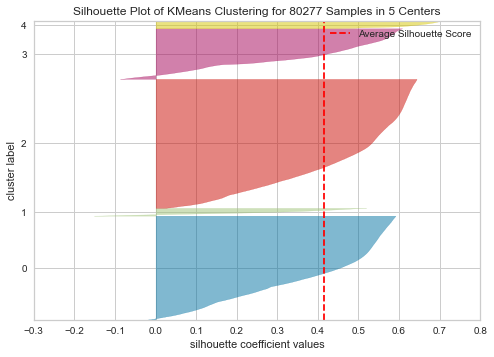

Temps d'exécution : 4.44min


In [78]:
liste_k = [2, 5]
start = timeit.default_timer()
for k in liste_k:
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()
duree = Affichage_duree(start)

### Intercluster distance map

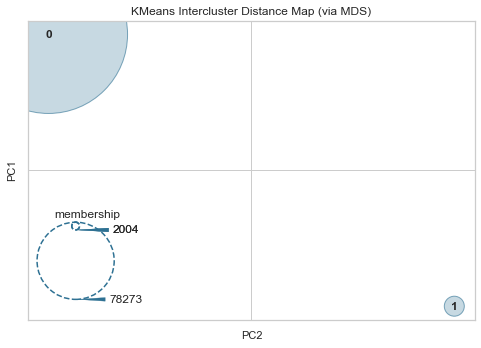

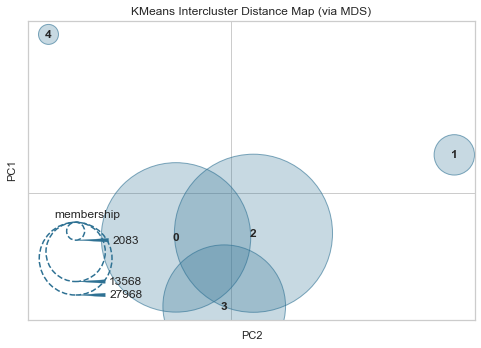

Temps d'exécution : 1.47s


In [79]:
liste_k = [2, 5]
start = timeit.default_timer()
for k in liste_k:
    # Instantiate the clustering model and visualizer
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = InterclusterDistance(model)

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure
duree = Affichage_duree(start)

### Projection sur PCA

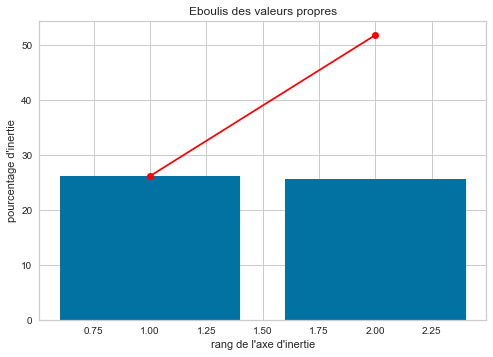

Temps d'exécution : 0.14s


In [80]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X_kmeans.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X_kmeans)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X_kmeans)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
nb cluster = 2
Temps d'exécution : 0.37s
----------
nb cluster = 5
Temps d'exécution : 0.68s
Temps d'exécution : 1.07min


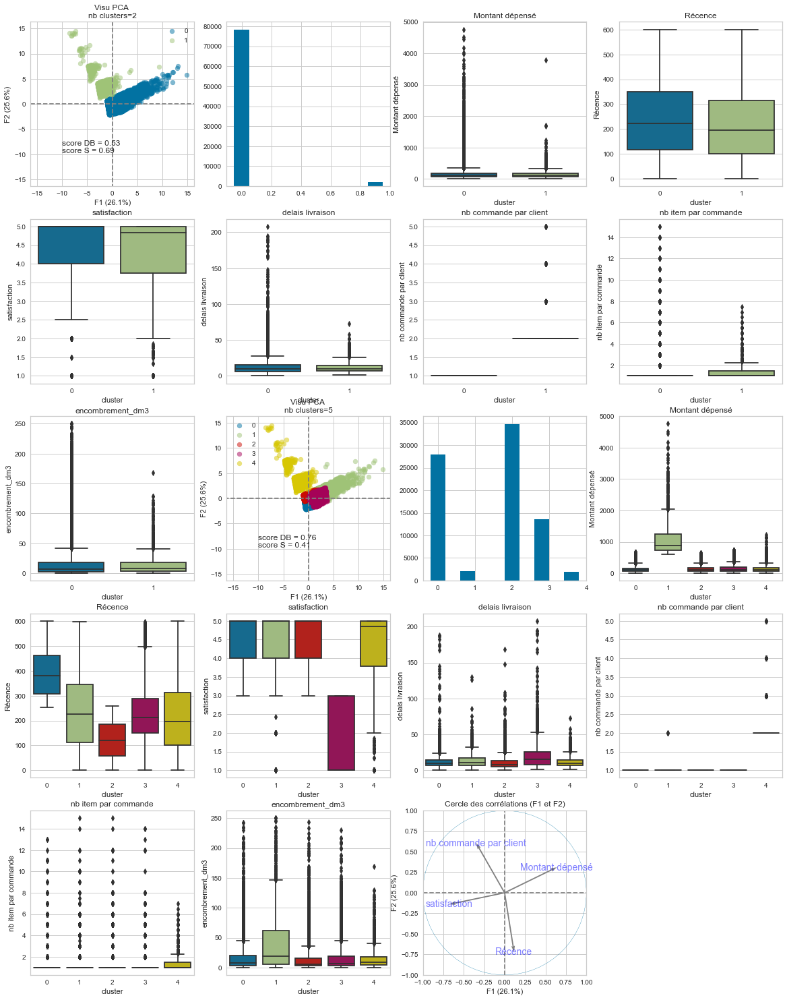

In [81]:
liste_k = [2, 5]
resultats = affichage_clustering_liste(X, X_kmeans, liste_k)

### CHOIX CLUSTER

Montant dépensé                             Récence         \
                   mean   median            var        mean median   
cluster                                                              
0            127.557192   97.515   10139.844314  389.963065  380.0   
1           1084.162870  885.360  284151.459913  237.265482  227.0   
2            128.897096   99.740   10380.803671  121.668379  119.0   
3            146.291458  109.920   14316.718082  231.049307  212.0   
4            144.381436  111.150   15681.029090  214.711144  195.0   

                      satisfaction                     nb commande par client  \
                  var         mean    median       var                   mean   
cluster                                                                         
0         8536.802977     4.640160  5.000000  0.344712               1.000000   
1        21876.044279     4.151910  5.000000  1.708166               1.001440   
2         5311.759282     4.698026  5.000000  0.274626               1.000000   
3        15377.442472     1.718639  1.000000  0.746013               1.000000   
4        20006.059521     4.232851  4.857143  1.114726               2.087456   

                          
        median       var  
cluster                   
0          1.0  0.000000  
1          1.0  0.001439  
2          1.0  0.000000  
3          1.0  0.000000  
4          2.0  0.120848

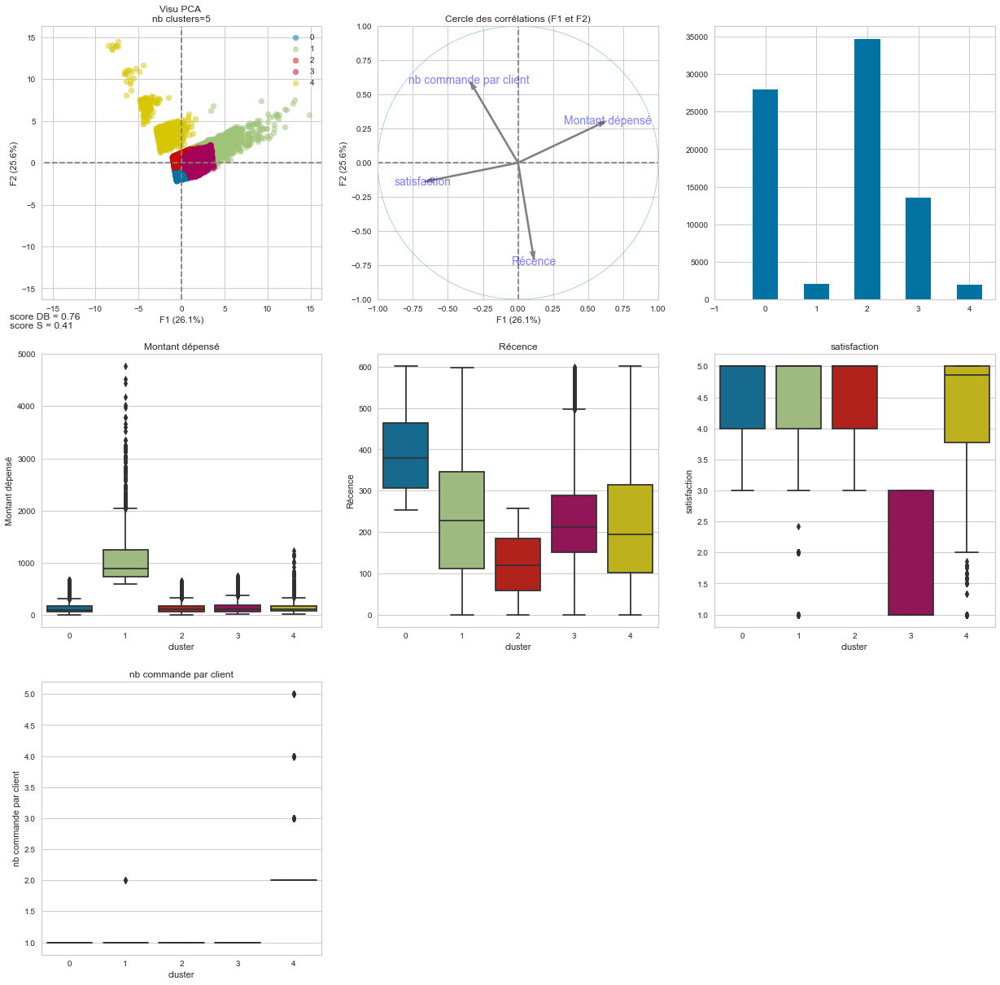

In [82]:
resultat, stats = visualisation_clustering_definitif(X, X_kmeans, k=5)
stats

interprétation :
- cluster 0 = clients n'ayant pas commandé récemment
- cluster 1 = clients ayant dépensé plus d'argent que les autres
- cluster 2 = clients les plus récents
- cluster 3 = clients insatisfaits
- cluster 4 = clients ayant commandé plus d'une fois

## Avec features RFM + satisfaction + délais livraison

In [83]:
X_kmeans = X.drop(['nb item par commande',
                   'encombrement_dm3'],
                  axis=1)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [84]:
X_kmeans.shape

(80277, 5)

In [85]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_kmeans)

### Choix k : critère du coude

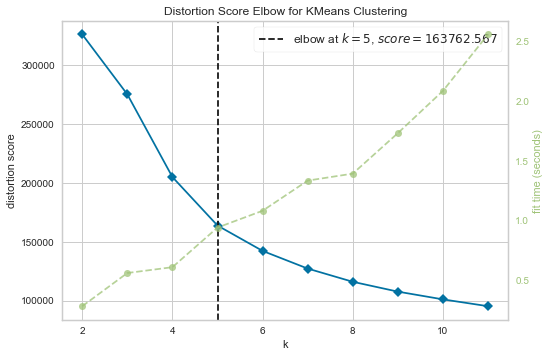

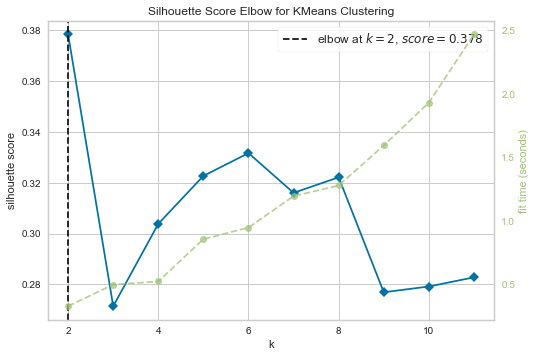

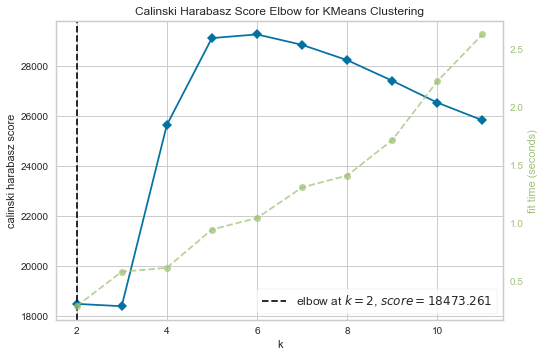

7:19: E703 statement ends with a semicolon
14:19: E703 statement ends with a semicolon
20:19: E703 statement ends with a semicolon


Temps d'exécution : 11.17min


In [86]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMeans(random_state=0)
visualizer1 = KElbowVisualizer(model, k=(2, 12))

visualizer1.fit(X_scale)        # Fit the data to the visualizer
visualizer1.show();        # Finalize and render the figure


# Instantiate the clustering model and visualizer
visualizer2 = KElbowVisualizer(model, k=(2, 12), metric='silhouette')

visualizer2.fit(X_scale)        # Fit the data to the visualizer
visualizer2.show();        # Finalize and render the figure

# Instantiate the clustering model and visualizer
visualizer3 = KElbowVisualizer(model, k=(2, 12), metric='calinski_harabasz')

visualizer3.fit(X_scale)        # Fit the data to the visualizer
visualizer3.show();        # Finalize and render the figure
duree = Affichage_duree(start)

### Visu silhouettes

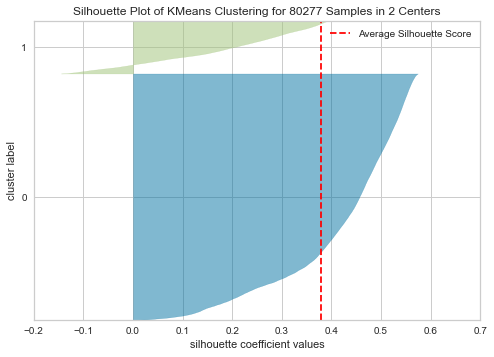

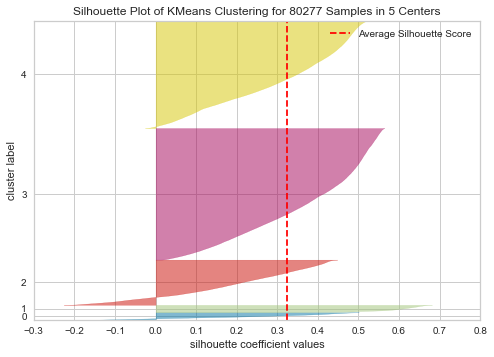

Temps d'exécution : 4.40min


In [87]:
liste_k = [2, 5]
start = timeit.default_timer()
for k in liste_k:
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()
duree = Affichage_duree(start)

### Intercluster distance map

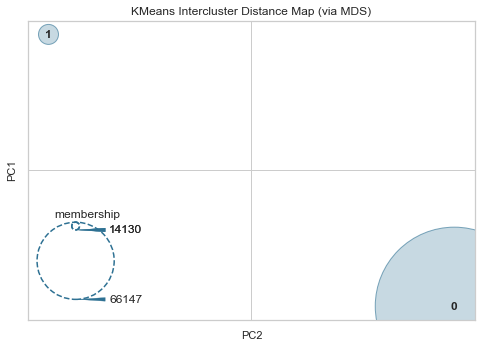

C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_mds.py:517: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


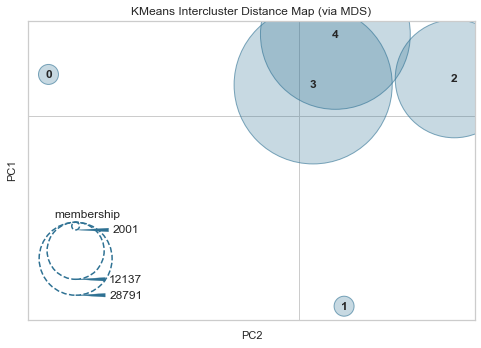

Temps d'exécution : 1.54s


In [88]:
liste_k = [2, 5]
start = timeit.default_timer()
for k in liste_k:
    # Instantiate the clustering model and visualizer
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = InterclusterDistance(model)

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure
duree = Affichage_duree(start)

### Projection sur PCA

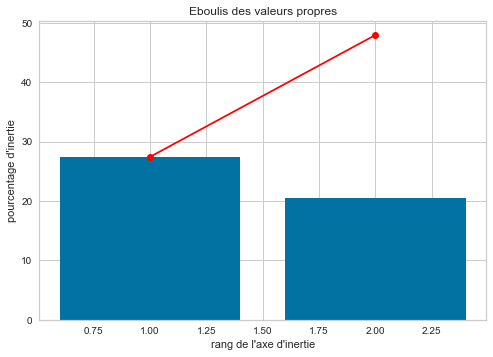

Temps d'exécution : 0.15s


In [89]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X_kmeans.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X_kmeans)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X_kmeans)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
nb cluster = 2
Temps d'exécution : 0.32s
----------
nb cluster = 5
Temps d'exécution : 0.84s
Temps d'exécution : 1.08min


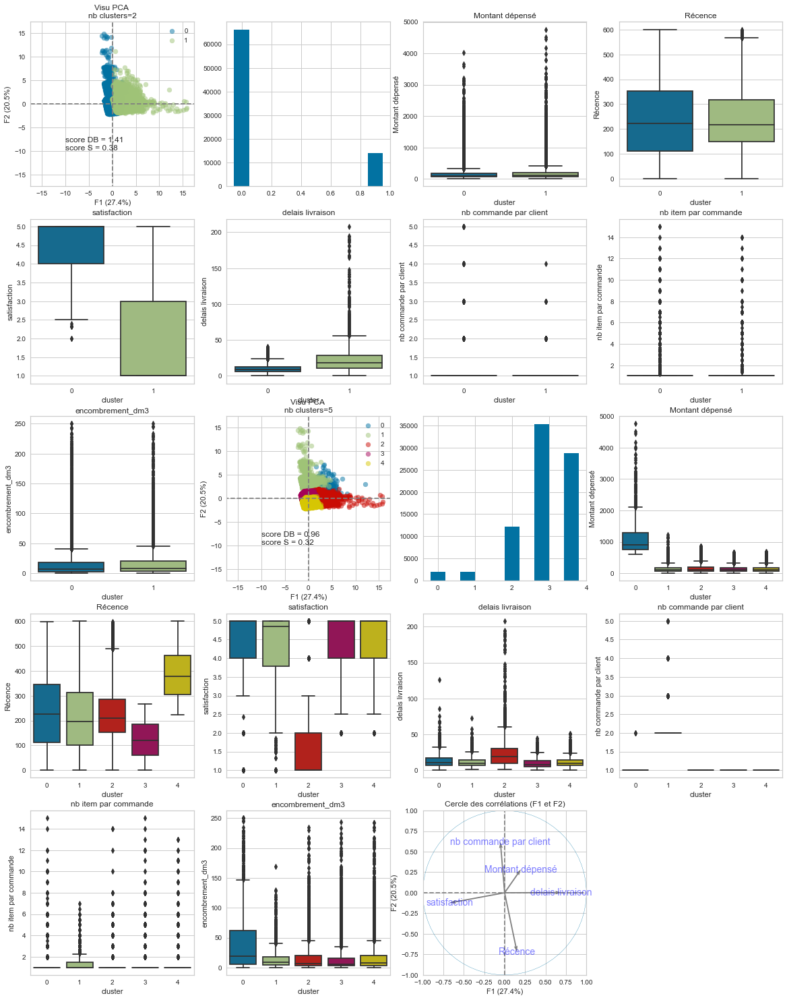

In [90]:
liste_k = [2, 5]
affichage_clustering_liste(X, X_kmeans, liste_k)

### CHOIX CLUSTER

Montant dépensé                            Récence         \
                   mean  median            var        mean median   
cluster                                                             
0           1101.402393  905.85  288072.765324  237.239880  227.0   
1            144.381436  111.15   15681.029090  214.711144  195.0   
2            151.707377  114.57   15329.526290  231.992008  211.0   
3            128.412676   98.73   10570.549629  121.840241  119.0   
4            128.294206   97.80   10403.386323  387.452954  377.0   

                      satisfaction                     delais livraison  \
                  var         mean    median       var             mean   
cluster                                                                   
0        21929.843429     4.155636  5.000000  1.700500        13.233997   
1        20006.059521     4.232851  4.857143  1.114726        11.599231   
2        15984.440691     1.641633  1.000000  0.871254        21.852105   
3         5244.062379     4.640479  5.000000  0.377446         9.508247   
4         8644.347691     4.595030  5.000000  0.426711        10.987670   

                           nb commande par client                   
        median         var                   mean median       var  
cluster                                                             
0         11.0   88.454158               1.001499    1.0  0.001498  
1         10.0   51.648343               2.087456    2.0  0.120848  
2         19.0  248.860212               1.000000    1.0  0.000000  
3          8.0   34.627804               1.000000    1.0  0.000000  
4         10.0   36.671574               1.000000    1.0  0.000000

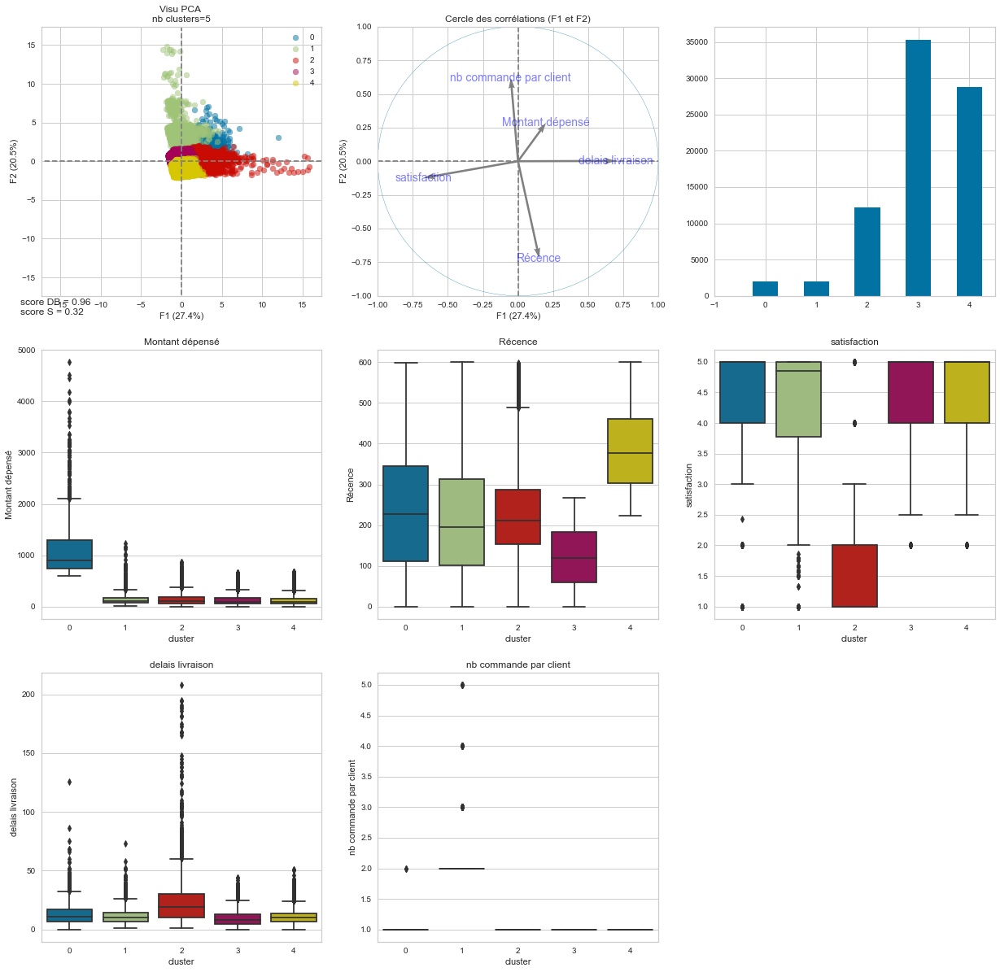

In [91]:
resultat, stats = visualisation_clustering_definitif(X, X_kmeans, k=5)
stats

Interprétation 5 clusters :
- cluster 0 = clients qui dépensent beaucoup
- cluster 1 = clients qui commandent plus d'une fois
- cluster 2 = clients insatisfaits + délais de livraison max
- cluster 3 = clients les plus récents, ayant commandé qu'une seule fois et dont les délais de livraison sont les plus faibles
- cluster 4 = clients n'ayant commandé qu'une fois et n'ayant pas commandé depuis longtemps

## + nb item par commande

In [92]:
X_kmeans = X.drop(['encombrement_dm3'],
                  axis=1)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [93]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_kmeans)

### Choix k : critère du coude

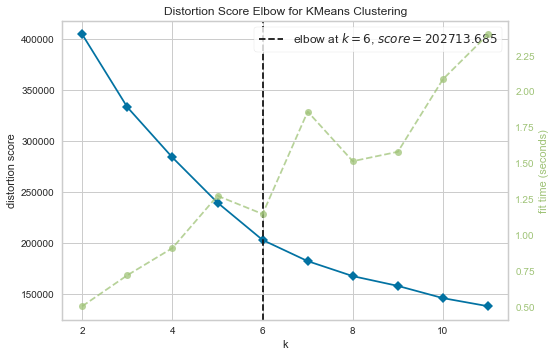

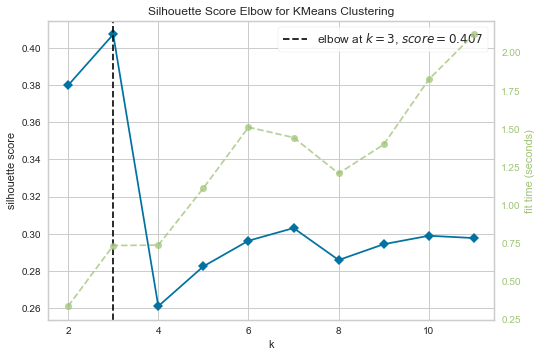

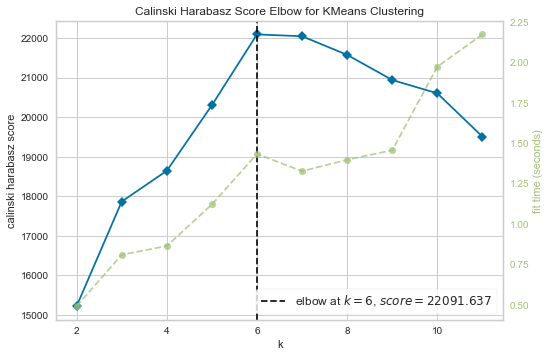

7:19: E703 statement ends with a semicolon
14:19: E703 statement ends with a semicolon
20:19: E703 statement ends with a semicolon


Temps d'exécution : 11.32min


In [94]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer1 = KElbowVisualizer(model, k=(2, 12))

visualizer1.fit(X_scale)        # Fit the data to the visualizer
visualizer1.show();        # Finalize and render the figure


# Instantiate the clustering model and visualizer
visualizer2 = KElbowVisualizer(model, k=(2, 12), metric='silhouette')

visualizer2.fit(X_scale)        # Fit the data to the visualizer
visualizer2.show();        # Finalize and render the figure

# Instantiate the clustering model and visualizer
visualizer3 = KElbowVisualizer(model, k=(2, 12), metric='calinski_harabasz')

visualizer3.fit(X_scale)        # Fit the data to the visualizer
visualizer3.show();        # Finalize and render the figure
duree = Affichage_duree(start)

### Visu silhouettes

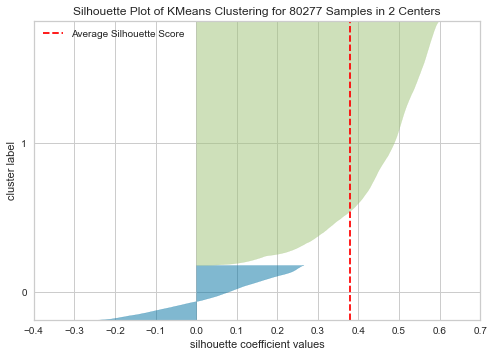

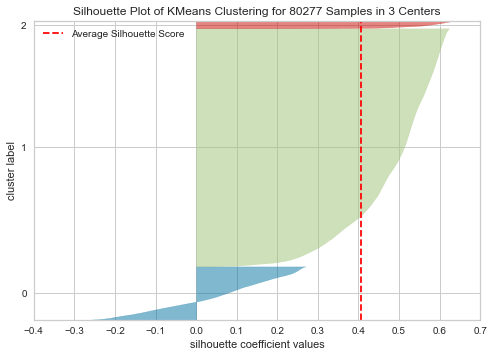

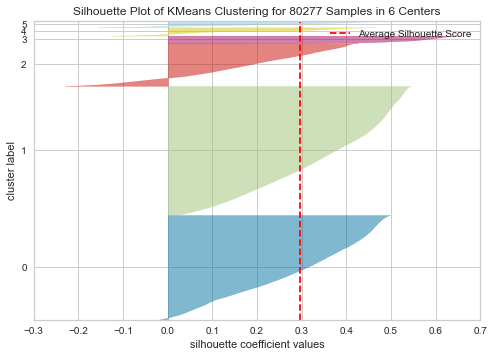

Temps d'exécution : 6.75min


In [95]:
liste_k = [2, 3, 6]
start = timeit.default_timer()
for k in liste_k:
    model = KMeans(n_clusters=k)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()
duree = Affichage_duree(start)

### Intercluster distance Map

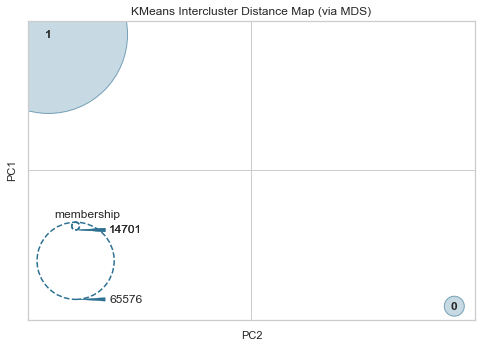

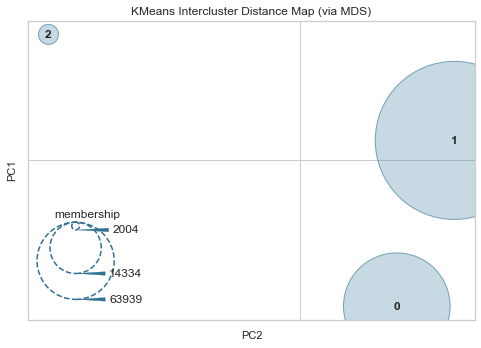

C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_mds.py:517: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


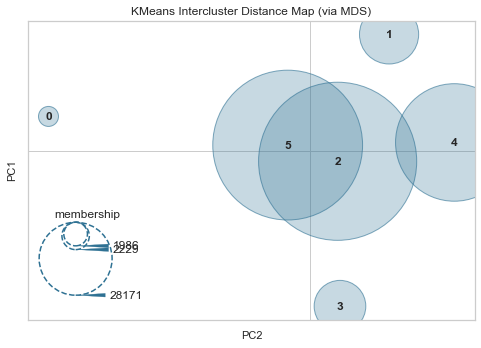

Temps d'exécution : 3.11s


In [96]:
liste_k = [2, 3, 6]
start = timeit.default_timer()
for k in liste_k:
    # Instantiate the clustering model and visualizer
    model = KMeans(n_clusters=k)
    visualizer = InterclusterDistance(model)

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure
duree = Affichage_duree(start)

### Projection sur PCA

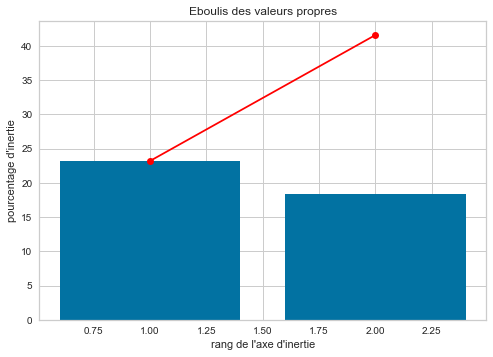

Temps d'exécution : 0.20s


In [97]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X_kmeans.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X_kmeans)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X_kmeans)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
nb cluster = 2
Temps d'exécution : 0.53s
----------
nb cluster = 3
Temps d'exécution : 0.57s
----------
nb cluster = 6
Temps d'exécution : 1.26s
Temps d'exécution : 1.10min


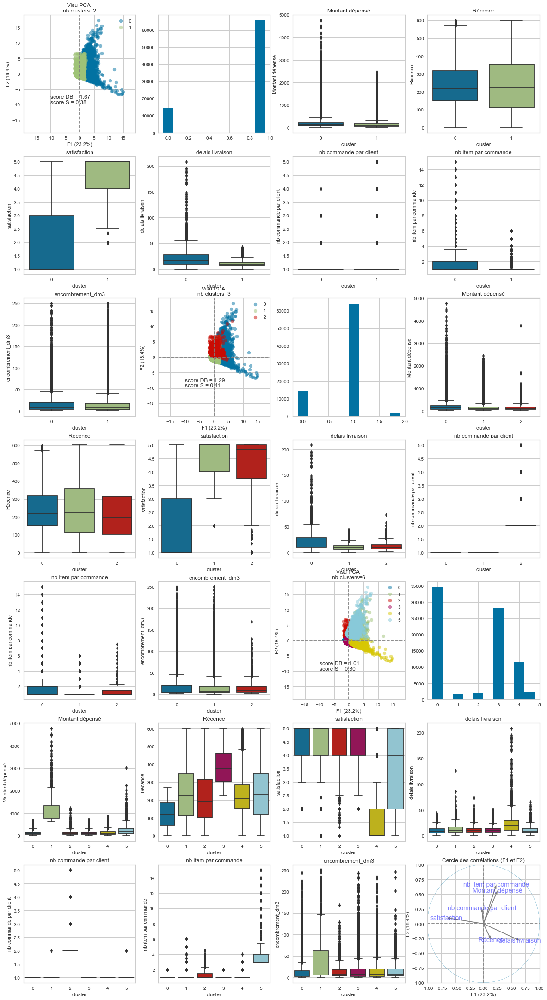

In [98]:
liste_k = [2, 3, 6]
affichage_clustering_liste(X, X_kmeans, liste_k)

### CHOIX CLUSTER

Montant dépensé                              Récence         \
                   mean    median            var        mean median   
cluster                                                               
0            127.636854   98.3400   10579.374119  121.982346  119.0   
1           1146.041872  931.3700  304919.040781  235.528629  224.0   
2            143.334380  111.0000   15348.965212  214.851964  195.0   
3            128.170862   97.2300   10567.446036  387.302444  377.0   
4            147.702994  112.0650   14551.431459  231.951355  210.0   
5            254.305041  187.9325   66598.915860  244.387444  229.5   

                      satisfaction                  delais livraison         \
                  var         mean median       var             mean median   
cluster                                                                       
0         5258.936137     4.640671    5.0  0.379497         9.514914    8.0   
1        22455.000482     4.207304    5.0  1.621624        13.202677   11.0   
2        20032.168502     4.242501    5.0  1.098427        11.608495   10.0   
3         8628.509917     4.594800    5.0  0.428781        11.007992   10.0   
4        15919.166081     1.652884    1.0  0.896006        22.349809   20.0   
5        22799.289928     3.618308    4.0  2.484362        10.945466    9.0   

                    nb commande par client                   \
                var                   mean median       var   
cluster                                                       
0         34.548184               1.000000    1.0  0.000000   
1         90.753482               1.001157    1.0  0.001156   
2         51.923082               2.088117    2.0  0.121703   
3         36.684020               1.000000    1.0  0.000000   
4        253.462455               1.000000    1.0  0.000000   
5         54.915182               1.007175    1.0  0.007127   

        nb item par commande                   
                        mean median       var  
cluster                                        
0                   1.083482    1.0  0.076515  
1                   1.173800    1.0  0.298624  
2                   1.273884    1.0  0.269892  
3                   1.093202    1.0  0.084518  
4                   1.170083    1.0  0.149160  
5                   4.025112    3.0  2.520455

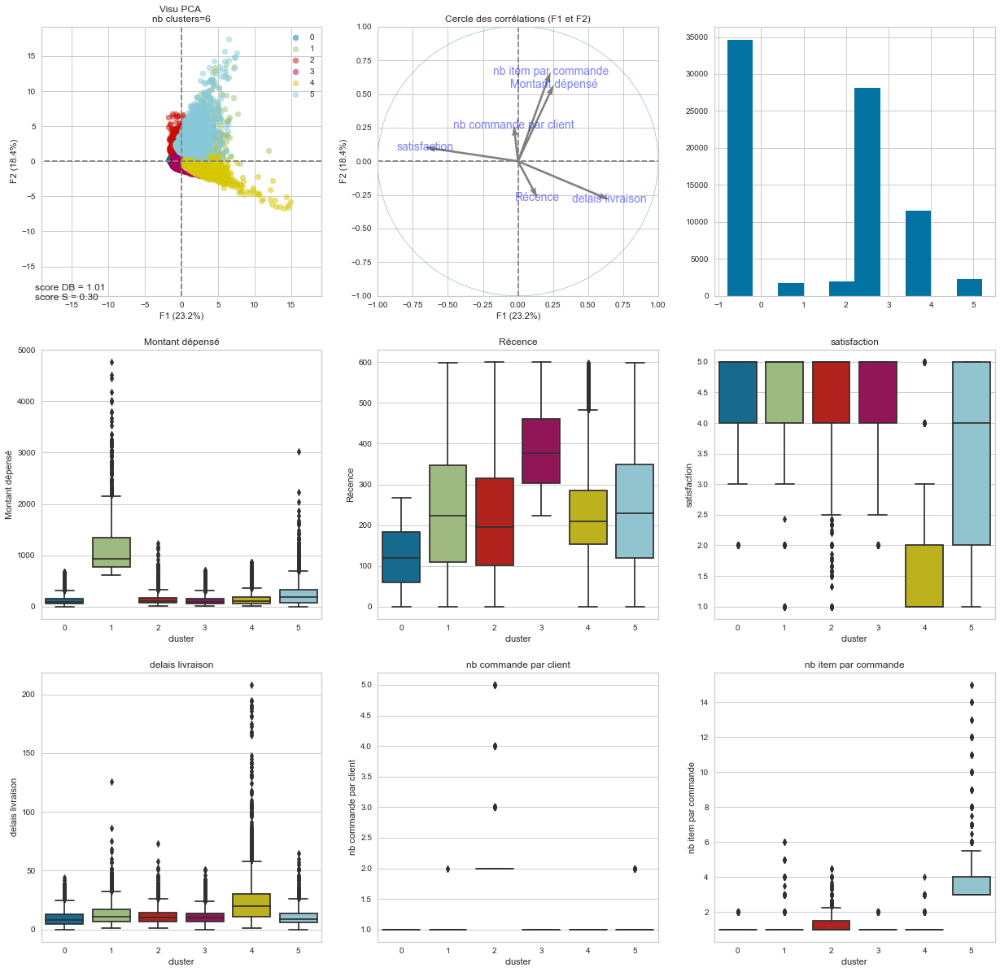

In [99]:
resultat, stats = visualisation_clustering_definitif(X, X_kmeans, k=6)
stats

Interprétation des 6 clusters :
- cluster 0 = clients ayant commandé récemment, une seule commande
- cluster 1 = clients ayant dépensé beaucoup d'argent
- cluster 2 = clients ayant commandé plus de 2 fois
- cluster 3 = clients n'ayant pas commandé depuis longtemps
- cluster 4 = clients insatisfaits + délais de livraison les plus grands
- cluster 5 = clients ayant commandé plus d'un item par commande en moyenne, clients moyennement satisfaits

## + encombrement_dm3

In [100]:
X_kmeans = X.copy()
# listes de variables quantitatives vs qualitatives
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [101]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_kmeans)

### Choix k : critère du coude

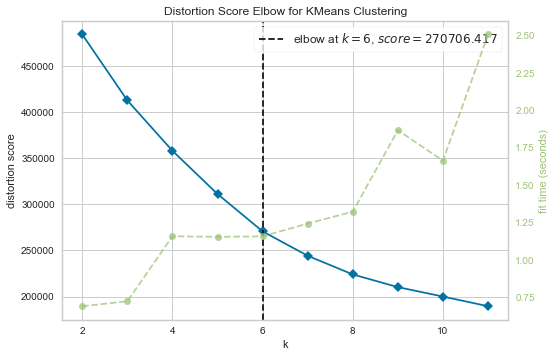

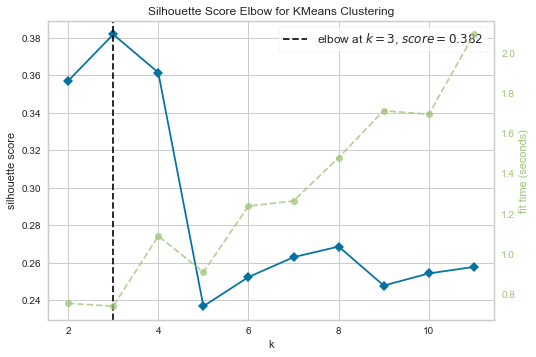

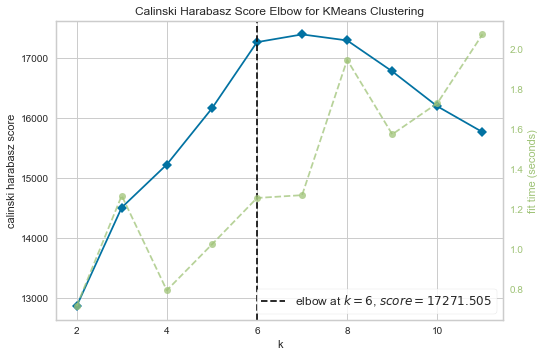

7:19: E703 statement ends with a semicolon
14:19: E703 statement ends with a semicolon
20:19: E703 statement ends with a semicolon


Temps d'exécution : 11.41min


In [102]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer1 = KElbowVisualizer(model, k=(2, 12))

visualizer1.fit(X_scale)        # Fit the data to the visualizer
visualizer1.show();        # Finalize and render the figure


# Instantiate the clustering model and visualizer
visualizer2 = KElbowVisualizer(model, k=(2, 12), metric='silhouette')

visualizer2.fit(X_scale)        # Fit the data to the visualizer
visualizer2.show();        # Finalize and render the figure

# Instantiate the clustering model and visualizer
visualizer3 = KElbowVisualizer(model, k=(2, 12), metric='calinski_harabasz')

visualizer3.fit(X_scale)        # Fit the data to the visualizer
visualizer3.show();        # Finalize and render the figure
duree = Affichage_duree(start)

### Visu silhouettes

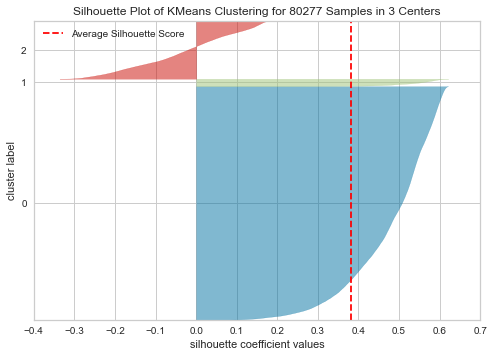

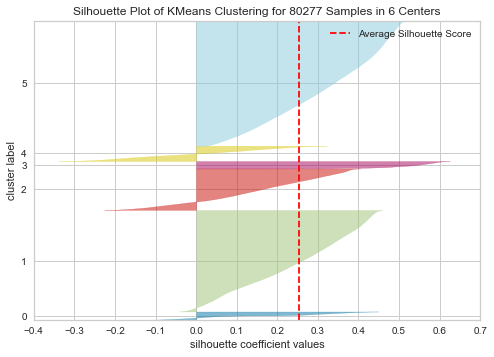

Temps d'exécution : 4.40min


In [103]:
liste_k = [3, 6]
start = timeit.default_timer()
for k in liste_k:
    model = KMeans(n_clusters=k)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()
duree = Affichage_duree(start)

### Intercluster distance map

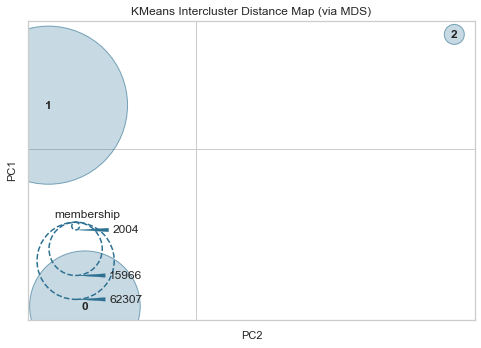

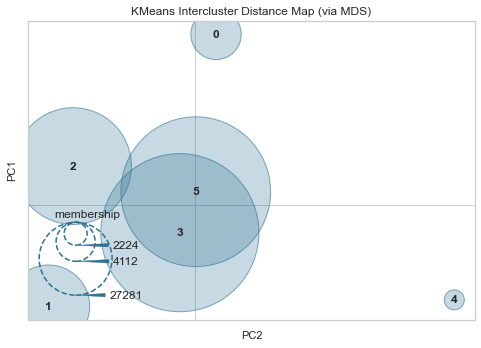

Temps d'exécution : 2.60s


In [104]:
liste_k = [3, 6]
start = timeit.default_timer()
for k in liste_k:
    # Instantiate the clustering model and visualizer
    model = KMeans(n_clusters=k)
    visualizer = InterclusterDistance(model)

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure
duree = Affichage_duree(start)

### Projection sur pCA

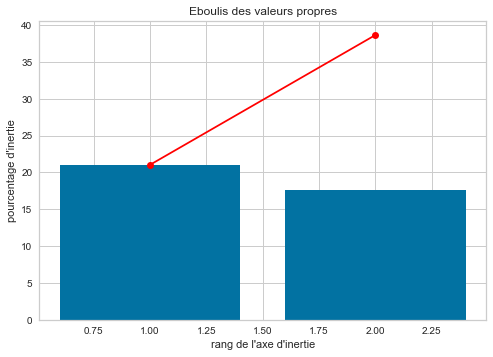

Temps d'exécution : 0.18s


In [105]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X_kmeans.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X_kmeans)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X_kmeans)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
nb cluster = 3
Temps d'exécution : 1.11s
----------
nb cluster = 6
Temps d'exécution : 1.00s
Temps d'exécution : 1.09min


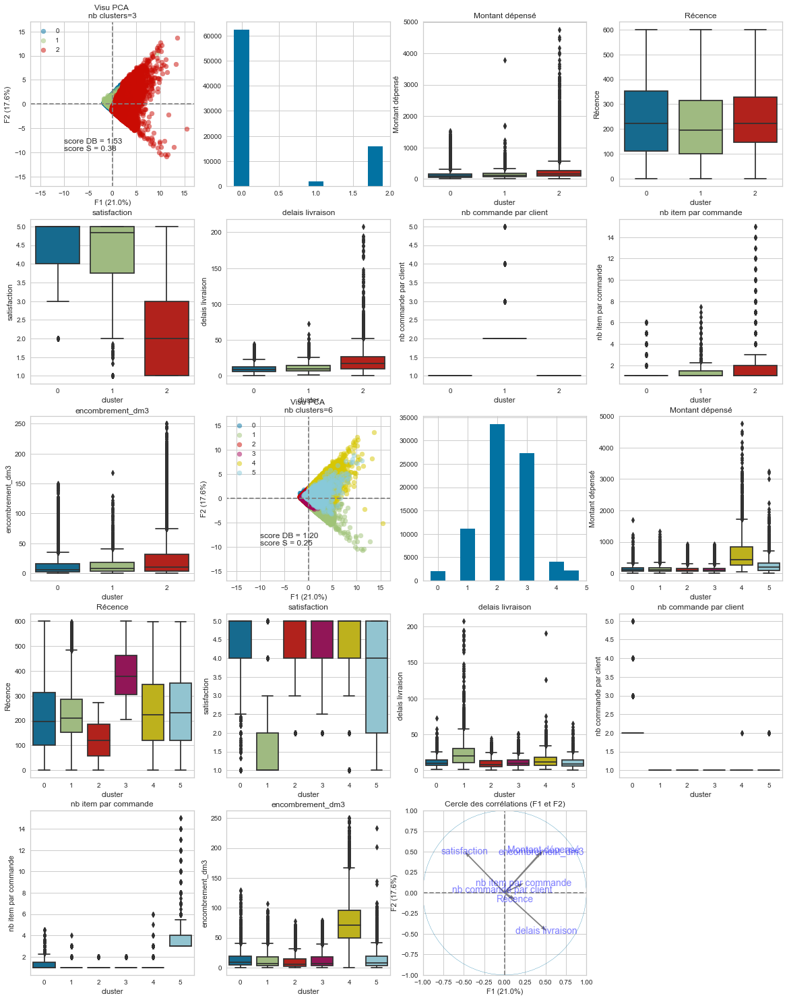

In [106]:
liste_k = [3, 6]
affichage_clustering_liste(X, X_kmeans, liste_k)

### CHOIX CLUSTER

Montant dépensé                            Récence         \
                   mean  median            var        mean median   
cluster                                                             
0            143.975985  111.00   16525.642904  214.638973  195.0   
1            143.704997  108.51   15165.458585  231.662924  210.0   
2            123.272175   94.74   10605.869842  121.613279  119.0   
3            123.819448   95.02   10195.716781  387.199831  377.0   
4            626.809456  426.34  310039.561178  240.819908  224.0   
5            266.394506  188.77   86110.003596  244.489658  230.5   

                      satisfaction                  delais livraison  ...  \
                  var         mean median       var             mean  ...   
cluster                                                               ...   
0        20016.503851     4.241207    5.0  1.099794        11.602669  ...   
1        15918.704388     1.639123    1.0  0.878739        22.401653  ...   
2         5281.559059     4.642661    5.0  0.379409         9.424704  ...   
3         8653.249781     4.596012    5.0  0.428827        10.953561  ...   
4        21832.754803     4.185447    5.0  1.483615        13.561694  ...   
5        22686.105156     3.619077    4.0  2.482151        10.879672  ...   

                    nb commande par client                   \
                var                   mean median       var   
cluster                                                       
0         51.904326               2.088117    2.0  0.121703   
1        255.248883               1.000000    1.0  0.000000   
2         33.691207               1.000000    1.0  0.000000   
3         36.339864               1.000000    1.0  0.000000   
4         86.147909               1.000487    1.0  0.000487   
5         54.151315               1.007194    1.0  0.007146   

        nb item par commande                  encombrement_dm3           \
                        mean median       var             mean   median   
cluster                                                                   
0                   1.275143    1.0  0.272349        14.116582   8.3505   
1                   1.168493    1.0  0.149278        12.773409   6.2400   
2                   1.083271    1.0  0.076339        10.392707   5.1840   
3                   1.091852    1.0  0.083418        12.573062   6.9120   
4                   1.144317    1.0  0.167337        74.956892  70.8750   
5                   4.035971    3.0  2.522097        14.656624   8.0000   

                      
                 var  
cluster               
0         269.292320  
1         226.363492  
2         144.955768  
3         189.418073  
4        2015.678887  
5         343.040988  

[6 rows x 21 columns]

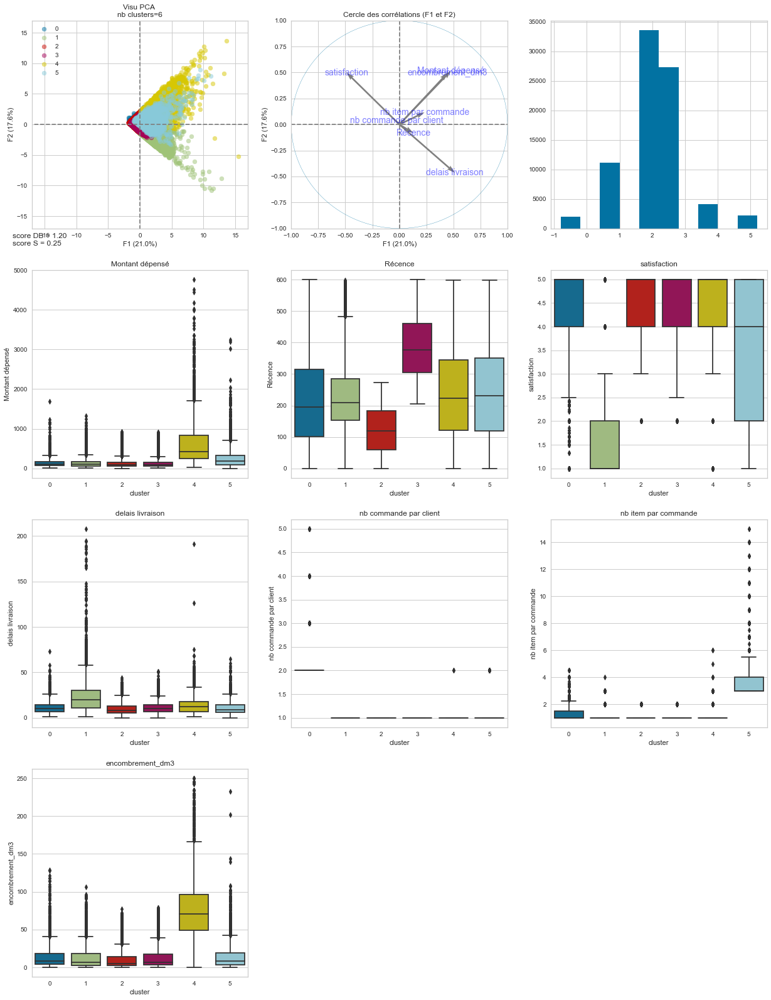

In [107]:
resultat, stats = visualisation_clustering_definitif(X, X_kmeans, k=6)
stats

Interprétation 6 clusters :
- cluster 0 = clients ayant commandé plus d'1 fois
- cluster 1 = clients insatisfaits + délais de livraison les plus longs
- cluster 2 = clients les plus récents, n'ayant commandé qu'une fois
- cluster 3 = clients ayant commandé il y a longtemps, une seule fois
- cluster 4 = clients ayant dépensé beaucoup d'argent et commandé des objets volumineux
- cluster 5 = clients ayant commandé en moyenne plus d'un item par commande + clients moyennement satisfaits

## BILAN
certaines features semblent systématiquement corrélées par le clustering :
- satisfaction et délais de livraison : plus les délais de livraison sont grand plus les clients sont insatisfaits
- encombrement et montant dépensé : plus un client commande des objets volumineux plus il dépense de l'argent

==> test de kmeans 
   - avec toutes les features sauf le délais de livraison
   - avec toutes les features sauf encombrement
   - avec toutes les features sauf encombrement et délais de livraison

### toutes les features sauf délais de livraison

In [108]:
X_kmeans = X.drop(['delais livraison'],
                  axis=1)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [109]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_kmeans)

#### choix k

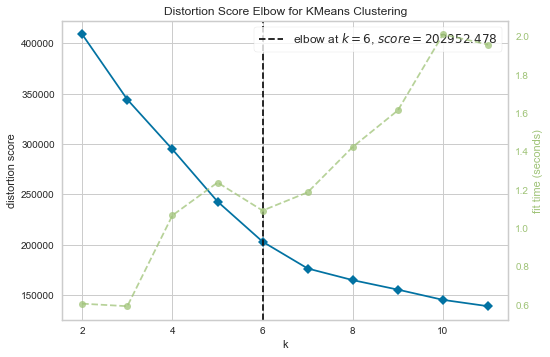

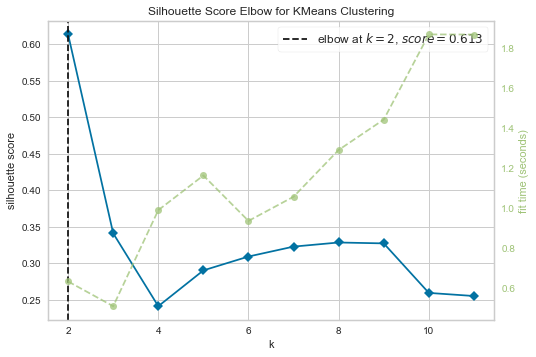

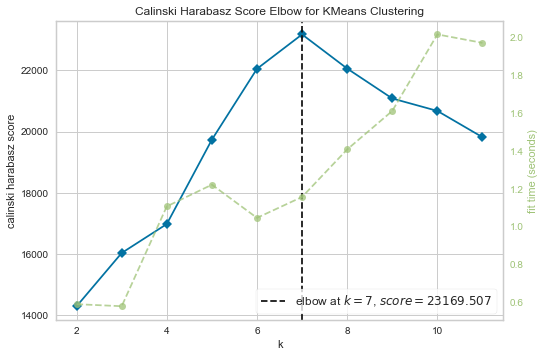

7:19: E703 statement ends with a semicolon
14:19: E703 statement ends with a semicolon
20:19: E703 statement ends with a semicolon


Temps d'exécution : 11.34min


In [110]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMeans(random_state=0)
visualizer1 = KElbowVisualizer(model, k=(2, 12))

visualizer1.fit(X_scale)        # Fit the data to the visualizer
visualizer1.show();        # Finalize and render the figure


# Instantiate the clustering model and visualizer
visualizer2 = KElbowVisualizer(model, k=(2, 12), metric='silhouette')

visualizer2.fit(X_scale)        # Fit the data to the visualizer
visualizer2.show();        # Finalize and render the figure

# Instantiate the clustering model and visualizer
visualizer3 = KElbowVisualizer(model, k=(2, 12), metric='calinski_harabasz')

visualizer3.fit(X_scale)        # Fit the data to the visualizer
visualizer3.show();        # Finalize and render the figure
duree = Affichage_duree(start)

#### Visu silhouettes

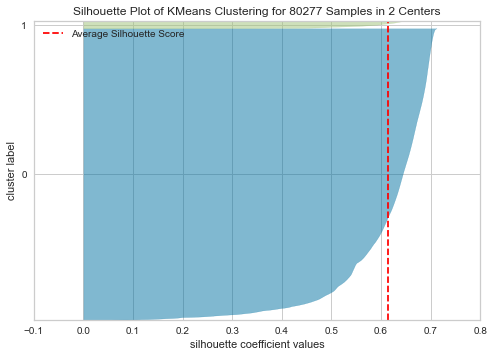

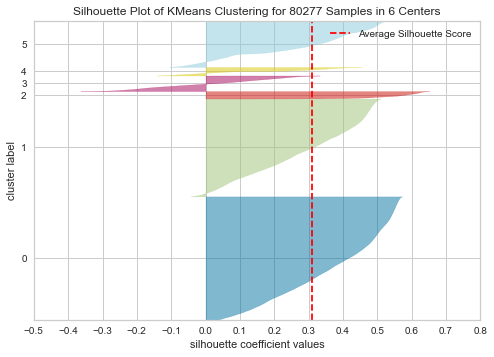

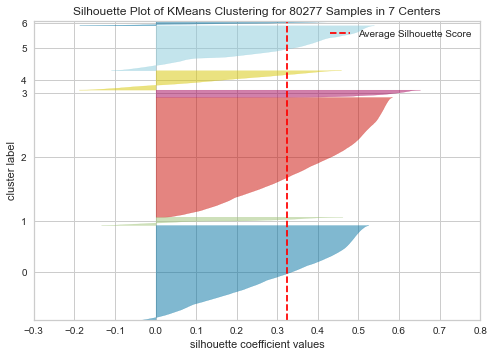

Temps d'exécution : 6.60min


In [111]:
liste_k = [2, 6, 7]
start = timeit.default_timer()
for k in liste_k:
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()
duree = Affichage_duree(start)

#### Intercluster distance map

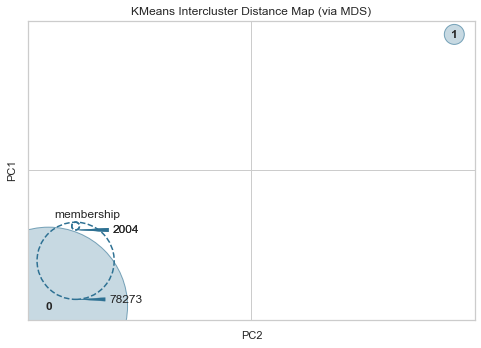

C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_mds.py:517: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


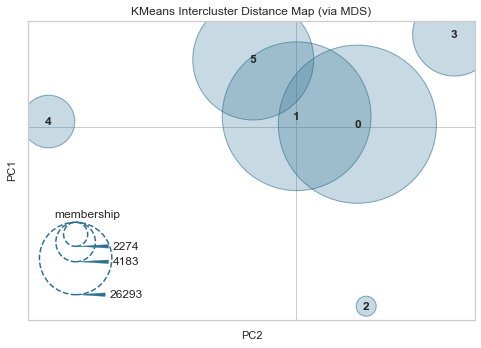

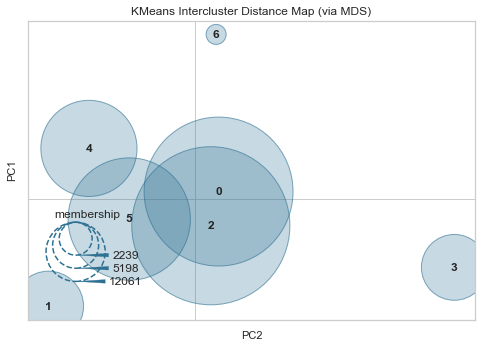

Temps d'exécution : 3.33s


In [112]:
liste_k = [2, 6, 7]
start = timeit.default_timer()
for k in liste_k:
    # Instantiate the clustering model and visualizer
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = InterclusterDistance(model)

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure
duree = Affichage_duree(start)

#### Projection sur PCA

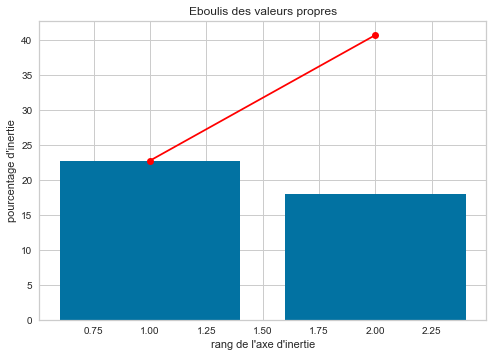

Temps d'exécution : 0.17s


In [113]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X_kmeans.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X_kmeans)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X_kmeans)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
nb cluster = 2
Temps d'exécution : 0.63s
----------
nb cluster = 6
Temps d'exécution : 0.95s
----------
nb cluster = 7
Temps d'exécution : 1.14s
Temps d'exécution : 1.08min


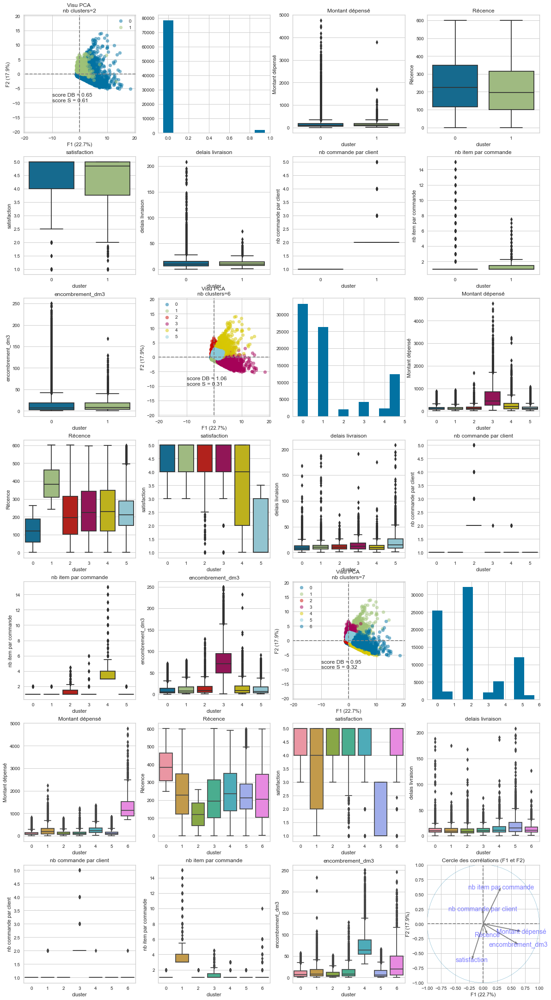

In [114]:
liste_k = [2, 6, 7]
affichage_clustering_liste(X, X_kmeans, liste_k)

#### CHOIX CLUSTER

Montant dépensé                             Récence         \
                   mean   median            var        mean median   
cluster                                                              
0            124.044136   96.120   10534.327732  122.433381  119.0   
1            123.770183   94.560   10208.851228  390.813030  382.0   
2            143.661892  110.900   16337.946314  214.702267  195.0   
3            625.792313  428.780  306039.871587  240.327038  224.0   
4            265.086455  188.195   85086.413287  244.302551  229.0   
5            136.765874  104.850   13319.498255  230.847712  211.0   

                      satisfaction                  nb commande par client  \
                  var         mean median       var                   mean   
cluster                                                                      
0         5410.271512     4.699496    5.0  0.275064               1.000000   
1         8456.293049     4.641977    5.0  0.344420               1.000000   
2        20018.632581     4.242840    5.0  1.095050               2.088161   
3        21810.841849     4.153717    5.0  1.561014               1.000478   
4        22435.733324     3.567646    4.0  2.557611               1.007476   
5        15452.454530     1.717214    1.0  0.744844               1.000000   

                         nb item par commande                   \
        median       var                 mean median       var   
cluster                                                          
0          1.0  0.000000             1.079877    1.0  0.073499   
1          1.0  0.000000             1.091127    1.0  0.082826   
2          2.0  0.121760             1.273518    1.0  0.267242   
3          1.0  0.000478             1.143199    1.0  0.165764   
4          1.0  0.007423             4.014292    3.0  2.488907   
5          1.0  0.000000             1.163506    1.0  0.136783   

        encombrement_dm3                       
                    mean  median          var  
cluster                                        
0              10.441520   5.184   146.316802  
1              12.592650   6.912   190.115831  
2              14.111603   8.349   269.378793  
3              74.601387  70.875  2004.362417  
4              14.649661   8.000   346.071560  
5              12.253544   6.050   200.147421

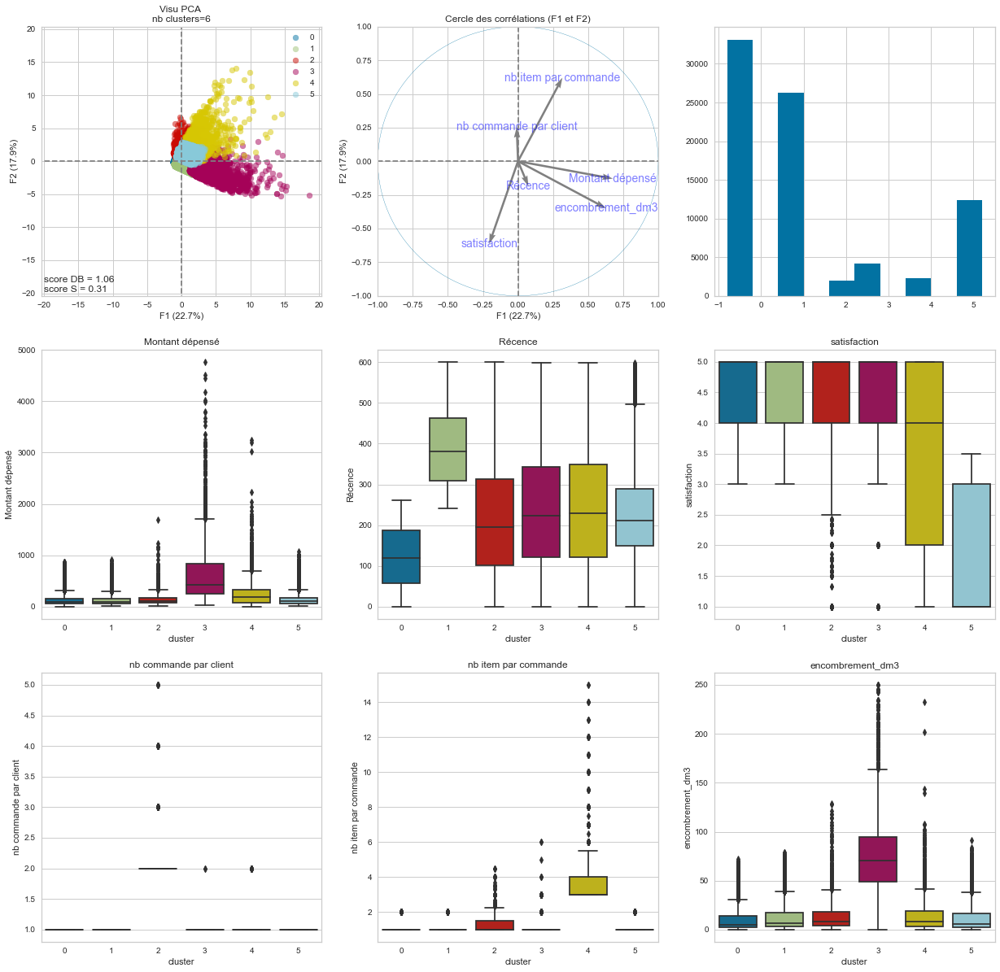

In [115]:
resultat, stats = visualisation_clustering_definitif(X, X_kmeans, k=6)
stats

In [116]:
resultat['cluster'].value_counts()

0    33151
1    26293
5    12391
3     4183
4     2274
2     1985
Name: cluster, dtype: int64

Inteprétation 6 clusters
- cluster 0 = clients ayant commandé récemment, une seule commande à leur actif
- cluster 1 = clients n'ayant pas commandé depuis longtemps, une seule commande à leur actif
- cluster 2 = clients ayant commandé plus d'une fois
- cluster 3 = clients ayant dépensé plus d'argent que les autres, commandé des objets plus encombrants
- cluster 4 = clients moyennement satisfaits, ayant commandé plus d'un item par commande en moyenne
- cluster 5 = clients insatisfaits, une seule commande à leur actif

### toutes les features sauf encombrement

In [117]:
X_kmeans = X.drop(['encombrement_dm3'],
                  axis=1)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [118]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_kmeans)

#### choix k

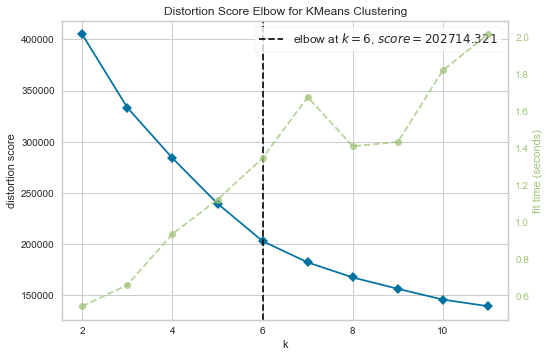

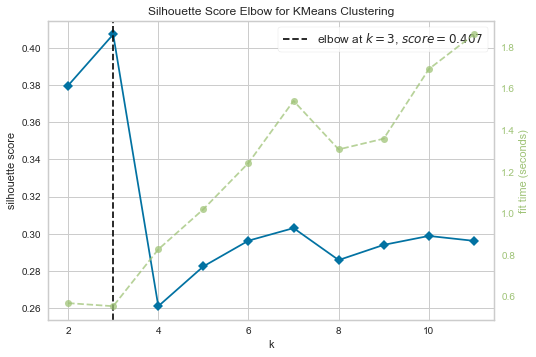

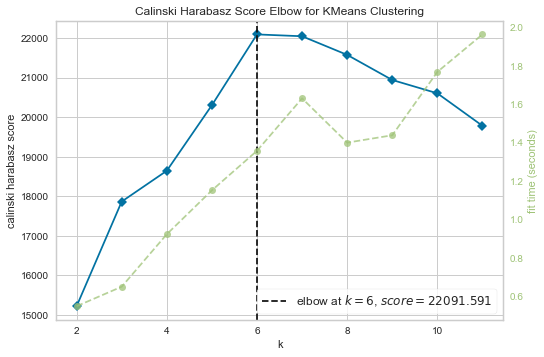

7:19: E703 statement ends with a semicolon
14:19: E703 statement ends with a semicolon
20:19: E703 statement ends with a semicolon


Temps d'exécution : 11.32min


In [119]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMeans(random_state=0)
visualizer1 = KElbowVisualizer(model, k=(2, 12))

visualizer1.fit(X_scale)        # Fit the data to the visualizer
visualizer1.show();        # Finalize and render the figure


# Instantiate the clustering model and visualizer
visualizer2 = KElbowVisualizer(model, k=(2, 12), metric='silhouette')

visualizer2.fit(X_scale)        # Fit the data to the visualizer
visualizer2.show();        # Finalize and render the figure

# Instantiate the clustering model and visualizer
visualizer3 = KElbowVisualizer(model, k=(2, 12), metric='calinski_harabasz')

visualizer3.fit(X_scale)        # Fit the data to the visualizer
visualizer3.show();        # Finalize and render the figure
duree = Affichage_duree(start)

#### Visu silhouettes

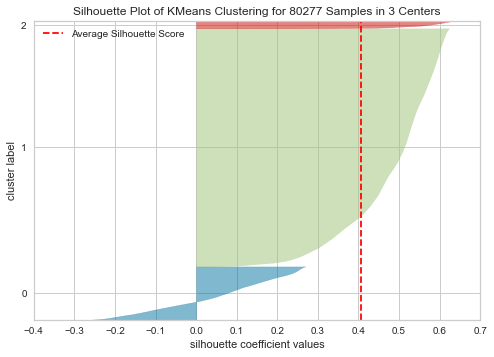

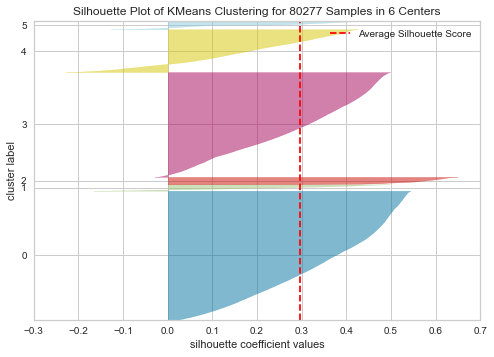

Temps d'exécution : 4.46min


In [120]:
liste_k = [3, 6]
start = timeit.default_timer()
for k in liste_k:
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()
duree = Affichage_duree(start)

#### Intercluster distance map

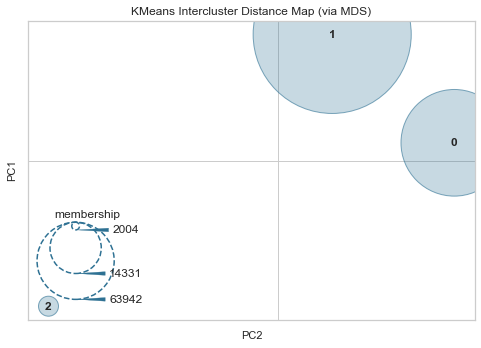

C:\Users\Helene\anaconda3\lib\site-packages\sklearn\manifold\_mds.py:517: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


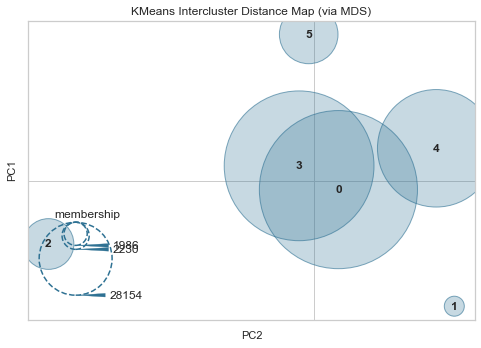

Temps d'exécution : 2.28s


In [121]:
liste_k = [3, 6]
start = timeit.default_timer()
for k in liste_k:
    # Instantiate the clustering model and visualizer
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = InterclusterDistance(model)

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure
duree = Affichage_duree(start)

#### Projection sur PCA

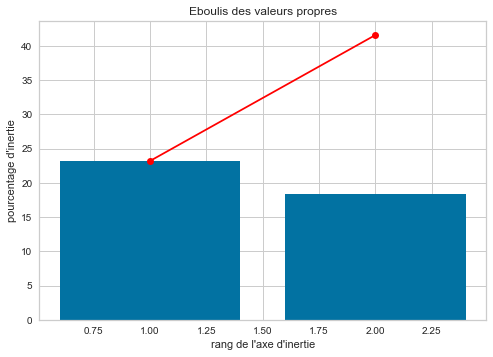

Temps d'exécution : 0.17s


In [122]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X_kmeans.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X_kmeans)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X_kmeans)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
nb cluster = 3
Temps d'exécution : 0.59s
----------
nb cluster = 6
Temps d'exécution : 1.25s
Temps d'exécution : 1.11min


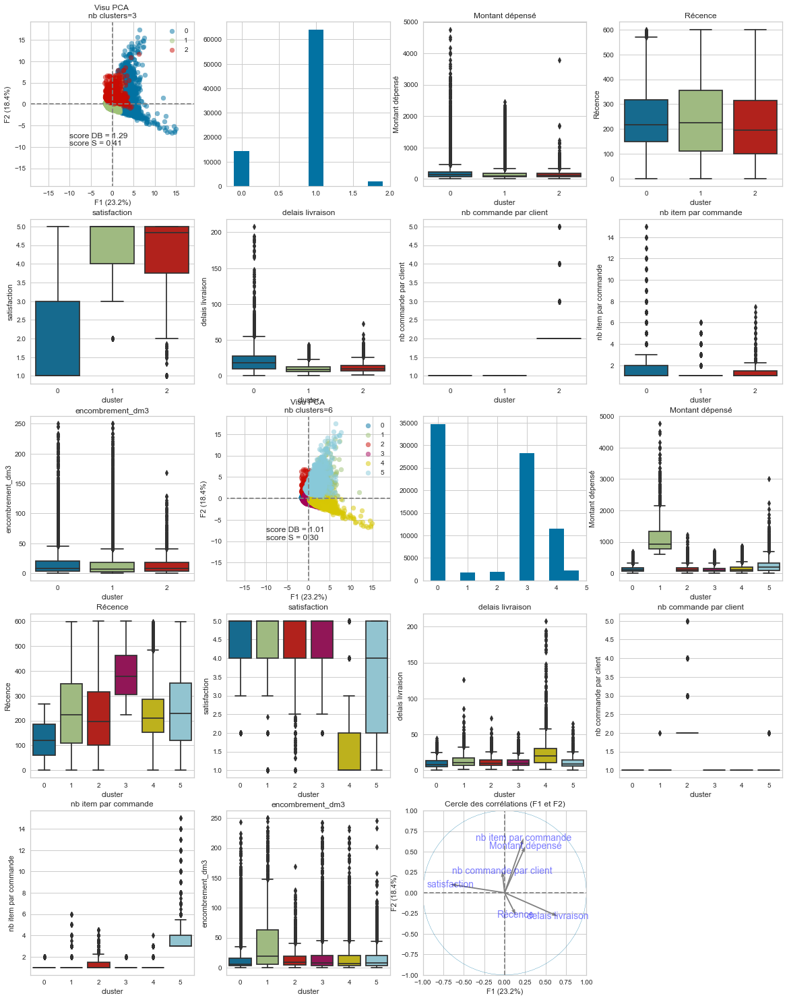

In [123]:
liste_k = [3, 6]
affichage_clustering_liste(X, X_kmeans, liste_k)

#### Choix cluster

Montant dépensé                              Récence         \
                   mean    median            var        mean median   
cluster                                                               
0            127.636854   98.3400   10579.374119  121.982346  119.0   
1           1146.041872  931.3700  304919.040781  235.528629  224.0   
2            143.334380  111.0000   15348.965212  214.851964  195.0   
3            128.170862   97.2300   10567.446036  387.302444  377.0   
4            147.702994  112.0650   14551.431459  231.951355  210.0   
5            254.305041  187.9325   66598.915860  244.387444  229.5   

                      satisfaction                  delais livraison         \
                  var         mean median       var             mean median   
cluster                                                                       
0         5258.936137     4.640671    5.0  0.379497         9.514914    8.0   
1        22455.000482     4.207304    5.0  1.621624        13.202677   11.0   
2        20032.168502     4.242501    5.0  1.098427        11.608495   10.0   
3         8628.509917     4.594800    5.0  0.428781        11.007992   10.0   
4        15919.166081     1.652884    1.0  0.896006        22.349809   20.0   
5        22799.289928     3.618308    4.0  2.484362        10.945466    9.0   

                    nb commande par client                   \
                var                   mean median       var   
cluster                                                       
0         34.548184               1.000000    1.0  0.000000   
1         90.753482               1.001157    1.0  0.001156   
2         51.923082               2.088117    2.0  0.121703   
3         36.684020               1.000000    1.0  0.000000   
4        253.462455               1.000000    1.0  0.000000   
5         54.915182               1.007175    1.0  0.007127   

        nb item par commande                   
                        mean median       var  
cluster                                        
0                   1.083482    1.0  0.076515  
1                   1.173800    1.0  0.298624  
2                   1.273884    1.0  0.269892  
3                   1.093202    1.0  0.084518  
4                   1.170083    1.0  0.149160  
5                   4.025112    3.0  2.520455

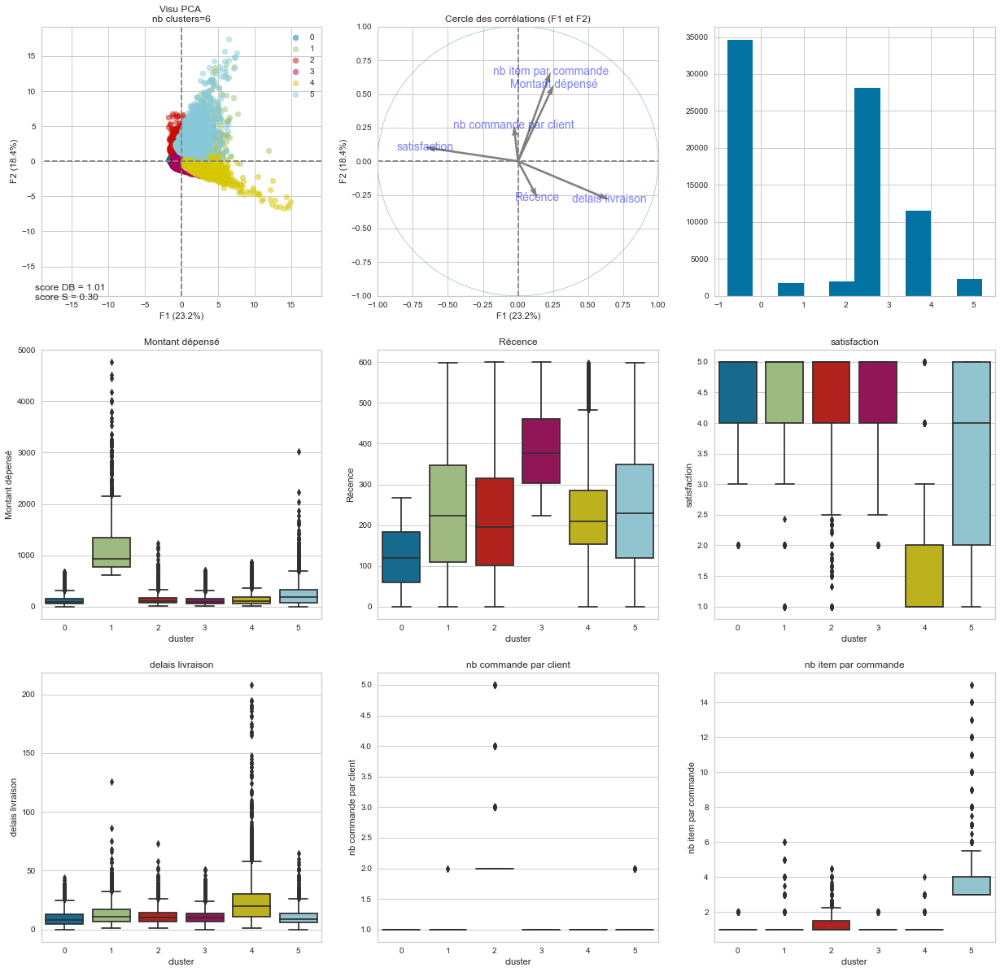

In [124]:
resultat, stats = visualisation_clustering_definitif(X, X_kmeans, k=6)
stats

In [125]:
resultat['cluster'].value_counts()

0    34666
3    28154
4    11512
5     2230
2     1986
1     1729
Name: cluster, dtype: int64

Interprétation cluster :
- cluster 0 : clients ayant commandé recemment, une seule fois
- cluster 1 : clients ayant dépensé plus d'argent que les autres
- cluster 2 : clients ayant commandé plus d'une fois, souvent plusieurs item par commande
- cluster 3 : clients n'ayant pas commandé récemment, une seule commande à leur actif
- cluster 4 : clients insatisfaits, grands délais de livraison
- cluster 5 : clients ayant commandé plus d'un item par commande, moyennement satisfaits

### Toutes les features sauf encombrement et délais de livraison

In [126]:
X_kmeans = X.drop(['encombrement_dm3',
                   'delais livraison'],
                  axis=1)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [127]:
X_kmeans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80277 entries, 0 to 80276
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Montant dépensé         80277 non-null  float64
 1   Récence                 80277 non-null  float64
 2   satisfaction            80277 non-null  float64
 3   nb commande par client  80277 non-null  float64
 4   nb item par commande    80277 non-null  float64
dtypes: float64(5)
memory usage: 3.1 MB


In [128]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_kmeans)

#### Choix k

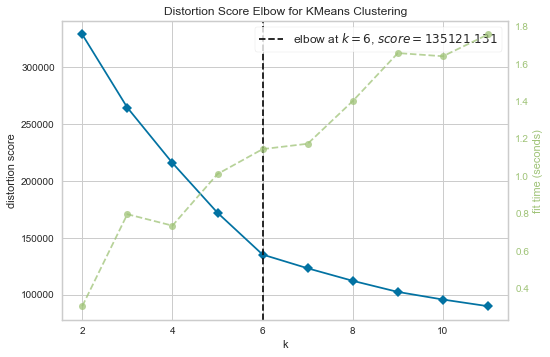

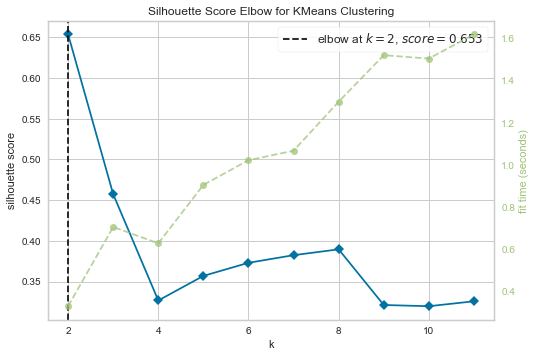

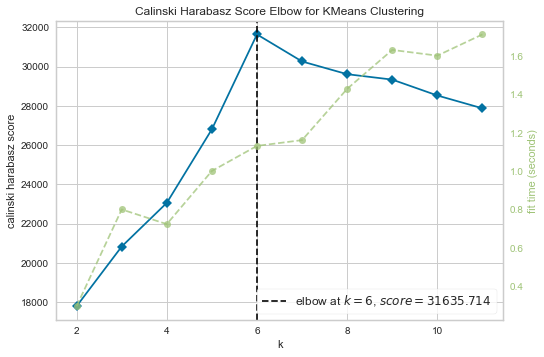

7:19: E703 statement ends with a semicolon
14:19: E703 statement ends with a semicolon
20:19: E703 statement ends with a semicolon


Temps d'exécution : 11.21min


In [129]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMeans(random_state=0)
visualizer1 = KElbowVisualizer(model, k=(2, 12))

visualizer1.fit(X_scale)        # Fit the data to the visualizer
visualizer1.show();        # Finalize and render the figure


# Instantiate the clustering model and visualizer
visualizer2 = KElbowVisualizer(model, k=(2, 12), metric='silhouette')

visualizer2.fit(X_scale)        # Fit the data to the visualizer
visualizer2.show();        # Finalize and render the figure

# Instantiate the clustering model and visualizer
visualizer3 = KElbowVisualizer(model, k=(2, 12), metric='calinski_harabasz')

visualizer3.fit(X_scale)        # Fit the data to the visualizer
visualizer3.show();        # Finalize and render the figure
duree = Affichage_duree(start)

#### Visu silhouettes

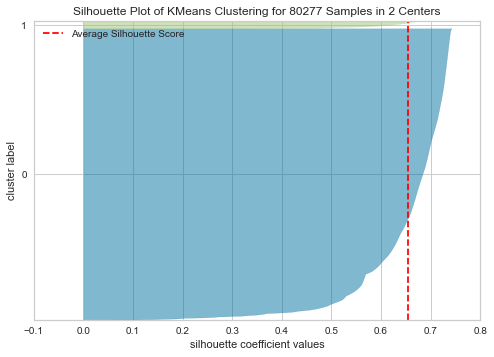

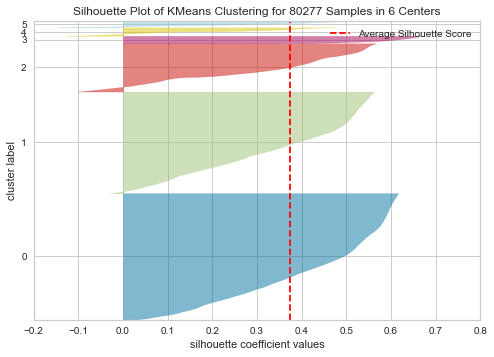

Temps d'exécution : 4.45min


In [130]:
liste_k = [2, 6]
start = timeit.default_timer()
for k in liste_k:
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()
duree = Affichage_duree(start)

#### Intercluster distance map

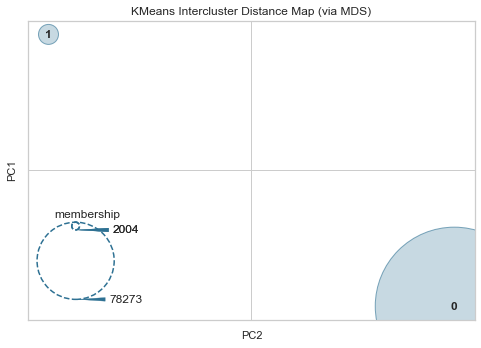

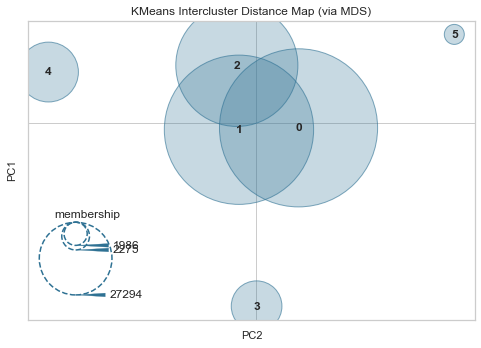

Temps d'exécution : 1.76s


In [131]:
liste_k = [2, 6]
start = timeit.default_timer()
for k in liste_k:
    # Instantiate the clustering model and visualizer
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = InterclusterDistance(model)

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure
duree = Affichage_duree(start)

#### Projection sur PCA

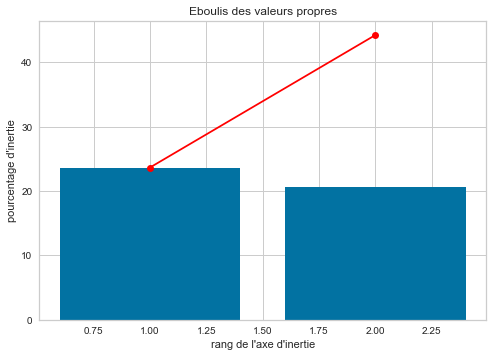

Temps d'exécution : 0.16s


In [132]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X_kmeans.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X_kmeans)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X_kmeans)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
nb cluster = 2
Temps d'exécution : 0.32s
----------
nb cluster = 6
Temps d'exécution : 1.05s
Temps d'exécution : 1.08min


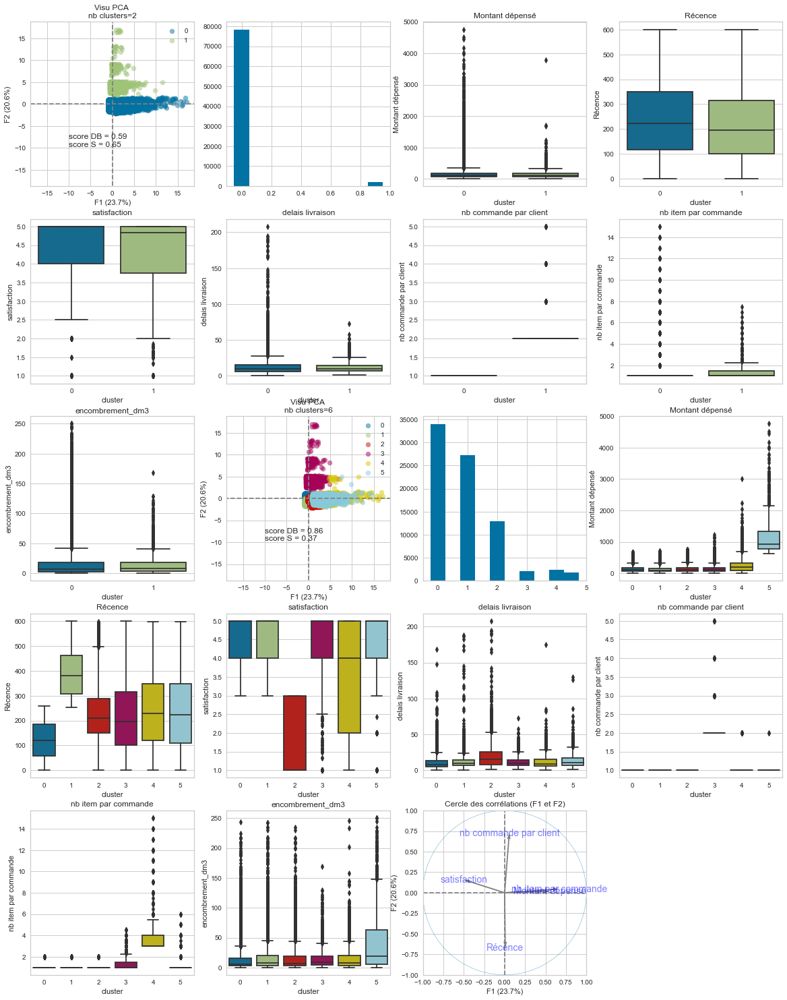

In [133]:
liste_k = [2, 6]
affichage_clustering_liste(X, X_kmeans, liste_k)

#### Choix cluster

Montant dépensé                            Récence         \
                   mean  median            var        mean median   
cluster                                                             
0            128.841711   99.43   10671.646508  122.217899  119.0   
1            127.988683   97.01   10552.207818  390.076537  380.0   
2            141.997288  107.08   13611.091405  230.292316  211.0   
3            143.334380  111.00   15348.965212  214.851964  195.0   
4            253.888856  187.80   66392.447797  244.177143  229.0   
5           1145.139364  927.79  303925.395472  235.979827  224.0   

                      satisfaction                  nb commande par client  \
                  var         mean median       var                   mean   
cluster                                                                      
0         5358.337894     4.703350    5.0  0.267811               1.000000   
1         8494.481043     4.640452    5.0  0.344459               1.000000   
2        15439.803365     1.736422    1.0  0.756711               1.000000   
3        20032.168502     4.242501    5.0  1.098427               2.088117   
4        22540.469486     3.574429    4.0  2.548594               1.007033   
5        22524.956340     4.195636    5.0  1.644213               1.001153   

                         nb item par commande                   
        median       var                 mean median       var  
cluster                                                         
0          1.0  0.000000             1.080970    1.0  0.074416  
1          1.0  0.000000             1.091778    1.0  0.083358  
2          1.0  0.000000             1.164326    1.0  0.137334  
3          2.0  0.121703             1.273884    1.0  0.269892  
4          1.0  0.006987             4.005714    3.0  2.490073  
5          1.0  0.001152             1.169741    1.0  0.291962

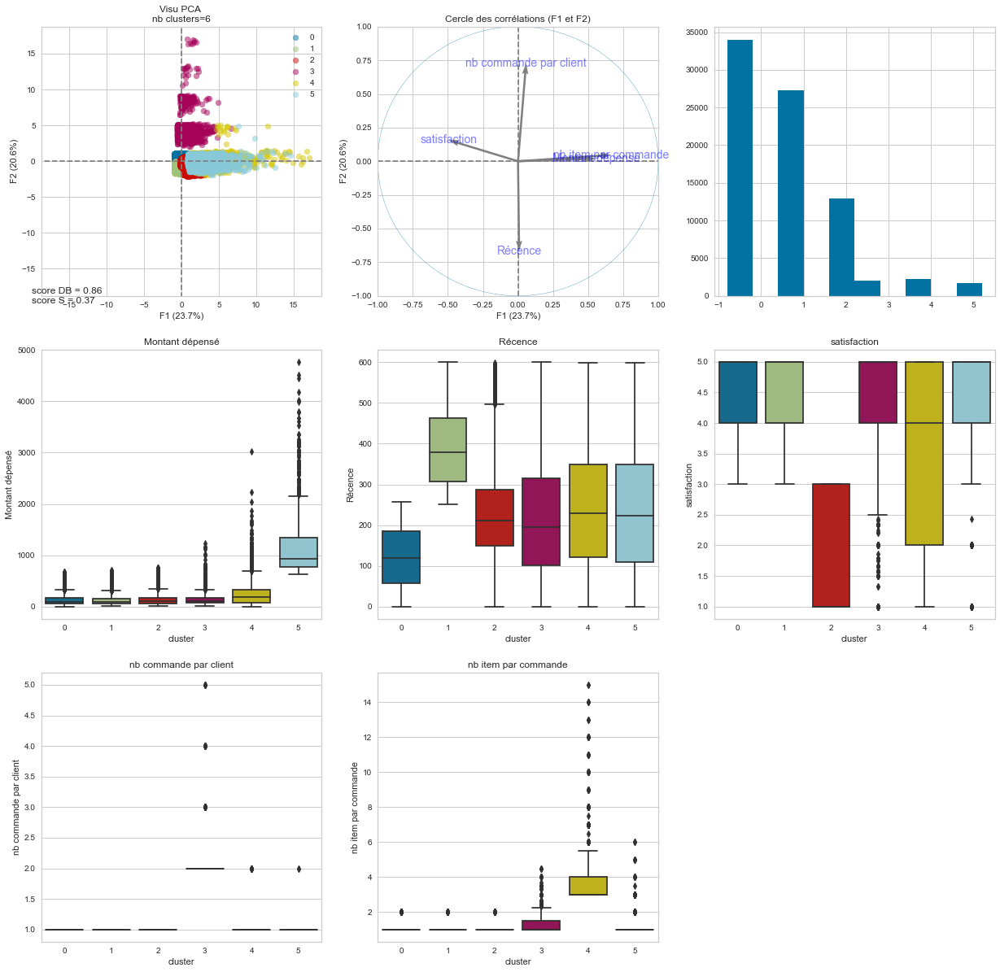

In [134]:
resultat, stats = visualisation_clustering_definitif(X, X_kmeans, k=6)
stats

In [135]:
resultat['cluster'].value_counts()

0    34025
1    27294
2    12962
4     2275
3     1986
5     1735
Name: cluster, dtype: int64

In [136]:
kmeans = make_pipeline(preprocessor_quanti,
                       KMeans(n_clusters=6,
                              random_state=0))
X_scaled = pd.DataFrame(kmeans['columntransformer'].fit_transform(X_kmeans),
                        columns=kmeans['columntransformer'].get_feature_names_out())
X_cluster = kmeans.fit_predict(X_kmeans)

5:80: E501 line too long (84 > 79 characters)


In [137]:
# visu centroides
centroides = kmeans.named_steps['kmeans'].cluster_centers_
centroides

array([[-0.13649151, -0.77234149,  0.43199592, -0.15224174, -0.16897047],
       [-0.141168  ,  1.00006377,  0.3829636 , -0.15224174, -0.15182573],
       [-0.0716921 , -0.05726117, -1.87813565, -0.15224174, -0.03697906],
       [-0.06510195, -0.15942688,  0.07316058,  5.95075523,  0.13649507],
       [ 0.47979064,  0.03461194, -0.44701702, -0.11279544,  4.46210046],
       [ 4.8669554 , -0.01779757,  0.03811059, -0.14579117, -0.02902448]])

In [138]:
# transformation inverse des centroides
centroides_it = kmeans.named_steps['columntransformer']
centroides_it = centroides_it.named_transformers_['pipeline']
centroides_it = centroides_it.named_steps['standardscaler']
centroides_it = centroides_it.inverse_transform(centroides)

In [139]:
nom_colonnes = list(X_kmeans.columns)
centroides = pd.DataFrame(centroides_it, columns=nom_colonnes)
centroides = centroides.reset_index().rename(columns={'index': 'cluster'})
centroides

,cluster,Montant dépensé,Récence,satisfaction,nb commande par client,nb item par commande
0,0,128.849992,122.221889,4.703359,1.000000,1.080967
1,1,127.901168,390.086335,4.640386,1.000000,1.091795
2,2,141.997288,230.292316,1.736422,1.000000,1.164326
3,3,143.334380,214.851964,4.242501,2.088117,1.273884
4,4,253.888856,244.177143,3.574429,1.007033,4.005714
5,5,1144.010533,236.256469,4.197486,1.001150,1.169350


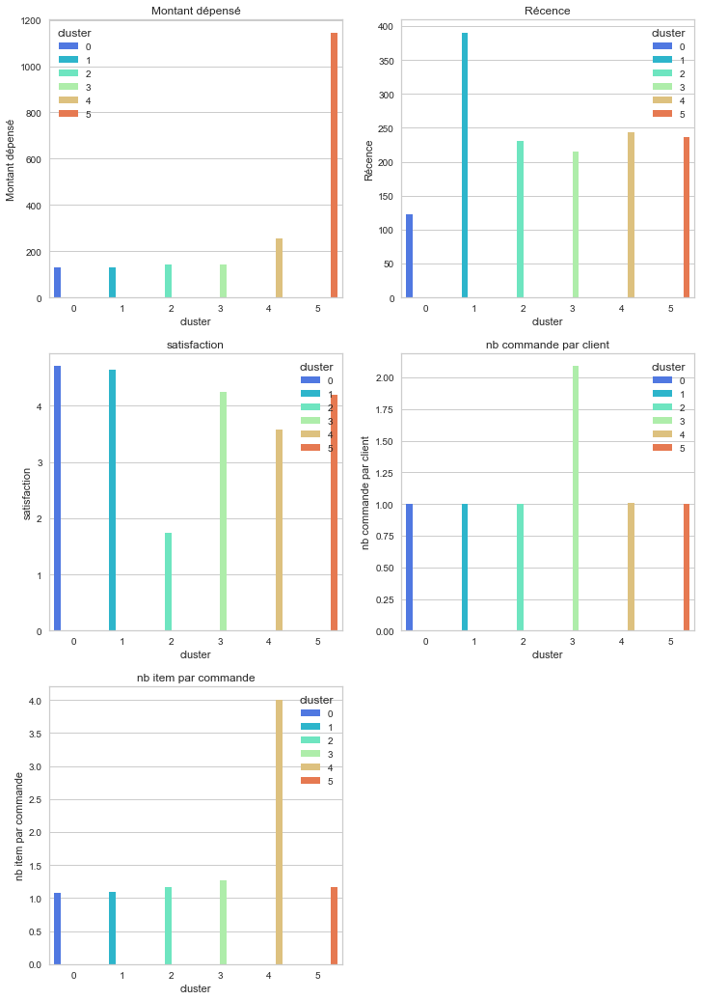

In [140]:
plt.figure(figsize=(12, 18))
compteur = 1
for feature in nom_colonnes:
    plt.subplot(3, 2, compteur)
    plt.title(feature)
    sns.barplot(data=centroides,
                y=feature,
                x='cluster',
                hue='cluster',
                palette='rainbow')
    compteur += 1

Interprétation clusters :
- cluster 0 : clients les plus récents, une seule ommande
- cluster 1 : clients n'ayant pas commandé depuis longtemps, une seule commande
- cluster 2 : clients insatisfaits
- cluster 3 : clients ayant commandé plus d'une fois
- cluster 4 : clients ayant commandé plusieurs item par commande, moyennement satisfaits
- cluster 5 : clients ayant dépensé plus d'argent que les autres

### idem sans le nettoyage préalable des features

In [141]:
data_no_cleaning = pd.read_csv('../01_DATA/data_for_modeling_no_cleaning2022-02-18_21h34.csv')
data_no_cleaning = data_no_cleaning.astype({'Récence': float, 'nb commande par client': float})
data_no_cleaning = data_no_cleaning.dropna(axis=0).drop('Unnamed: 0', axis=1)
data_no_cleaning.info()

1:80: E501 line too long (94 > 79 characters)
2:80: E501 line too long (95 > 79 characters)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80383 entries, 0 to 80382
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_unique_id        80383 non-null  object 
 1   Montant dépensé           80383 non-null  float64
 2   Récence                   80383 non-null  float64
 3   satisfaction              80383 non-null  float64
 4   delais livraison          80383 non-null  float64
 5   nb commande par client    80383 non-null  float64
 6   nb total item par client  80383 non-null  int64  
 7   nb item par commande      80383 non-null  float64
 8   product_meta_category     80383 non-null  object 
 9   encombrement_dm3          80383 non-null  float64
dtypes: float64(7), int64(1), object(2)
memory usage: 6.1+ MB


In [142]:
X = data_no_cleaning.drop(['customer_unique_id',
                           'product_meta_category',
                           'nb total item par client'], axis=1)

# listes de variables quantitatives vs qualitatives
X_quanti = list(X.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [143]:
X_kmeans = X.drop(['encombrement_dm3',
                   'delais livraison'],
                  axis=1)
# listes de variables quantitatives vs qualitatives
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [144]:
X_kmeans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80383 entries, 0 to 80382
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Montant dépensé         80383 non-null  float64
 1   Récence                 80383 non-null  float64
 2   satisfaction            80383 non-null  float64
 3   nb commande par client  80383 non-null  float64
 4   nb item par commande    80383 non-null  float64
dtypes: float64(5)
memory usage: 3.1 MB


In [145]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_kmeans)

#### choix k

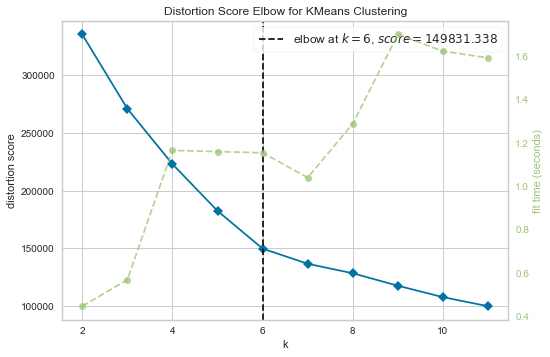

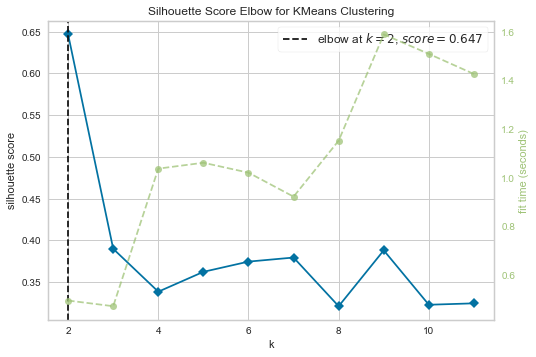

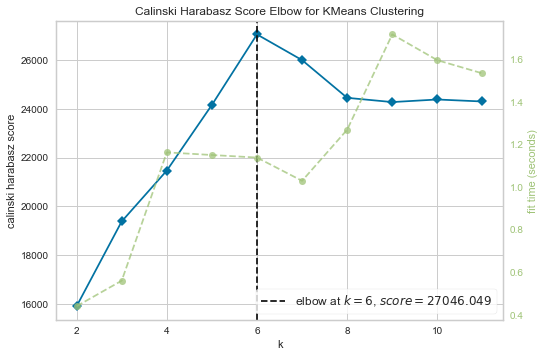

7:19: E703 statement ends with a semicolon
14:19: E703 statement ends with a semicolon
20:19: E703 statement ends with a semicolon


Temps d'exécution : 11.20min


In [146]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMeans(random_state=0)
visualizer1 = KElbowVisualizer(model, k=(2, 12))

visualizer1.fit(X_scale)        # Fit the data to the visualizer
visualizer1.show();        # Finalize and render the figure


# Instantiate the clustering model and visualizer
visualizer2 = KElbowVisualizer(model, k=(2, 12), metric='silhouette')

visualizer2.fit(X_scale)        # Fit the data to the visualizer
visualizer2.show();        # Finalize and render the figure

# Instantiate the clustering model and visualizer
visualizer3 = KElbowVisualizer(model, k=(2, 12), metric='calinski_harabasz')

visualizer3.fit(X_scale)        # Fit the data to the visualizer
visualizer3.show();        # Finalize and render the figure
duree = Affichage_duree(start)

#### Visu silhouettes

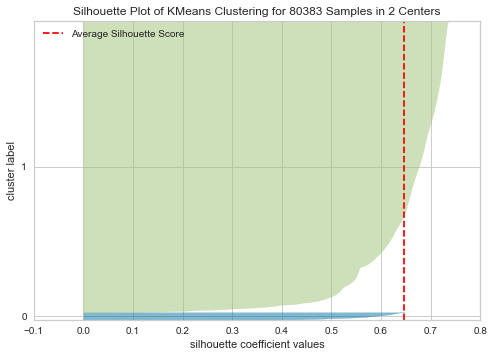

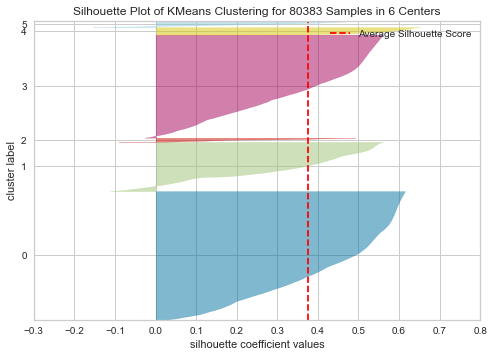

Temps d'exécution : 4.44min


In [147]:
liste_k = [2, 6]
start = timeit.default_timer()
for k in liste_k:
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()
duree = Affichage_duree(start)

#### Intercluster distance map

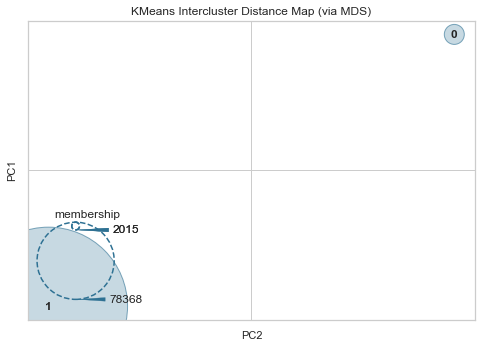

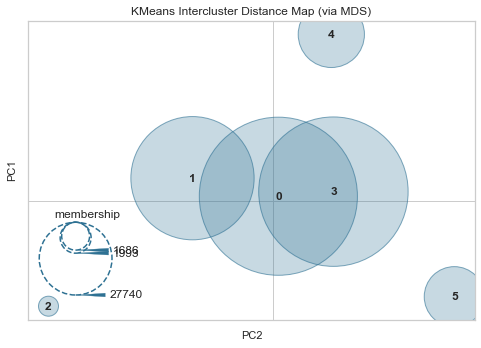

Temps d'exécution : 1.93s


In [148]:
liste_k = [2, 6]
start = timeit.default_timer()
for k in liste_k:
    # Instantiate the clustering model and visualizer
    model = KMeans(n_clusters=k, random_state=0)
    visualizer = InterclusterDistance(model)

    visualizer.fit(X_scale)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure
duree = Affichage_duree(start)

#### Projection sur PCA

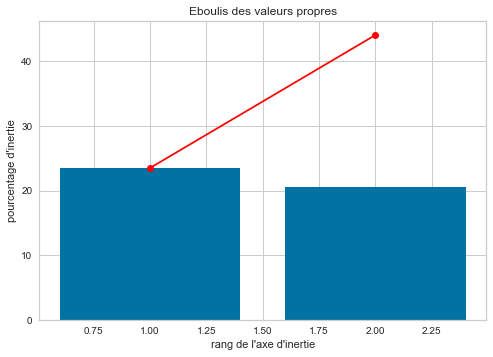

Temps d'exécution : 0.15s


In [149]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X_kmeans.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X_kmeans)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X_kmeans)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

----------
nb cluster = 2
Temps d'exécution : 0.47s
----------
nb cluster = 6
Temps d'exécution : 1.03s
Temps d'exécution : 1.08min


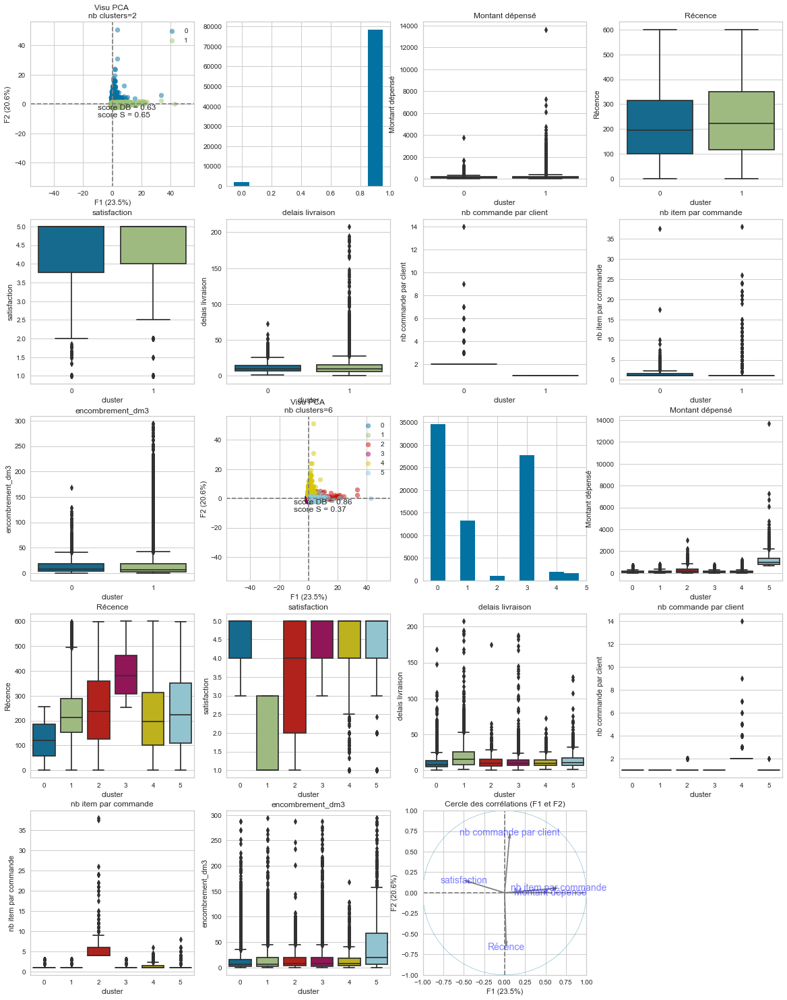

In [150]:
liste_k = [2, 6]
affichage_clustering_liste(X, X_kmeans, liste_k)

#### Choix cluster

Montant dépensé                             Récence         \
                   mean   median            var        mean median   
cluster                                                              
0            130.325045   99.800   11249.792239  122.033912  119.0   
1            146.061930  109.405   14678.421358  231.366233  213.0   
2            291.537415  199.640  105342.236484  251.966757  237.0   
3            130.034095   97.820   11405.891609  390.017484  380.0   
4            143.737848  111.100   15830.591224  214.688409  195.0   
5           1196.219316  979.450  451705.938676  237.435350  224.0   

                      satisfaction                  nb commande par client  \
                  var         mean median       var                   mean   
cluster                                                                      
0         5327.431111     4.695846    5.0  0.278689               1.000000   
1        15401.000320     1.716785    1.0  0.744456               1.000000   
2        23503.789362     3.548529    4.0  2.583425               1.017969   
3         8494.852248     4.639600    5.0  0.345313               1.000000   
4        20096.781879     4.243415    5.0  1.097233               2.107376   
5        22835.906500     4.175818    5.0  1.684482               1.001186   

                         nb item par commande                   
        median       var                 mean median       var  
cluster                                                         
0          1.0  0.000000             1.101823    1.0  0.113469  
1          1.0  0.000000             1.223851    1.0  0.236638  
2          1.0  0.017662             5.362983    4.0  8.342046  
3          1.0  0.000000             1.115970    1.0  0.128048  
4          2.0  0.257541             1.276378    1.0  0.280364  
5          1.0  0.001186             1.220937    1.0  0.415401

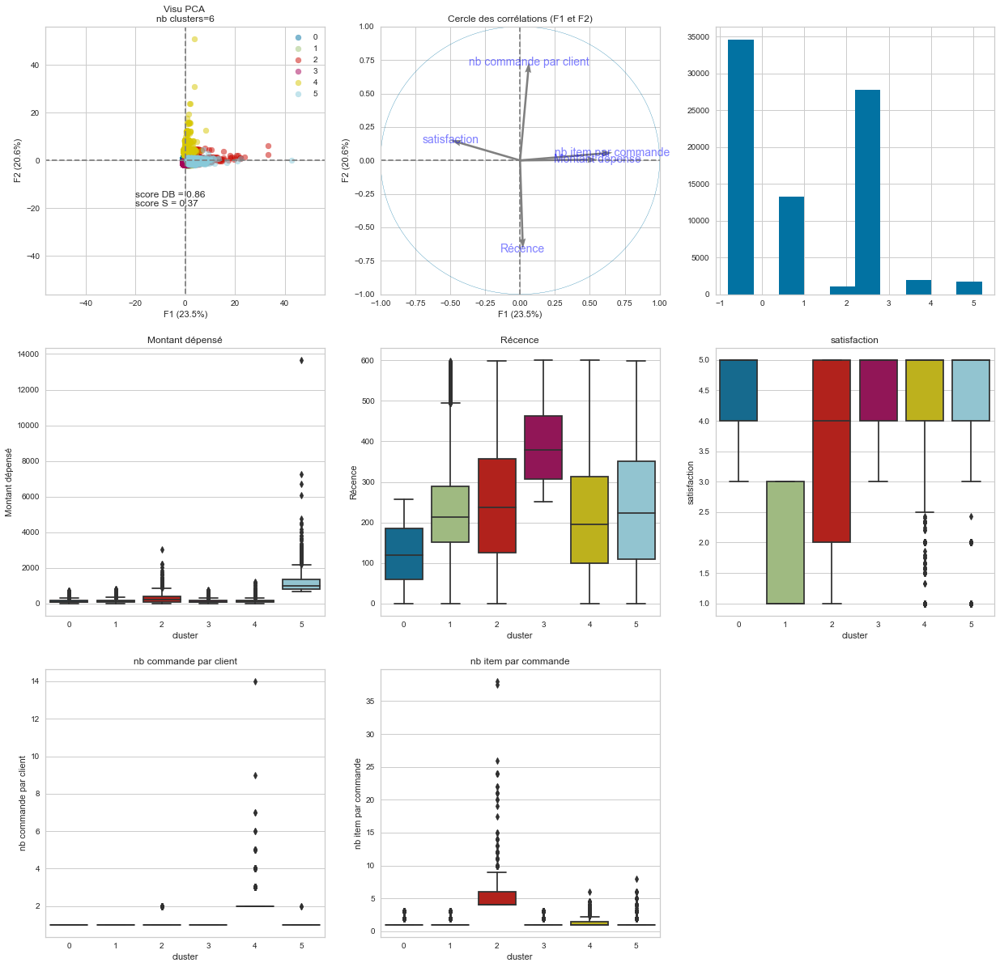

1:80: E501 line too long (94 > 79 characters)


In [151]:
resultat_no_cleaning, stats_no_cleaning = visualisation_clustering_definitif(X, X_kmeans, k=6)
stats_no_cleaning

In [152]:
resultat_no_cleaning['cluster'].value_counts()

0    34619
3    27740
1    13232
4     1993
5     1686
2     1113
Name: cluster, dtype: int64

In [153]:
# visu centroides
kmeans = make_pipeline(preprocessor_quanti,
                       KMeans(n_clusters=6,
                              random_state=0))
X_scaled = pd.DataFrame(kmeans['columntransformer'].fit_transform(X_kmeans),
                        columns=kmeans['columntransformer'].get_feature_names_out())
X_cluster_no_cleaning = kmeans.fit_predict(X_kmeans)

centroides_no_cleaning = kmeans.named_steps['kmeans'].cluster_centers_
centroides_no_cleaning

array([[-0.1279537 , -0.77395494,  0.42634905, -0.14556118, -0.1271974 ],
       [-0.05482351, -0.05067255, -1.89234324, -0.14556118,  0.04378921],
       [ 0.62385769,  0.08558727, -0.46659841, -0.0512345 ,  5.8407989 ],
       [-0.12944838,  0.99880499,  0.38258371, -0.14556118, -0.10733402],
       [-0.06527007, -0.16101485,  0.0742338 ,  5.66736425,  0.11730869],
       [ 4.83220766, -0.00934089,  0.0215166 , -0.13936003,  0.03920828]])

6:80: E501 line too long (84 > 79 characters)


In [154]:
# transformation inverse des centroides
centroides_no_cleaning_it = kmeans.named_steps['columntransformer']
centroides_no_cleaning_it = centroides_no_cleaning_it.named_transformers_['pipeline']
centroides_no_cleaning_it = centroides_no_cleaning_it.named_steps['standardscaler']
centroides_no_cleaning_it = centroides_no_cleaning_it.inverse_transform(centroides_no_cleaning)

3:80: E501 line too long (85 > 79 characters)
4:80: E501 line too long (83 > 79 characters)
5:80: E501 line too long (95 > 79 characters)


In [155]:
nom_colonnes = list(X_kmeans.columns)
centroides_no_cleaning = pd.DataFrame(centroides_no_cleaning_it, columns=nom_colonnes)
centroides_no_cleaning = centroides_no_cleaning.reset_index().rename(columns={'index': 'cluster'})
centroides_no_cleaning

,cluster,Montant dépensé,Récence,satisfaction,nb commande par client,nb item par commande
0,0,130.293879,122.031487,4.695829,1.000000,1.101800
1,1,145.978358,231.368632,1.716667,1.000000,1.223885
2,2,291.537415,251.966757,3.548529,1.017969,5.362983
3,3,129.973309,390.016044,4.639597,1.000000,1.115982
4,4,143.737848,214.688409,4.243415,2.107376,1.276378
5,5,1194.116502,237.616657,4.175681,1.001181,1.220614


2:80: E501 line too long (86 > 79 characters)
3:80: E501 line too long (98 > 79 characters)


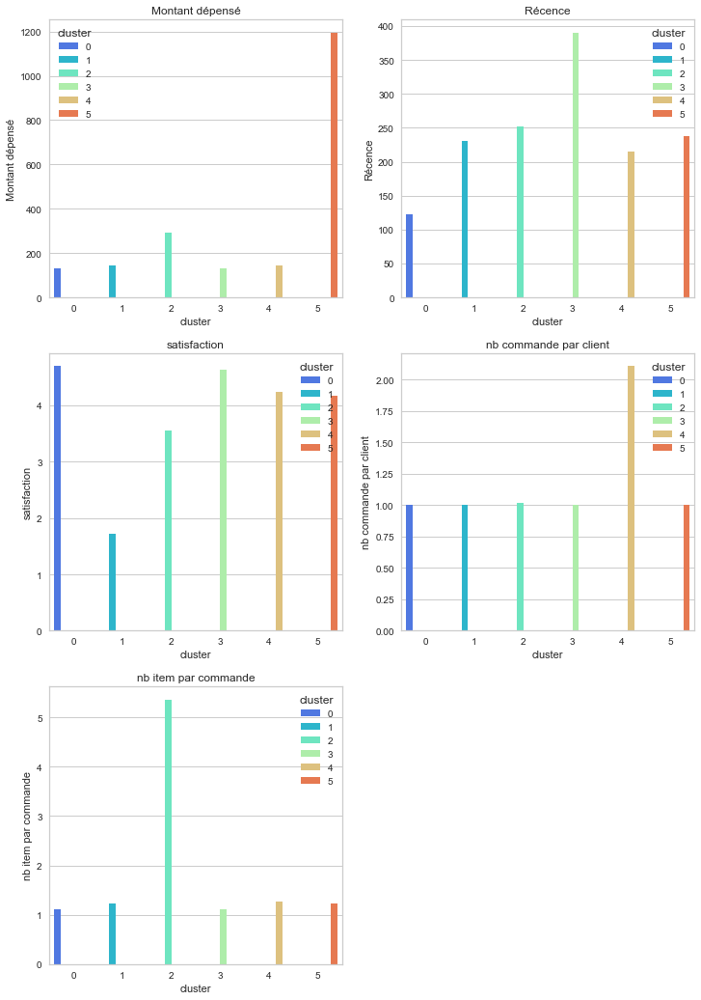

In [156]:
plt.figure(figsize=(12, 18))
compteur = 1
for feature in nom_colonnes:
    plt.subplot(3, 2, compteur)
    plt.title(feature)
    sns.barplot(data=centroides_no_cleaning,
                y=feature,
                x='cluster',
                hue='cluster',
                palette='rainbow')
    compteur += 1

### Comparaison

Comparaison des clusters KMeans avec k=6 sur les données :
- montant dépensé
- recence
- satisfaction
- nb commande par client
- nb item par commande

Avec et sans nettoyage

#### accuracy

In [157]:
# modèle de référence = celui avec features nettoyées
X = data.drop(['customer_unique_id', 'product_meta_category'], axis=1)
X_kmeans = X.drop(['encombrement_dm3',
                   'delais livraison'],
                  axis=1)
X_quanti = list(X_kmeans.select_dtypes(['float64', 'int64']).columns)
preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

kmeans = make_pipeline(preprocessor_quanti,
                       KMeans(n_clusters=6,
                              random_state=0))
label_true = kmeans.fit_predict(X_kmeans)

In [158]:
# modèle à comparer : celui calculé sur toutes les features
# (pas de nettoyage)
# => fit sur données non nettoyées
#    + predict sur données nettoyées pour pouvoir comparer
X_no_cleaning = data_no_cleaning.drop(['customer_unique_id',
                                       'product_meta_category',
                                       'nb total item par client'], axis=1)
X_kmeans_no_cleaning = X.drop(['encombrement_dm3',
                               'delais livraison'],
                              axis=1)
X_quanti = list(X_kmeans_no_cleaning.select_dtypes(['float64', 'int64']).columns)
preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

kmeans_no_cleaning = make_pipeline(preprocessor_quanti,
                                   KMeans(n_clusters=6,
                                          random_state=0))
kmeans_no_cleaning.fit(X_kmeans_no_cleaning)
label_pred = kmeans_no_cleaning.predict(X_kmeans)

11:80: E501 line too long (81 > 79 characters)


In [159]:
accuracy_clustering(label_true, label_pred)

1.0

==> pas de différence siginificative entre les deux calculs

#### ARI

In [160]:
adjusted_rand_score(label_true, label_pred)

1.0

==> pas de différence siginificative entre les deux calculs

## CHOIX CLUSTER KMEANS

Le meilleur clustering est obtenu avec un KMeans, k=6 sur les features suivantes :
- Montant dépensé,
- Récence,
- Satisfaction,
- nb commande par client
- nb item par commande

Le nettoyage préalable des features ne permet pas de gain de qualité du clustering, il n'est donc pas conseillé de réaliser cette étape de nettoyage, tout en gardant en tête qu'il faudra être vigilant si des données erronées sont rentrées en base.

Ce qui permet d'obtenir les clusters suivants :
- cluster 0 : clients les plus récents, une seule ommande
- cluster 1 : clients n'ayant pas commandé depuis longtemps, une seule commande
- cluster 2 : clients insatisfaits
- cluster 3 : clients ayant commandé plus d'une fois
- cluster 4 : clients ayant commandé plusieurs item par commande, moyennement satisfaits
- cluster 5 : clients ayant dépensé plus d'argent que les autres

Avec un score de Davies-Bouldin de 0.86 et un score de silhouette de 0.37

# DBSCAN

In [161]:
# sous-échantillonnage pour faciliter le calcul du DBSCAN
data_sample = data.sample(frac=0.5)
data_sample.shape

(40138, 9)

In [162]:
X = data_sample.drop(['customer_unique_id',
                      'product_meta_category',
                      'encombrement_dm3',
                      'delais livraison'],
                     axis=1).dropna(axis=0)

# listes de variables quantitatives vs qualitatives
X_quanti = list(X.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [163]:
X.describe(include='all')

,Montant dépensé,Récence,satisfaction,nb commande par client,nb item par commande
count,40138.000000,40138.000000,40138.000000,40138.000000,40138.000000
mean,157.421916,239.267951,4.147468,1.026982,1.187579
std,204.282426,151.189553,1.284374,0.177164,0.627184
min,3.776667,0.000000,1.000000,1.000000,1.000000
25%,61.690000,116.000000,4.000000,1.000000,1.000000
50%,104.615000,222.000000,5.000000,1.000000,1.000000
75%,175.975000,349.000000,5.000000,1.000000,1.000000
max,4764.340000,601.000000,5.000000,5.000000,13.000000


In [164]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X)

## test

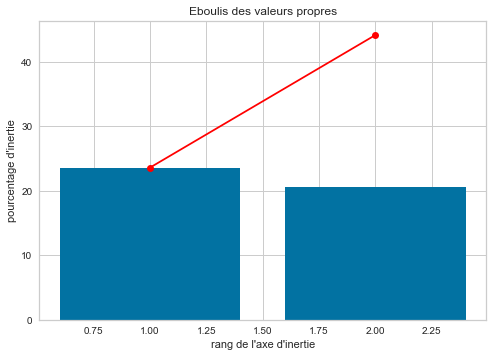

Temps d'exécution : 0.11s


In [165]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

score Davies-Bouldin : 1.56
score Silhouette : 0.10
nb clusters = 46
nb points of noise = 802 (soit 2.00%)
Temps d'exécution : 23.61s


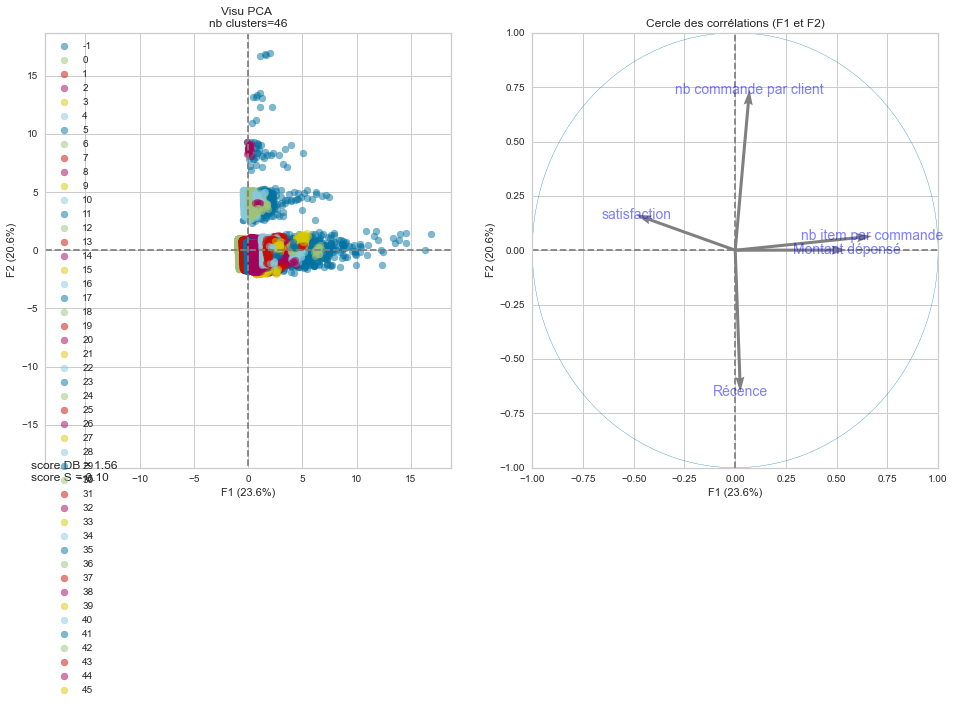

8:80: E501 line too long (84 > 79 characters)
18:80: E501 line too long (91 > 79 characters)
20:80: E501 line too long (87 > 79 characters)
28:34: E231 missing whitespace after ','
29:36: E251 unexpected spaces around keyword / parameter equals
29:38: E251 unexpected spaces around keyword / parameter equals
31:80: E501 line too long (83 > 79 characters)
31:84: W291 trailing whitespace
36:14: E231 missing whitespace after ','
36:16: E231 missing whitespace after ','
37:62: E231 missing whitespace after ','
37:74: E251 unexpected spaces around keyword / parameter equals
37:76: E251 unexpected spaces around keyword / parameter equals
37:80: E501 line too long (95 > 79 characters)


In [166]:
start = timeit.default_timer()

plt.figure(figsize=(16, 8))

dbscan = make_pipeline(preprocessor_quanti, DBSCAN())
X_cluster = dbscan.fit_predict(X)
X_scaled = pd.DataFrame(dbscan['columntransformer'].fit_transform(X),
                        columns=dbscan['columntransformer'].get_feature_names_out())
DB_score = davies_bouldin_score(X_scaled, X_cluster)
S_score = silhouette_score(X_scaled, X_cluster)

labels = dbscan.named_steps['dbscan'].labels_

# Number of clusters in labels, ignoring noise if present.
nb_cluster = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print('score Davies-Bouldin : {:.2f}\nscore Silhouette : {:.2f}'.format(DB_score, S_score))
print('nb clusters = {}'.format(nb_cluster))
print('nb points of noise = {} (soit {:.2f}%)'.format(n_noise, 100*n_noise/X.shape[0]))

# Affichage PCA
plt.subplot(1, 2, 1)
plt.title("Visu PCA \nnb clusters={}".format(nb_cluster))
display_factorial_planes_visu(X_projected,
                              n_comp,
                              pca.named_steps['pca'],
                              [(0,1)],
                              alpha = 0.5,
                              illustrative_var=X_cluster)
plt.text(-20, -20, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score), 
         horizontalalignment='left', verticalalignment='bottom')

# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(1,2,2)
display_circles_visu(pcs, n_comp, pca.named_steps['pca'], [(0,1)], labels = np.array(features))


duree = Affichage_duree(start)

## Tests parametres epsilon et n_min

----------
epsilon=0.1
n_min=10
nombre de clusters trouvé :  59
score Davies-Bouldin : 1.50
score Silhouette : -0.18
nb points of noise = 6793 (soit 16.92%)
Temps d'exécution : 19.05s
title
display
text
----------
epsilon=0.1
n_min=20
nombre de clusters trouvé :  23
score Davies-Bouldin : 1.59
score Silhouette : -0.21
nb points of noise = 9976 (soit 24.85%)
Temps d'exécution : 19.00s
title
display
text
----------
epsilon=0.1
n_min=50
nombre de clusters trouvé :  10
score Davies-Bouldin : 1.63
score Silhouette : -0.08
nb points of noise = 15754 (soit 39.25%)
Temps d'exécution : 18.74s
title
display
text
----------
epsilon=1
n_min=10
nombre de clusters trouvé :  9
score Davies-Bouldin : 1.64
score Silhouette : 0.28
nb points of noise = 374 (soit 0.93%)
Temps d'exécution : 30.55s
title
display
text
----------
epsilon=1
n_min=20
nombre de clusters trouvé :  8
score Davies-Bouldin : 1.57
score Silhouette : 0.28
nb points of noise = 554 (soit 1.38%)
Temps d'exécution : 30.72s
title
display
t

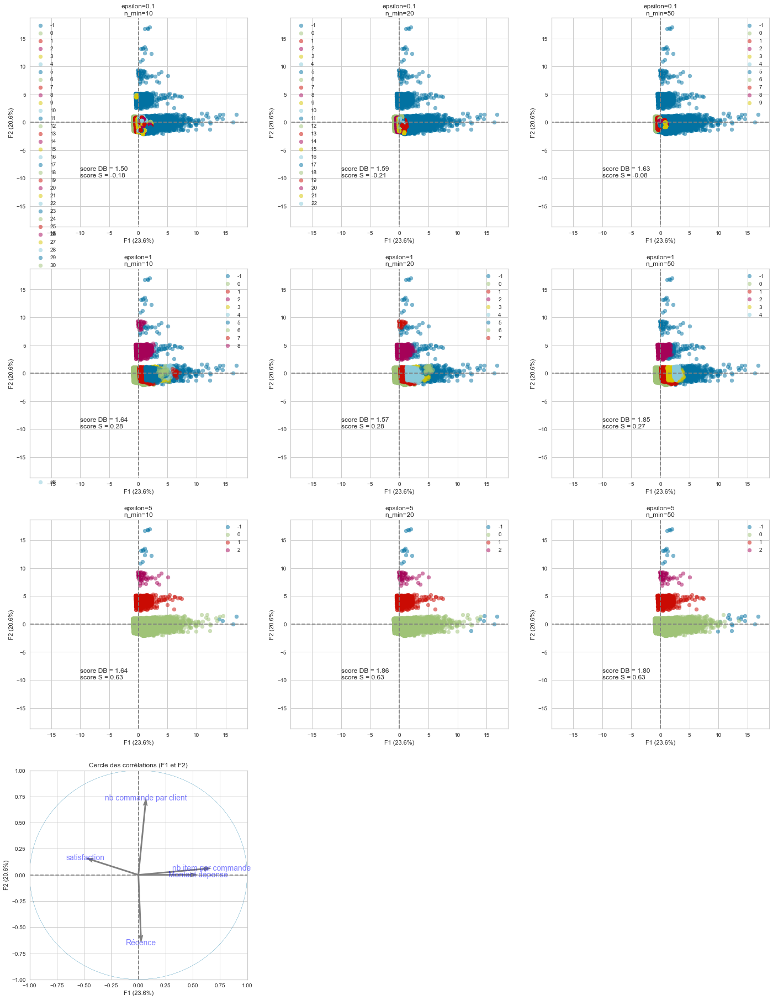

19:80: E501 line too long (81 > 79 characters)
20:80: E501 line too long (96 > 79 characters)
31:80: E501 line too long (103 > 79 characters)
32:80: E501 line too long (99 > 79 characters)
44:80: E501 line too long (95 > 79 characters)
48:9: E722 do not use bare 'except'


In [167]:
start_0 = timeit.default_timer()

eps = [0.1, 1, 5]
n_min = [10, 20, 50]

compteur = 1
plt.figure(figsize=(24, 32))

for epsilon in eps:
    for n in n_min:
        try:
            print("-"*10)
            print("epsilon={}\nn_min={}".format(epsilon, n))
            start = timeit.default_timer()
            dbscan = make_pipeline(preprocessor_quanti,
                                   DBSCAN(eps=epsilon,
                                          min_samples=n))
            X_cluster = dbscan.fit_predict(X)
            X_scaled = pd.DataFrame(dbscan['columntransformer'].fit_transform(X),
                                    columns=dbscan['columntransformer'].get_feature_names_out())

            DB_score = davies_bouldin_score(X_scaled, X_cluster)
            S_score = silhouette_score(X_scaled, X_cluster)
            labels = dbscan.named_steps['dbscan'].labels_

            # Number of clusters in labels, ignoring noise if present.
            nb_cluster = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = list(labels).count(-1)

            print("nombre de clusters trouvé : ", nb_cluster)
            print('score Davies-Bouldin : {:.2f}\nscore Silhouette : {:.2f}'.format(DB_score, S_score))
            print('nb points of noise = {} (soit {:.2f}%)'.format(n_noise, 100*n_noise/X.shape[0]))
            duree = Affichage_duree(start)
            plt.subplot(4, 3, compteur)
            plt.title("epsilon={}\nn_min={}".format(epsilon, n))
            print('title')
            display_factorial_planes_visu(X_projected,
                                          n_comp,
                                          pca.named_steps['pca'],
                                          [(0, 1)],
                                          alpha=0.5,
                                          illustrative_var=X_cluster)
            print('display')
            plt.text(-10, -10, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
                     horizontalalignment='left', verticalalignment='bottom')
            print('text')
            compteur += 1
        except:
            print("-"*10)
            print("epsilon={}\nn_min={}".format(epsilon, n))
            print("NON CONVERGENCE")
            pass

# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(4, 3, compteur)
display_circles_visu(pcs,
                     n_comp,
                     pca.named_steps['pca'],
                     [(0, 1)],
                     labels=np.array(features))

duree = Affichage_duree(start_0)

score Davies-Bouldin : 1.64
score Silhouette : 0.63
nb clusters = 3
nb points of noise = 17 (soit 0.04%)
Temps d'exécution : 1.34min


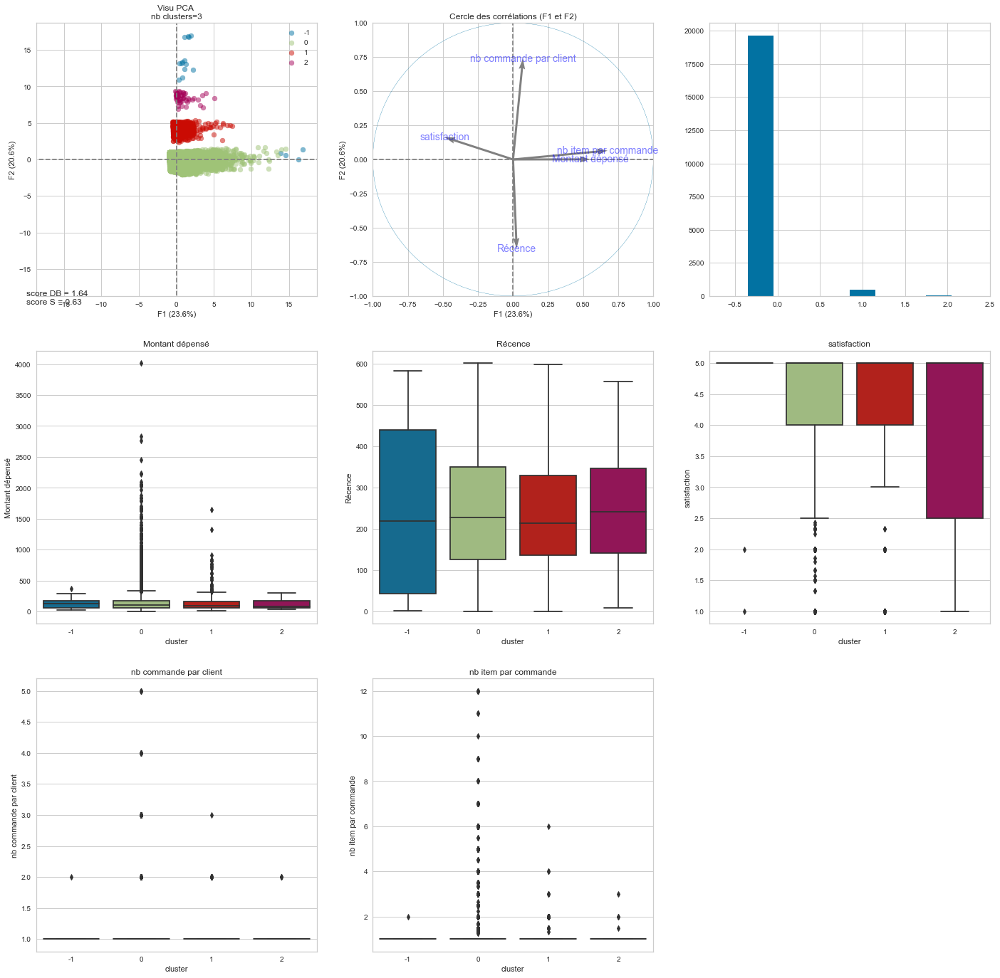

11:80: E501 line too long (84 > 79 characters)
21:80: E501 line too long (91 > 79 characters)
23:80: E501 line too long (87 > 79 characters)
34:80: E501 line too long (83 > 79 characters)
57:23: E703 statement ends with a semicolon


In [168]:
start = timeit.default_timer()

plt.figure(figsize=(24, 24))
compteur = 1

dbscan = make_pipeline(preprocessor_quanti,
                       DBSCAN(eps=5,
                              min_samples=10))
X_cluster = dbscan.fit_predict(X)
X_scaled = pd.DataFrame(dbscan['columntransformer'].fit_transform(X),
                        columns=dbscan['columntransformer'].get_feature_names_out())
DB_score = davies_bouldin_score(X_scaled, X_cluster)
S_score = silhouette_score(X_scaled, X_cluster)

labels = dbscan.named_steps['dbscan'].labels_

# Number of clusters in labels, ignoring noise if present.
nb_cluster = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print('score Davies-Bouldin : {:.2f}\nscore Silhouette : {:.2f}'.format(DB_score, S_score))
print('nb clusters = {}'.format(nb_cluster))
print('nb points of noise = {} (soit {:.2f}%)'.format(n_noise, 100*n_noise/X.shape[0]))

# Affichage PCA
plt.subplot(3, 3, compteur)
plt.title("Visu PCA \nnb clusters={}".format(nb_cluster))
display_factorial_planes_visu(X_projected,
                              n_comp,
                              pca.named_steps['pca'],
                              [(0, 1)],
                              alpha=0.5,
                              illustrative_var=X_cluster)
plt.text(-20, -20, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
         horizontalalignment='left', verticalalignment='bottom')
compteur += 1

# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(3, 3, compteur)
display_circles_visu(pcs,
                     n_comp,
                     pca.named_steps['pca'],
                     [(0, 1)],
                     labels=np.array(features))
compteur += 1

# pour affichage des boxplot
resultat = X.copy()
X_cluster = pd.DataFrame(X_cluster, columns=['cluster'])
resultat = resultat.merge(X_cluster, left_index=True, right_index=True)

# affichage du nombre d'individu par classe
plt.subplot(3, 3, compteur)
plt.hist(resultat['cluster'],
         range=(-0.5, resultat['cluster'].max()+0.5),
         align='left');

compteur += 1

# # Affichage boxplot
for feature in X.columns:
    plt.subplot(3, 3, compteur)
    plt.title(feature)
    sns.boxplot(data=resultat,
                y=feature,
                x='cluster')
    compteur += 1

stats = resultat.groupby('cluster').agg(['mean', 'median', 'var'])


duree = Affichage_duree(start)

In [169]:
resultat['cluster'].value_counts()

 0    19609
 1      481
 2       27
-1       11
Name: cluster, dtype: int64

### Epsilon = 1, n_min = 20

score Davies-Bouldin : 1.57
score Silhouette : 0.28
nb clusters = 8
nb points of noise = 554 (soit 1.38%)
Temps d'exécution : 32.88s


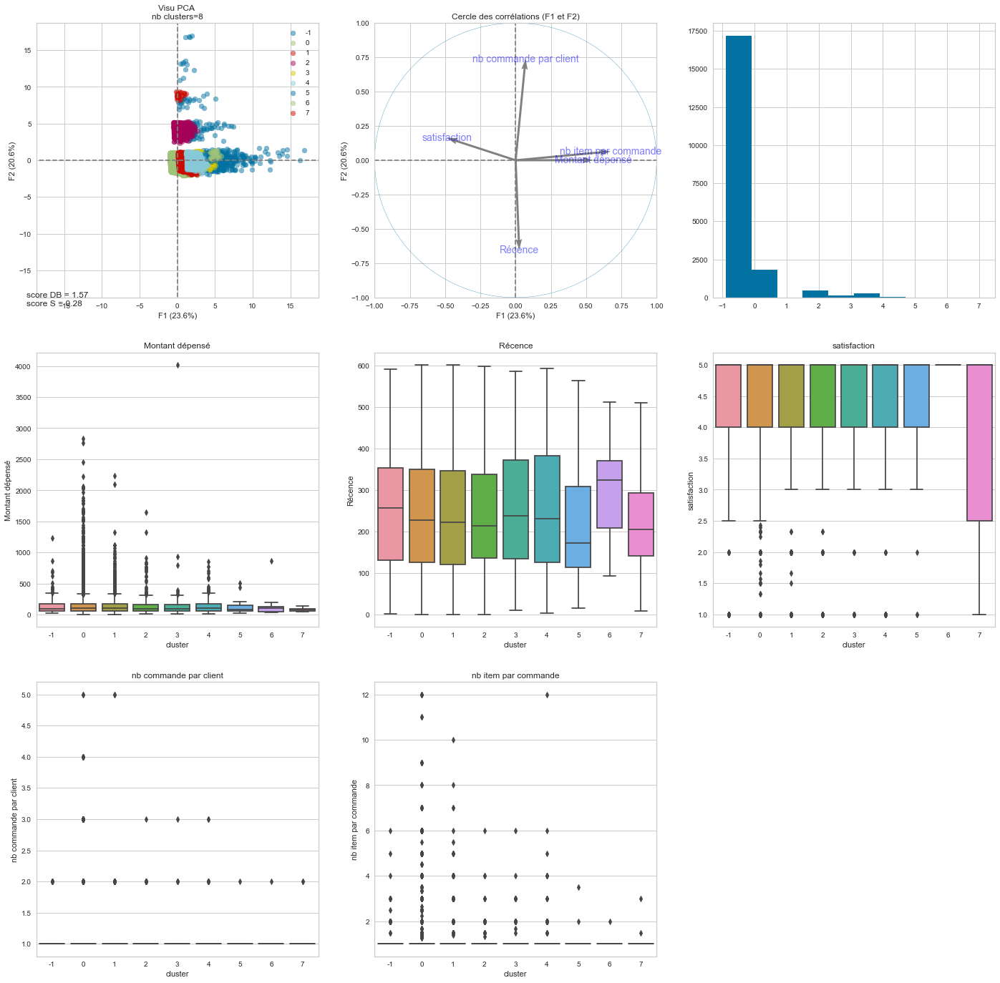

11:80: E501 line too long (84 > 79 characters)
21:80: E501 line too long (91 > 79 characters)
23:80: E501 line too long (87 > 79 characters)
34:80: E501 line too long (83 > 79 characters)
57:23: E703 statement ends with a semicolon


In [170]:
start = timeit.default_timer()

plt.figure(figsize=(24, 24))
compteur = 1

dbscan = make_pipeline(preprocessor_quanti,
                       DBSCAN(eps=1,
                              min_samples=20))
X_cluster = dbscan.fit_predict(X)
X_scaled = pd.DataFrame(dbscan['columntransformer'].fit_transform(X),
                        columns=dbscan['columntransformer'].get_feature_names_out())
DB_score = davies_bouldin_score(X_scaled, X_cluster)
S_score = silhouette_score(X_scaled, X_cluster)

labels = dbscan.named_steps['dbscan'].labels_

# Number of clusters in labels, ignoring noise if present.
nb_cluster = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print('score Davies-Bouldin : {:.2f}\nscore Silhouette : {:.2f}'.format(DB_score, S_score))
print('nb clusters = {}'.format(nb_cluster))
print('nb points of noise = {} (soit {:.2f}%)'.format(n_noise, 100*n_noise/X.shape[0]))

# Affichage PCA
plt.subplot(3, 3, compteur)
plt.title("Visu PCA \nnb clusters={}".format(nb_cluster))
display_factorial_planes_visu(X_projected,
                              n_comp,
                              pca.named_steps['pca'],
                              [(0, 1)],
                              alpha=0.5,
                              illustrative_var=X_cluster)
plt.text(-20, -20, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score, S_score),
         horizontalalignment='left', verticalalignment='bottom')
compteur += 1

# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(3, 3, compteur)
display_circles_visu(pcs,
                     n_comp,
                     pca.named_steps['pca'],
                     [(0, 1)],
                     labels=np.array(features))
compteur += 1

# pour affichage des boxplot
resultat = X.copy()
X_cluster = pd.DataFrame(X_cluster, columns=['cluster'])
resultat = resultat.merge(X_cluster, left_index=True, right_index=True)

# affichage du nombre d'individu par classe
plt.subplot(3, 3, compteur)
plt.hist(resultat['cluster'],
         range=(-0.5, resultat['cluster'].max()+0.5),
         align='left');

compteur += 1

# # Affichage boxplot
for feature in X.columns:
    plt.subplot(3, 3, compteur)
    plt.title(feature)
    sns.boxplot(data=resultat,
                y=feature,
                x='cluster')
    compteur += 1

stats = resultat.groupby('cluster').agg(['mean', 'median', 'var'])


duree = Affichage_duree(start)

In [171]:
resultat['cluster'].value_counts()

 0    17149
 1     1809
 2      448
-1      276
 4      276
 3      125
 5       21
 6       13
 7       11
Name: cluster, dtype: int64

## CONCLUSION
Les résultats du clustering DBSCAN sont beaucoup plus difficile à interpréter que ceux obtenus par KMeans. Aucun groupe franc ne se distingue dans les clusters.

# KMedoids

## Data

In [172]:
# sous-échantillonnage pour faciliter le calcul du DBSCAN
data_sample = data.sample(frac=0.5)
data_sample.shape

(40138, 9)

In [173]:
X = data_sample.drop(['customer_unique_id',
                      'product_meta_category',
                      'encombrement_dm3',
                      'delais livraison'],
                     axis=1).dropna(axis=0)

# listes de variables quantitatives vs qualitatives
X_quanti = list(X.select_dtypes(['float64', 'int64']).columns)

preprocessor_quanti = make_column_transformer((quanti_pipeline, X_quanti))

In [174]:
scaler = StandardScaler()
X_scale = scaler.fit_transform(X)

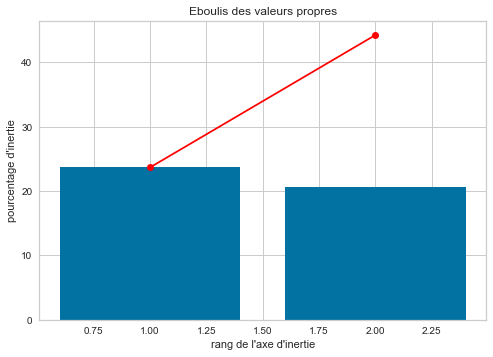

Temps d'exécution : 0.14s


In [175]:
start = timeit.default_timer()

# choix du nombre de composantes à calculer
n_comp = 2
features = X.columns

# Calcul des composantes principales
pca = make_pipeline(preprocessor_quanti,
                    decomposition.PCA(n_components=n_comp))
pca.fit(X)

# Eboulis des valeurs propres
display_scree_plot(pca.named_steps['pca'])

X_transformed = pca.named_steps['columntransformer'].transform(X)

# Projection des individus
X_projected = pca.named_steps['pca'].transform(X_transformed)


duree = Affichage_duree(start)

## Test yellowbrick : choix k

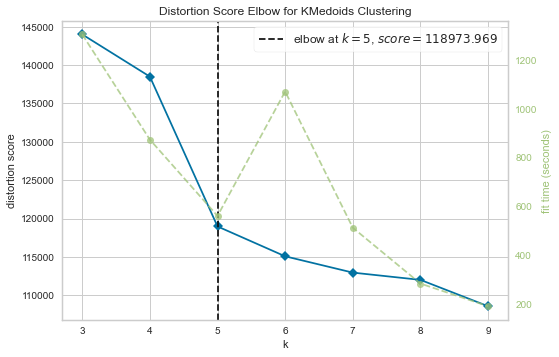

Temps d'exécution : 1.33h


7:19: E703 statement ends with a semicolon


In [176]:
start = timeit.default_timer()
# Instantiate the clustering model and visualizer
model = KMedoids(random_state=0)
visualizer1 = KElbowVisualizer(model, k=(3, 10))

visualizer1.fit(X_scale)        # Fit the data to the visualizer
visualizer1.show();        # Finalize and render the figure

duree = Affichage_duree(start)

## test avec k=5

score Davies-Bouldin : 1.38
score Silhouette : 0.23
nb clusters = 5
Temps d'exécution : 11.38min


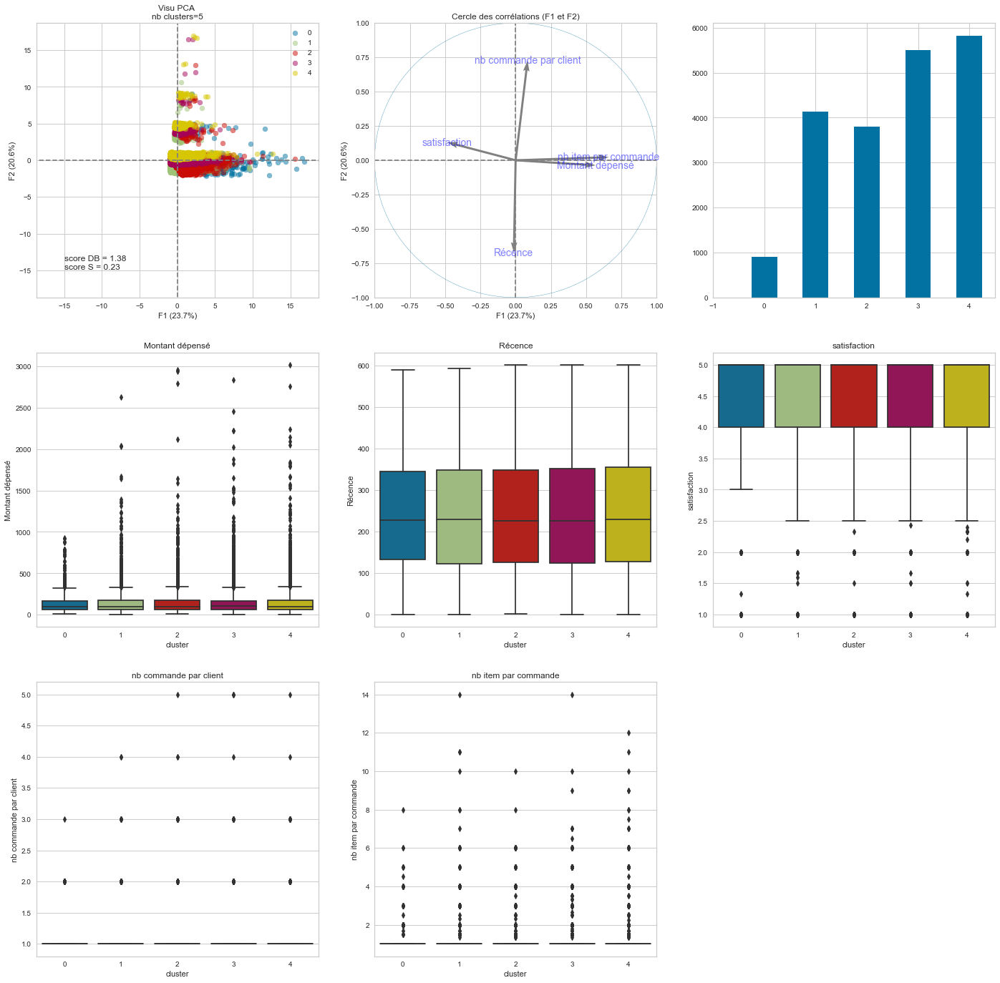

10:80: E501 line too long (90 > 79 characters)
20:80: E501 line too long (95 > 79 characters)
32:80: E501 line too long (87 > 79 characters)
55:23: E703 statement ends with a semicolon


In [177]:
start = timeit.default_timer()

plt.figure(figsize=(24, 24))
compteur = 1

kmedoids_5 = make_pipeline(preprocessor_quanti,
                           KMedoids(n_clusters=5))
X_cluster_5 = kmedoids_5.fit_predict(X)
X_scaled_5 = pd.DataFrame(kmedoids_5['columntransformer'].fit_transform(X),
                          columns=kmedoids_5['columntransformer'].get_feature_names_out())
DB_score_5 = davies_bouldin_score(X_scaled_5, X_cluster_5)
S_score_5 = silhouette_score(X_scaled_5, X_cluster_5)

labels_5 = kmedoids_5.named_steps['kmedoids'].labels_
centroides_5 = kmedoids_5.named_steps['kmedoids'].cluster_centers_

# Number of clusters in labels, ignoring noise if present.
nb_cluster_5 = len(set(labels_5)) - (1 if -1 in labels_5 else 0)

print('score Davies-Bouldin : {:.2f}\nscore Silhouette : {:.2f}'.format(DB_score_5, S_score_5))
print('nb clusters = {}'.format(nb_cluster_5))

# Affichage PCA
plt.subplot(3, 3, compteur)
plt.title("Visu PCA \nnb clusters={}".format(nb_cluster_5))
display_factorial_planes_visu(X_projected,
                              n_comp,
                              pca.named_steps['pca'],
                              [(0, 1)],
                              alpha=0.5,
                              illustrative_var=X_cluster_5)
plt.text(-15, -15, 'score DB = {:.2f}\nscore S = {:.2f}'.format(DB_score_5, S_score_5),
         horizontalalignment='left', verticalalignment='bottom')
compteur += 1

# Cercle des corrélations pour les 2 premiers rangs d'inertie
pcs = pca.named_steps['pca'].components_
plt.subplot(3, 3, compteur)
display_circles_visu(pcs,
                     n_comp,
                     pca.named_steps['pca'],
                     [(0, 1)],
                     labels=np.array(features))
compteur += 1

# pour affichage des boxplot
resultat_5 = X.copy()
X_cluster_5 = pd.DataFrame(X_cluster_5, columns=['cluster'])
resultat_5 = resultat_5.merge(X_cluster_5, left_index=True, right_index=True)

# affichage du nombre d'individu par classe
plt.subplot(3, 3, compteur)
plt.hist(resultat_5['cluster'],
         range=(-0.5, resultat_5['cluster'].max()+0.5),
         align='left');

compteur += 1

# # Affichage boxplot
for feature in X.columns:
    plt.subplot(3, 3, compteur)
    plt.title(feature)
    sns.boxplot(data=resultat_5,
                y=feature,
                x='cluster')
    compteur += 1

stats_5 = resultat_5.groupby('cluster').agg(['mean', 'median', 'var'])

duree = Affichage_duree(start)

In [178]:
stats_5

Montant dépensé                             Récence         \
                   mean    median           var        mean median   
cluster                                                              
0            139.323064   98.6100  18165.173071  243.612832  227.0   
1            142.254959  101.2200  22493.942631  243.645435  229.0   
2            143.581496  100.6250  26730.705412  243.150764  226.0   
3            144.731333  101.6300  26231.327916  241.828935  225.0   
4            145.811476  100.4825  28099.857979  245.294634  229.0   

                      satisfaction                  nb commande par client  \
                  var         mean median       var                   mean   
cluster                                                                      
0        20711.854365     4.139018    5.0  1.655373               1.036504   
1        21416.013303     4.105390    5.0  1.710748               1.032453   
2        21185.203734     4.141663    5.0  1.622559               1.042963   
3        21578.929232     4.146885    5.0  1.656492               1.042584   
4        21617.300584     4.089628    5.0  1.739326               1.036808   

                         nb item par commande                   
        median       var                 mean median       var  
cluster                                                         
0          1.0  0.037426             1.189897    1.0  0.382442  
1          1.0  0.037706             1.191693    1.0  0.418072  
2          1.0  0.056419             1.196644    1.0  0.370553  
3          1.0  0.052791             1.198417    1.0  0.393925  
4          1.0  0.042684             1.199045    1.0  0.410095

aucun groupe ne ressort distinctement

In [179]:
Affichage_duree(start_time_ALL)

Temps d'exécution : 7.47h


26901.2688614